### Sales pred simple ranking  
## ***Experience*** **53**:  
### -aggregated sales in different stores  
### -single-general learner  
### -with markdowns and is holiday.

## Contributions:
### - wide range of methods 
### - department based error(p_err and n_err) calculation
### - waited error ranking (check EXPLAIN method in exact folder)

In [2]:
# 0-importing necessary packages

import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from datetime import datetime
import statsmodels.api as sm
from pycaret.regression import *
import xgboost as xgb
import catboost as ctb
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.graphics.tsaplots import plot_acf
import shap
import sqlite3

from tkinter import *
from tkinter import ttk

print('Importing libraries: Done')

Importing libraries: Done


In [ ]:
def calculate(*args):
    try:
        value = float(feet.get())
        meters.set((0.3048 * value * 10000.0 + 0.5)/10000.0)
    except ValueError:
        pass

root = Tk()
root.title("AI predictor software")

mainframe = ttk.Frame(root, padding="10 10 10 10")
mainframe.grid(column=0, row=0, sticky=(N, W, E, S))
mainframe.columnconfigure(0, weight=1)
mainframe.rowconfigure(0, weight=1)

feet = StringVar()
meters = StringVar()

feet_entry = ttk.Entry(mainframe, width=7, textvariable=feet)
feet_entry.grid(column=2, row=1, sticky=(W, E))

ttk.Label(mainframe, textvariable=meters).grid(column=2, row=2, sticky=(W, E))
ttk.Button(mainframe, text="Calculate", command=calculate).grid(column=3, row=3,
sticky=W)
ttk.Label(mainframe, text="feet").grid(column=3, row=1, sticky=W)
ttk.Label(mainframe, text="is equivalent to").grid(column=1, row=2, sticky=E)
ttk.Label(mainframe, text="meters").grid(column=3, row=2, sticky=W)

for child in mainframe.winfo_children():
    child.grid_configure(padx=5, pady=5)
    feet_entry.focus()
    root.bind('<Return>', calculate)
                                                   
root.mainloop()

In [2]:
# 1-Inputs operation


# 1-1 Checking inputs
print("Folder's files : ",os.listdir('inputs'), '\n')

# 1-2 Reading input CSV files and assigning a name to each one of them 
dataset = pd.read_csv("inputs/train.csv", names=['Store','Dept','Date','weeklySales','isHoliday'],sep=',', header=0)
features = pd.read_csv("inputs/features.csv",sep=',', header=0,names=['Store','Date','Temperature','Fuel_Price','MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5','CPI','Unemployment','IsHoliday']).drop(columns=['IsHoliday'])
stores = pd.read_csv("inputs/stores.csv", names=['Store','Type','Size'],sep=',', header=0)

# 1-3 Creating needed directories
os.makedirs('temp_test', exist_ok=True)
os.makedirs('input_analysis', exist_ok=True)
os.makedirs('pred_output', exist_ok=True)
os.makedirs('pred_output/exp52', exist_ok=True)
os.makedirs('output_analysis', exist_ok=True)
os.makedirs('output_analysis/exp52', exist_ok=True)

# 1-4 Flating data(merging different data bases into one table)
dataset = dataset.merge(stores, how='left').merge(features, how='left')  

# 1-5 Decreasing unnecessary memory usage 
dataset['Store'] = dataset['Store'].astype('int16')
dataset['Dept'] = dataset['Dept'].astype('int16')
dataset['weeklySales'] = dataset['weeklySales'].astype('float64')

# 1-6 Printing flatted dataset
print('─' * 100,'\n Original dataset sample: \n', dataset)

# 1-7 Creating sql database
database = "database.sqlite"
conn = sqlite3.connect(database)
dataset.to_sql(name='input', if_exists="replace", index = False, con=conn)
conn.close()

Folder's files :  ['features.csv', 'inputs.rar', 'inputs.zip', 'stores.csv', 'test.csv', 'train.csv'] 

──────────────────────────────────────────────────────────────────────────────────────────────────── 
 Original dataset sample: 
         Store  Dept        Date  weeklySales  isHoliday Type    Size  \
0           1     1  2010-02-05     24924.50      False    A  151315   
1           1     1  2010-02-12     46039.49       True    A  151315   
2           1     1  2010-02-19     41595.55      False    A  151315   
3           1     1  2010-02-26     19403.54      False    A  151315   
4           1     1  2010-03-05     21827.90      False    A  151315   
...       ...   ...         ...          ...        ...  ...     ...   
421565     45    98  2012-09-28       508.37      False    B  118221   
421566     45    98  2012-10-05       628.10      False    B  118221   
421567     45    98  2012-10-12      1061.02      False    B  118221   
421568     45    98  2012-10-19       760.01  

In [3]:
# 2-Data extraction

# 2-1 Deriving a sub-dataset from main dataset 
dataset_sub1 = dataset[['Date','Dept','Store', 'Type','MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5','isHoliday','weeklySales']]
dataset_sub1 = dataset_sub1.sort_index(axis=0)

# 2-2 getting list of unique departments' values
dept_list = dataset_sub1['Dept'].unique()
dept_list.sort()

# 2-3 getting list of unique stores' values
store_list = dataset_sub1['Store'].unique()
store_list.sort()

# 2-4 getting list of unique dates
date_list = dataset_sub1['Date'].unique()
date_list.sort()

# 2-5 Check printing 
print('Dataset_sub1: \n',dataset_sub1)
print('─' * 100,'\n List of Departments: \n',dept_list,'\n')
print('─' * 100,'\n List of Stores: \n',store_list,'\n')
print('─' * 100,'\n List of Dates: \n',date_list)

# Deriving a sub-dataset from main dataset which considers 9 more important features
#datasub_sub3 = dataset[['Date','Store','Dept','weeklySales','MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5']]
#dataset_sub3 = dataset_sub3.sort_index(axis=0)
#Print('\n\n', dataset_sub3.tail(5))

Dataset_sub1: 
               Date  Dept  Store Type  MarkDown1  MarkDown2  MarkDown3  \
0       2010-02-05     1      1    A        NaN        NaN        NaN   
1       2010-02-12     1      1    A        NaN        NaN        NaN   
2       2010-02-19     1      1    A        NaN        NaN        NaN   
3       2010-02-26     1      1    A        NaN        NaN        NaN   
4       2010-03-05     1      1    A        NaN        NaN        NaN   
...            ...   ...    ...  ...        ...        ...        ...   
421565  2012-09-28    98     45    B    4556.61      20.64       1.50   
421566  2012-10-05    98     45    B    5046.74        NaN      18.82   
421567  2012-10-12    98     45    B    1956.28        NaN       7.89   
421568  2012-10-19    98     45    B    2004.02        NaN       3.18   
421569  2012-10-26    98     45    B    4018.91      58.08     100.00   

        MarkDown4  MarkDown5  isHoliday  weeklySales  
0             NaN        NaN      False     24924.50

In [4]:
# 3-Data cleaning

# 3-1 this function identifies departmets in different stores that have incomplete data or have below 0 sales values. the function then makes a dictionary of outliers(Test:OK)
def outlier_identifier(df, border_value, store_list, dept_list):
    data_map = pd.DataFrame(columns=['store', 'dept', 'number_of_entries', 'target_false_count', 'outlier_flag'])
    for i in store_list:
        for j in dept_list:
            number_of_entries = df[(df.Store == i) & (df.Dept == j)].Date.count()
            number_of_entries = number_of_entries.astype('int16')
            target_false_count = df[(df.weeklySales <= border_value) & (df.Store == 
                                                                        i) & (df.Dept == j)].weeklySales.count()
            target_false_count = target_false_count.astype('int16')
            if (number_of_entries == 143) & (target_false_count == 0):
                outlier_flag = 0
            else:
                outlier_flag = 1
            new_row = {'store': i, 'dept': j, 'number_of_entries': number_of_entries, 'target_false_count': target_false_count, 'outlier_flag': outlier_flag}
            data_map.loc[len(data_map)] = new_row
    return data_map

# 3-2 this function removes departmets in different stores that have incomplete data or have below 0 sales values.(Test:OK)
def outlier_remover(df, removal_map):
    for i in removal_map.index:
        a = removal_map.iloc[[i]].store
        a.reset_index(drop=True, inplace=True)
        b = removal_map.iloc[[i]].dept
        b.reset_index(drop=True, inplace=True)
        print('Store:', a[0], 'Department:', b[0],' Removed as outlier!','\n')
        index = df[(df.Store == a[0]) & (df.Dept == b[0])].index
        for j in index:
            df.drop(j , inplace=True)
    return df

# 3-3 Executing outlier identifier and save it as a mapping dataframe to know which store and department mix should be droped(Test:OK)
data_map = outlier_identifier(dataset_sub1, 0, store_list, dept_list)
removal_map = data_map[['store','dept','outlier_flag']]
removal_map = removal_map[removal_map.outlier_flag == 1]
removal_map.reset_index(drop=True, inplace=True)

# 3-4 Printing percentage of outlier data in compare with whole data
print('outlier percentage:', data_map[data_map.outlier_flag == 1].store.count() / 3645 ,'─' * 100, '\n')

# 3-5 Executing outlier remover
dataset_sub2 = outlier_remover(dataset_sub1, removal_map)

# 3-6 Filling empty numeric values with 0  &  reseting index
dataset_sub2 = dataset_sub2.fillna(0)
dataset_sub2 = dataset_sub2.reset_index(drop=True)

# 3-7 Outlier removing process is considerably time consuming, therefore we save it and recall cleaned data later.
dataset_sub2.to_csv('temp_test/dataset_sub2_exp52.csv') 

# 3-8 Saving cleaned dataset in sql db with given name 'clean_input'.
conn = sqlite3.connect(database)
dataset_sub2.to_sql(name='clean_input', if_exists="replace", index = False, con=conn)
conn.close()

# 3-9 Printing the result of data cleaning process
print('─' * 100, '\n Cleaned Dataset: \n', dataset_sub2)    

outlier percentage: 0.2792866941015089 ──────────────────────────────────────────────────────────────────────────────────────────────────── 

Store: 1 Department: 6  Removed as outlier! 

Store: 1 Department: 18  Removed as outlier! 

Store: 1 Department: 39  Removed as outlier! 

Store: 1 Department: 43  Removed as outlier! 

Store: 1 Department: 45  Removed as outlier! 

Store: 1 Department: 47  Removed as outlier! 

Store: 1 Department: 48  Removed as outlier! 

Store: 1 Department: 50  Removed as outlier! 

Store: 1 Department: 51  Removed as outlier! 

Store: 1 Department: 54  Removed as outlier! 

Store: 1 Department: 65  Removed as outlier! 

Store: 1 Department: 77  Removed as outlier! 

Store: 1 Department: 78  Removed as outlier! 

Store: 1 Department: 96  Removed as outlier! 

Store: 1 Department: 99  Removed as outlier! 

Store: 2 Department: 18  Removed as outlier! 

Store: 2 Department: 39  Removed as outlier! 

Store: 2 Department: 43  Removed as outlier! 

Store: 2 Depa

In [4]:
# 4-Reading cleaned dataset and updating some lists after cleaning

# 4-1 Reading saved clean data from memory
#dataset_sub2 = pd.read_csv("temp_test/dataset_sub2_exp51.csv", names=['Date','Dept','Store', 'Type','MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5','isHoliday','weeklySales'],sep=',', header=0)
conn = sqlite3.connect(database)
dataset_sub2 = pd.read_sql_query("SELECT * from clean_input", conn)
conn.close()

dataset_sub3 = dataset_sub2[['Date','Dept','weeklySales']]

# 4-2 Updating list of unique departments' values
dept_list = dataset_sub2['Dept'].unique()
dept_list.sort()

# 4-3 Updating list of unique stores' values
store_list = dataset_sub2['Store'].unique()
store_list.sort()

# 4-4 Updating list of unique dates
date_list = dataset_sub2['Date'].unique()
date_list.sort()

print('List of Departments:',dept_list,'\n')
print('─' * 100, '\n List of Stores: \n',store_list,'\n')
print('─' * 100, '\n List of Dates: \n',date_list)


List of Departments: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 16 17 19 20 21 22 23 24 25 26
 27 28 29 30 31 32 33 34 35 36 37 38 40 41 42 44 46 48 49 50 52 55 56 58
 59 60 65 67 71 72 74 79 80 81 82 83 85 87 90 91 92 93 94 95 96 97 98] 

──────────────────────────────────────────────────────────────────────────────────────────────────── 
 List of Stores: 
 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45] 

──────────────────────────────────────────────────────────────────────────────────────────────────── 
 List of Dates: 
 ['2010-02-05' '2010-02-12' '2010-02-19' '2010-02-26' '2010-03-05'
 '2010-03-12' '2010-03-19' '2010-03-26' '2010-04-02' '2010-04-09'
 '2010-04-16' '2010-04-23' '2010-04-30' '2010-05-07' '2010-05-14'
 '2010-05-21' '2010-05-28' '2010-06-04' '2010-06-11' '2010-06-18'
 '2010-06-25' '2010-07-02' '2010-07-09' '2010-07-16' '2010-07-23'
 '2010-07-30' '2010-08-06' '2010-08-13' '2010-08-

In [5]:
# 5-Defining experiment process, models, and methods

# 5-1 This function executes each step of the whole experiment process one by one.(Test:NA)
#Experiment51:
def experiment52(df, split_date, mdls, mix_mdls):
    y = aggregator(df)
    z = create_features(y)
    train, test = split_data(z, split_date)
    train2 = train.drop(columns=['Date'])
    test2 = test.drop(columns=['Date'])
    print('>create features and split_data func is Done! \n')
    
    best1, best2, best3, best4, best5 = mlsetup(train2, test2)
    print('\n >mlsetup func is Done! \n')

    result_log = result_log_init(test)
    result_log = create_models(mdls, test2, result_log)
    result_log = mix_methods(test2, result_log, best1, best2, best3, best4, best5)
    result_log.to_csv('output_analysis/exp52/result_log.csv')

    output_anal = output_analyzer(result_log, mdls, mix_mdls)
    output_anal.to_csv('output_analysis/exp52/output_anal.csv')
    
    print('\n >create_models func is Done! \n')
        
    #result_log_aggr_exp1.to_csv('output_analysis/exp1/result_log_aggr_exp1.csv')
    process_end_msg = '>>>>>>>>>>> Experience 52 is DONE! <<<<<<<<<<<<'
    print(process_end_msg)
    pass

# 5-2 This function aggregates stores weekly sales(Test:OK)
def aggregator(df):
    aggr = df.groupby(['Date','Dept'], as_index=False).sum()
    return aggr

# 5-3 This function gets a ataframe input and gives a dataframe output with transformed features. (Test:OK) 
# also the function reduces data types to minimum ram needed
def create_features(df):
    features = df
    features['Date'] = pd.to_datetime(df['Date'])
    features['dayofweek'] = df['Date'].dt.dayofweek
    features['quarter'] = df['Date'].dt.quarter
    features['month'] = df['Date'].dt.month
    features['year'] = df['Date'].dt.year
    features['dayofyear'] = df['Date'].dt.dayofyear
    features['dayofmonth'] = df['Date'].dt.day
    features['weekofyear'] = df['Date'].dt.weekofyear

    cols_int16 = ['dayofweek','quarter','month','year','dayofyear','dayofmonth','weekofyear', 'Dept']
    for col in cols_int16:
        features['{}'.format(col)] = df['{}'.format(col)].astype('int16')

    cols_float32 = ['weeklySales']
    for col in cols_float32:
        features['{}'.format(col)] = df['{}'.format(col)].astype('float32')
        
    X = features[['Date','dayofweek','quarter','month','year','dayofyear','dayofmonth','weekofyear', 'Dept', 'weeklySales']]
    X.index = features.index
    print('\n >>features: \n',X)
    return X

# 5-4 This function derives train and test datasets from a tmie-series database due to an input date(Test:OK)
def split_data(df, split_date):
    return df[df.Date < split_date].copy(), \
            df[df.Date >= split_date].copy()

# 5-5 This function sets up machine-learning process configurations(Test:NA)
def mlsetup(train, test):
    reg = setup(data = train,
            test_data = test,
            target = 'weeklySales',
            #categorical_features = ['Dept','dayofweek','quarter','month','year','dayofyear','dayofmonth','weekofyear'],
            #numeric_features = ['Date', 'Dept','Store','dayofweek','quarter','month','year','dayofyear','dayofmonth','weekofyear','MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5'],
            #preprocess = False,
            imputation_type = None, #We dont want to impute missing values because they are alreay imputed.
            #numeric_imputation = 'mean',
            #polynomial_features = False, #it means we do not want to take existing features and raise them to a power to capture non-linear relationships between the feature and the target variable.
            #transformation = False,
            #normalize = False,
            #normalize_method = 'zscore',
            #transform_target = False,
            #remove_multicollinearity = False,
            #multicollinearity_threshold = 0.95,
            remove_outliers = False,
            #outliers_method = 'ee' #options are 'ee', 'lof', 'iforest',
            #outliers_threshhold = 0.05,
            #feature_selection = False,
            #feature_selection_method = 'sequential',
            #feature_selection_estimator = 'lightgbm',
            #n_features_to_select = 0.2,
            use_gpu = True,
            #profile = True,
            #fold_strategy = 'kfold', #other options are 'kfold', 'groupkfold', 'timeseries'
            #fold = 2,  
            #fold_groups = 'dept',
            #data_split_shuffle = False,
            #fold_shuffle = True,
           )
    print('\n \n >>ML setup  IS  DONE! \n \n')
    best1 = compare_models(sort = 'MAPE', n_select = 1)
    best2 = compare_models(sort = 'MAPE', n_select = 2)
    best3 = compare_models(sort = 'MAPE', n_select = 3)
    best4 = compare_models(sort = 'MAPE', n_select = 4)
    best5 = compare_models(sort = 'MAPE', n_select = 5)
    #print('\n \n >>best = compare_models IS  DONE! \n \n')
    #evaluate_model(best)
    #print('\n \n >>evaluate_model(best) IS  DONE! \n \n')
    return best1, best2, best3, best4, best5
    #pass


# 5-6 This function
def result_log_init(test_df):  
    #initiating result log 
    result_log = pd.DataFrame()
    result_log.index = test_df.index
    result_log['Date'] = test_df['Date']
    result_log['Dept'] = test_df['Dept']
    result_log['actual'] = test_df['weeklySales'] 
    return result_log
    
# 5-7 This function creates, tunes, plots, finalizes, predicts, and evaluates all models in mdls list for a set of data (Test:NA)
def create_models(mdls, test, result_log):
    for mdl in mdls:
        mdll = create_model('{}'.format(mdl))
        print('\n \n >>mdll = create_model(mdl) for Model:{} IS  DONE! \n \n'.format(mdl))
        tuned_mdl = tune_model(mdll, n_iter = 10)
        print('\n \n >>tuned_mdl = tune_model(mdll) for Model:{} IS  DONE! \n \n'.format(mdl))
        
        #final_model_name = f'final_{mdl}'
        final_model = finalize_model(tuned_mdl)
        print('\n \n >>final_mdl = finalize_model(tuned_mdl) for Model:{} IS  DONE! \n \n'.format(mdl))
        
        plt(tuned_mdl)
        
        print(final_model)
        print('\n \n >>print(final_mdl) for Model:{} IS  DONE! \n \n'.format(mdl))
        
        #save_model(final_model, f'{mdl}')
        pred = predict_model(final_model, data=test)
        pred.to_csv('pred_output/exp52/{}_pred.csv'.format(mdl))
        print('\n \n >>pred_mdl = predict_model(final_mdl, data=test) for Model:{} IS  DONE! \n \n'.format(mdl))

        result_log = result_logger(mdl, pred, result_log)
        print('\n \n >> Prediction with Model:{}  IS  DONE!'.format(mdl))
        
    return result_log   
    #pass

# 5-8 This function
def plt(mdl):
    plot_model(mdl)
    plot_model(mdl, plot = 'error')
    plot_model(mdl, plot='feature')
    plot_model(mdl, plot = 'learning')
    plot_model(mdl, plot = 'manifold')
    plot_model(mdl, plot = 'feature_all')
    plot_model(mdl, plot = 'parameter')
    #plot_model(final_blend, plot = 'error')

    #interpret_model(mdl)
    #interpret_model(mdl, plot = 'correlation')
    #interpret_model(mdl, plot = 'reason', observation = 12)
        
    #plot_model(mdll)
    #print('\n \n >>plot_model(mdll) for Model:{} IS  DONE! \n \n'.format(mdl))
    #plot_model(mdll, plot = 'error')
    #print('\n \n >>plot_model(mdll, plot = error) for Model:{} IS  DONE! \n \n'.format(mdl))
    #plot_model(tuned_mdl, plot = 'feature')
    print('\n \n >>plotting is  DONE! \n \n')
    pass

# 5-9 This function
def result_logger(mdl, pred, result_log):  
    result_log[mdl] = pred.prediction_label
    result_log['{}_ape'.format(mdl)] = ((result_log.actual - result_log[mdl]) / result_log.actual).abs() 
    result_log['{}_pe'.format(mdl)] = ((result_log.actual - result_log[mdl]) / result_log.actual) 
    result_log['{}_pos_pe'.format(mdl)] = result_log[(result_log['{}_pe'.format(mdl)] >= 0)]['{}_pe'.format(mdl)]
    result_log['{}_neg_pe'.format(mdl)] = result_log[(result_log['{}_pe'.format(mdl)] < 0)]['{}_pe'.format(mdl)]
    result_log['{}_err_p2'.format(mdl)] = ((result_log.actual - result_log[mdl]) ** 2)
    return result_log

# 5-10 This function
def mix_methods(test, result_log, best1, best2, best3, best4, best5):
    
#Blend2
    blend2 = blend_models(best2)
    tuned_blend2 = tune_model(blend2, n_iter = 10)
    pred = predict_model(tuned_blend2, data=test)
    result_log = result_logger('blend2', pred, result_log)
    plt_mix(tuned_blend2)
    pred.to_csv('pred_output/exp52/blend2_pred.csv')
    print('\n \n >> Prediction with Model:blend2  IS  DONE!')

#Blend3
    blend3 = blend_models(best3)
    tuned_blend3 = tune_model(blend3, n_iter = 10)
    pred = predict_model(tuned_blend3, data=test)
    result_log = result_logger('blend3', pred, result_log)
    plt_mix(tuned_blend3)
    pred.to_csv('pred_output/exp52/blend3_pred.csv')
    print('\n \n >> Prediction with Model:blend3  IS  DONE!')

#Blend4
    blend4 = blend_models(best4)
    tuned_blend4 = tune_model(blend4, n_iter = 10)
    pred = predict_model(tuned_blend4, data=test)
    result_log = result_logger('blend4', pred, result_log)
    plt_mix(tuned_blend4)
    pred.to_csv('pred_output/exp52/blend4_pred.csv')
    print('\n \n >> Prediction with Model:blend4  IS  DONE!')

#Blend4
    blend5 = blend_models(best5)
    tuned_blend5 = tune_model(blend5, n_iter = 10)
    pred = predict_model(tuned_blend5, data=test)
    result_log = result_logger('blend5', pred, result_log)
    plt_mix(tuned_blend5)
    pred.to_csv('pred_output/exp52/blend5_pred.csv')
    print('\n \n >> Prediction with Model:blend5  IS  DONE!')

#stacker2
    stacker2 = stack_models(best2)
    tuned_stacker2 = tune_model(stacker2, n_iter = 10)
    pred = predict_model(tuned_stacker2, data = test)
    result_log = result_logger('stacker2', pred, result_log)
    plt_mix(tuned_stacker2)
    pred.to_csv('pred_output/exp52/stacker2_pred.csv')
    print('\n \n >> Prediction with Model:stacker2  IS  DONE!')   

#stacker3
    stacker3 = stack_models(best3)
    tuned_stacker3 = tune_model(stacker3, n_iter = 10)
    pred = predict_model(tuned_stacker3, data = test)
    result_log = result_logger('stacker3', pred, result_log)
    plt_mix(tuned_stacker3)
    pred.to_csv('pred_output/exp52/stacker3_pred.csv')
    print('\n \n >> Prediction with Model:stacker3  IS  DONE!')   

#stacker4
    stacker4 = stack_models(best4)
    tuned_stacker4 = tune_model(stacker4, n_iter = 10)
    pred = predict_model(tuned_stacker4, data = test)
    result_log = result_logger('stacker4', pred, result_log)
    plt_mix(tuned_stacker4)
    pred.to_csv('pred_output/exp52/stacker4_pred.csv')
    print('\n \n >> Prediction with Model:stacker4  IS  DONE!')   

#stacker5
    stacker5 = stack_models(best5)
    tuned_stacker5 = tune_model(stacker5, n_iter = 10)
    pred = predict_model(tuned_stacker5, data = test)
    result_log = result_logger('stacker5', pred, result_log)
    plt_mix(tuned_stacker5)
    pred.to_csv('pred_output/exp52/stacker5_pred.csv')
    print('\n \n >> Prediction with Model:stacker5  IS  DONE!')   
    
    #bagging
    bagged_best = ensemble_model(best1, n_estimators=10)
    #tuned_bagged_rf = tune_model(bagged_rf, n_iter = 2)
    pred = predict_model(bagged_best, data = test)
    result_log = result_logger('bagged_best', pred, result_log)
    plt_mix(bagged_best)
    pred.to_csv('pred_output/exp52/bagged_best.csv')
    print('\n \n >> Prediction with Model:bagged_best  IS  DONE!')   
    
    #boosting
    boosted_best = ensemble_model(best1, method = 'Boosting')
    #tuned_boosted_rf = tune_model(boosted_rf, n_iter = 2)
    pred = predict_model(boosted_best, data = test)
    result_log = result_logger('boosted_best', pred, result_log)
    plt_mix(boosted_best)
    pred.to_csv('pred_output/exp52/boosted_best.csv')
    print('\n \n >> Prediction with Model:boosted_best  IS  DONE!')   
    return result_log

# 5-11 This function
def plt_mix(mdl):
    plot_model(mdl)
    plot_model(mdl, plot = 'error')
    #plot_model(mdl, plot='feature')
    plot_model(mdl, plot = 'learning')
    plot_model(mdl, plot = 'manifold')
    #plot_model(mdl, plot = 'feature_all')
    plot_model(mdl, plot = 'parameter')
    #plot_model(final_blend, plot = 'error')

    #interpret_model(mdl)
    #interpret_model(mdl, plot = 'correlation')
    #interpret_model(mdl, plot = 'reason', observation = 12)
        
    #plot_model(mdll)
    #print('\n \n >>plot_model(mdll) for Model:{} IS  DONE! \n \n'.format(mdl))
    #plot_model(mdll, plot = 'error')
    #print('\n \n >>plot_model(mdll, plot = error) for Model:{} IS  DONE! \n \n'.format(mdl))
    #plot_model(tuned_mdl, plot = 'feature')
    print('\n \n >>plotting is  DONE! \n \n')
    pass

# 5-12 This function
def output_analyzer(result_log, mdls, mix_mdls):
    output_anal = pd.DataFrame()
    mdls_and_mix = mdls + mix_mdls
    output_anal.index = mdls_and_mix

    for mdl in mdls_and_mix:
        pos_pe_mean = result_log['{}_pos_pe'.format(mdl)].mean()
        max_pos_pe = result_log['{}_pos_pe'.format(mdl)].max()
        neg_pe_mean = result_log['{}_neg_pe'.format(mdl)].mean()
        max_neg_pe = result_log['{}_neg_pe'.format(mdl)].min()
        mape = result_log['{}_ape'.format(mdl)].mean()
        err_sum = result_log['{}_err_p2'.format(mdl)].sum()
        err_count = result_log['{}_err_p2'.format(mdl)].count()
        var = (err_sum / (err_count - 1))
        sd = ((err_sum / (err_count - 1))**0.5)

        output_anal.at[mdl, 'pos_pe_mean'] = pos_pe_mean
        output_anal.at[mdl, 'max_pos_pe'] = max_pos_pe
        output_anal.at[mdl, 'neg_pe_mean'] = neg_pe_mean
        output_anal.at[mdl, 'max_neg_pe'] = max_neg_pe
        output_anal.at[mdl, 'mape'] = mape
        output_anal.at[mdl, 'var'] = var
        output_anal.at[mdl, 'sd'] = sd
    return output_anal
    


 >>features: 
             Date  dayofweek  quarter  month  year  dayofyear  dayofmonth  \
0     2010-02-05          4        1      2  2010         36           5   
1     2010-02-05          4        1      2  2010         36           5   
2     2010-02-05          4        1      2  2010         36           5   
3     2010-02-05          4        1      2  2010         36           5   
4     2010-02-05          4        1      2  2010         36           5   
...          ...        ...      ...    ...   ...        ...         ...   
10148 2012-10-26          4        4     10  2012        300          26   
10149 2012-10-26          4        4     10  2012        300          26   
10150 2012-10-26          4        4     10  2012        300          26   
10151 2012-10-26          4        4     10  2012        300          26   
10152 2012-10-26          4        4     10  2012        300          26   

       weekofyear  Dept   weeklySales  
0               5     1  8.8183

,Description,Value
0,Session id,7065
1,Target,weeklySales
2,Target type,Regression
3,Original data shape,"(10153, 9)"
4,Transformed data shape,"(10153, 9)"
5,Transformed train set shape,"(6319, 9)"
6,Transformed test set shape,"(3834, 9)"
7,Numeric features,8
8,Preprocess,True
9,Imputation type,None


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: Intel(R) HD Graphics 630, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no mo

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
rf,Random Forest Regressor,47771.6750,27462643764.1998,123745.1949,0.9594,0.1572,0.1060,0.5210
dt,Decision Tree Regressor,53864.4078,35245467233.6385,141912.5288,0.9476,0.1782,0.1165,0.0230
et,Extra Trees Regressor,52566.0583,32135700935.4882,134147.5517,0.9521,0.1938,0.1558,0.3900
xgboost,Extreme Gradient Boosting,54515.2889,30721695334.4000,132546.1266,0.9544,0.3478,0.2621,0.5700
lightgbm,Light Gradient Boosting Machine,75596.4945,36714387480.3390,155748.9474,0.9445,0.5643,0.7832,1.3960
gbr,Gradient Boosting Regressor,155210.4635,65540134013.1551,239764.1813,0.8936,0.9357,2.6566,0.2820
catboost,CatBoost Regressor,292645.2698,214516127562.3212,454261.6720,0.6296,0.9990,3.4816,12.8690
knn,K Neighbors Regressor,394754.8781,344098963456.0000,583654.9625,0.4018,1.2218,4.9296,0.2560
par,Passive Aggressive Regressor,565000.8193,736733083313.9026,853519.2531,-0.2867,1.7885,6.4311,0.0070
huber,Huber Regressor,501970.8126,603331449299.3958,775296.2514,-0.0585,1.5031,7.8998,0.0400


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
rf,Random Forest Regressor,47771.6750,27462643764.1998,123745.1949,0.9594,0.1572,0.1060,0.5020
dt,Decision Tree Regressor,53864.4078,35245467233.6385,141912.5288,0.9476,0.1782,0.1165,0.0250
et,Extra Trees Regressor,52566.0583,32135700935.4882,134147.5517,0.9521,0.1938,0.1558,0.3710
xgboost,Extreme Gradient Boosting,54515.2889,30721695334.4000,132546.1266,0.9544,0.3478,0.2621,0.4840
lightgbm,Light Gradient Boosting Machine,75536.3168,37035880019.8844,156183.0639,0.9440,0.5647,0.7790,1.4050
gbr,Gradient Boosting Regressor,155210.4635,65540134013.1551,239764.1813,0.8936,0.9357,2.6566,0.2940
catboost,CatBoost Regressor,292645.2698,214516127562.3212,454261.6720,0.6296,0.9990,3.4816,12.7730
knn,K Neighbors Regressor,394754.8781,344098963456.0000,583654.9625,0.4018,1.2218,4.9296,0.0290
par,Passive Aggressive Regressor,565000.8193,736733083313.9026,853519.2531,-0.2867,1.7885,6.4311,0.0100
huber,Huber Regressor,501970.8126,603331449299.3958,775296.2514,-0.0585,1.5031,7.8998,0.0350


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
rf,Random Forest Regressor,47771.6750,27462643764.1998,123745.1949,0.9594,0.1572,0.1060,0.5070
dt,Decision Tree Regressor,53864.4078,35245467233.6385,141912.5288,0.9476,0.1782,0.1165,0.0240
et,Extra Trees Regressor,52566.0583,32135700935.4882,134147.5517,0.9521,0.1938,0.1558,0.3810
xgboost,Extreme Gradient Boosting,54515.2889,30721695334.4000,132546.1266,0.9544,0.3478,0.2621,0.4410
lightgbm,Light Gradient Boosting Machine,75425.2062,37003332332.3481,156132.7733,0.9441,0.5640,0.7784,1.4080
gbr,Gradient Boosting Regressor,155210.4635,65540134013.1551,239764.1813,0.8936,0.9357,2.6566,0.2750
catboost,CatBoost Regressor,292645.2698,214516127562.3212,454261.6720,0.6296,0.9990,3.4816,12.6020
knn,K Neighbors Regressor,394754.8781,344098963456.0000,583654.9625,0.4018,1.2218,4.9296,0.0280
par,Passive Aggressive Regressor,565000.8193,736733083313.9026,853519.2531,-0.2867,1.7885,6.4311,0.0070
huber,Huber Regressor,501970.8126,603331449299.3958,775296.2514,-0.0585,1.5031,7.8998,0.0410


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
rf,Random Forest Regressor,47771.6750,27462643764.1998,123745.1949,0.9594,0.1572,0.1060,0.5380
dt,Decision Tree Regressor,53864.4078,35245467233.6385,141912.5288,0.9476,0.1782,0.1165,0.0260
et,Extra Trees Regressor,52566.0583,32135700935.4882,134147.5517,0.9521,0.1938,0.1558,0.3780
xgboost,Extreme Gradient Boosting,54515.2889,30721695334.4000,132546.1266,0.9544,0.3478,0.2621,0.4420
lightgbm,Light Gradient Boosting Machine,75309.0952,36866038127.4531,155951.8851,0.9443,0.5634,0.7813,1.4030
gbr,Gradient Boosting Regressor,155210.4635,65540134013.1551,239764.1813,0.8936,0.9357,2.6566,0.2770
catboost,CatBoost Regressor,292645.2698,214516127562.3212,454261.6720,0.6296,0.9990,3.4816,12.7220
knn,K Neighbors Regressor,394754.8781,344098963456.0000,583654.9625,0.4018,1.2218,4.9296,0.0280
par,Passive Aggressive Regressor,565000.8193,736733083313.9026,853519.2531,-0.2867,1.7885,6.4311,0.0110
huber,Huber Regressor,501970.8126,603331449299.3958,775296.2514,-0.0585,1.5031,7.8998,0.0370


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
rf,Random Forest Regressor,47771.6750,27462643764.1998,123745.1949,0.9594,0.1572,0.1060,0.5030
dt,Decision Tree Regressor,53864.4078,35245467233.6385,141912.5288,0.9476,0.1782,0.1165,0.0260
et,Extra Trees Regressor,52566.0583,32135700935.4882,134147.5517,0.9521,0.1938,0.1558,0.3670
xgboost,Extreme Gradient Boosting,54515.2889,30721695334.4000,132546.1266,0.9544,0.3478,0.2621,0.6190
lightgbm,Light Gradient Boosting Machine,75300.5920,36844205121.4950,155929.2234,0.9443,0.5687,0.7777,1.4160
gbr,Gradient Boosting Regressor,155210.4635,65540134013.1551,239764.1813,0.8936,0.9357,2.6566,0.2950
catboost,CatBoost Regressor,292645.2698,214516127562.3212,454261.6720,0.6296,0.9990,3.4816,12.9240
knn,K Neighbors Regressor,394754.8781,344098963456.0000,583654.9625,0.4018,1.2218,4.9296,0.0280
par,Passive Aggressive Regressor,565000.8193,736733083313.9026,853519.2531,-0.2867,1.7885,6.4311,0.0110
huber,Huber Regressor,501970.8126,603331449299.3958,775296.2514,-0.0585,1.5031,7.8998,0.0370



 >mlsetup func is Done! 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,44960.4688,8524825088.0000,92329.9766,0.9843,0.3192,0.2457
1,46076.1836,10984641536.0000,104807.6406,0.9786,0.2786,0.1836
2,31800.1582,2617917696.0000,51165.5898,0.9951,0.2935,0.2273
3,36656.8594,3320674816.0000,57625.2969,0.9936,0.2872,0.2130
4,89010.7891,161420869632.0000,401772.1562,0.7709,0.4070,0.2122
5,143194.7656,94497292288.0000,307404.1250,0.8692,0.5669,0.7732
6,41111.8242,8630700032.0000,92901.5625,0.9842,0.2702,0.1957
7,42340.8242,10444710912.0000,102199.3672,0.9800,0.3625,0.1914
8,31549.9805,2446365440.0000,49460.7461,0.9955,0.3335,0.1981



 
 >>mdll = create_model(mdl) for Model:xgboost IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,43913.1250,9373728768.0000,96818.0156,0.9828,0.3182,0.2195
1,42812.9648,11011609600.0000,104936.2188,0.9786,0.3209,0.2333
2,26205.0742,2025549312.0000,45006.1016,0.9962,0.3119,0.2334
3,29649.4746,2334264832.0000,48314.2305,0.9955,0.2297,0.1423
4,87723.0234,161254883328.0000,401565.5312,0.7711,0.3392,0.1998
5,143813.2344,110700224512.0000,332716.4375,0.8468,0.5467,0.7252
6,38167.5312,8563707904.0000,92540.3047,0.9843,0.2208,0.1331
7,37528.2734,9525672960.0000,97599.5547,0.9818,0.2775,0.1804
8,26770.5156,1844825728.0000,42951.4336,0.9966,0.2722,0.1930


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).

 
 >>tuned_mdl = tune_model(mdll) for Model:xgboost IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:xgboost IS  DONE! 
 



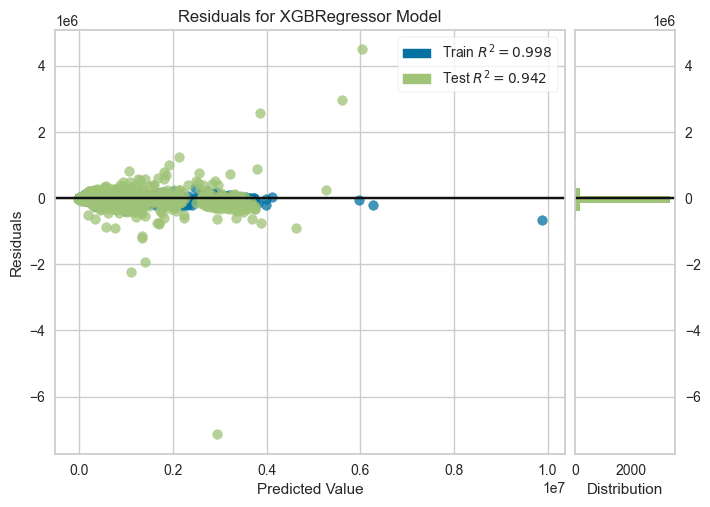

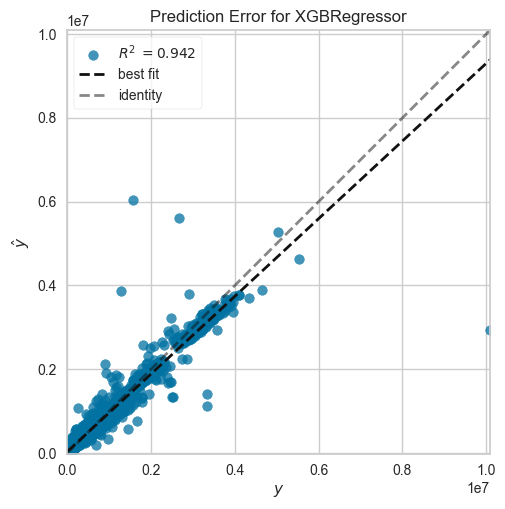

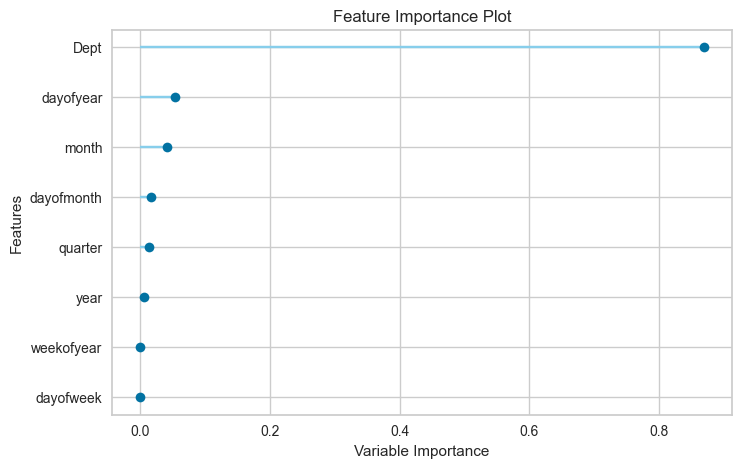

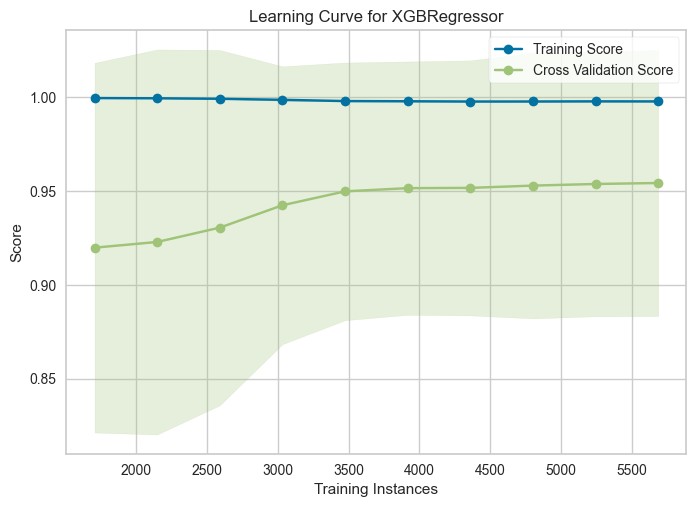

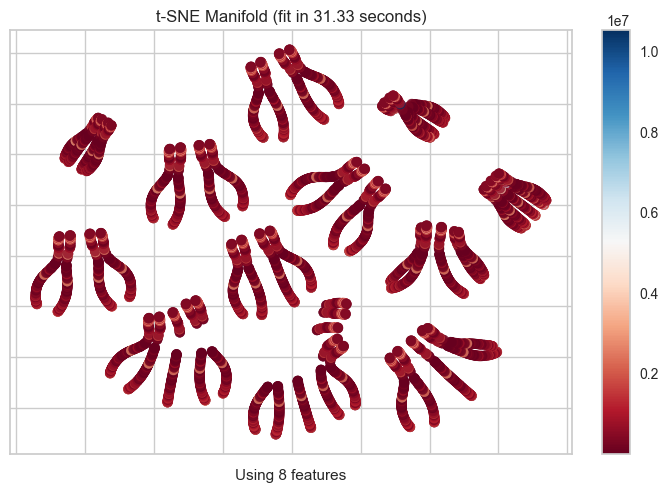

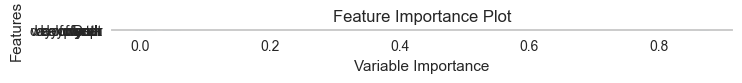

,Parameters
objective,reg:squarederror
base_score,None
booster,gbtree
callbacks,None
colsample_bylevel,None
colsample_bynode,None
colsample_bytree,None
device,gpu
early_stopping_rounds,None
enable_categorical,False



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator',
                 XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, device='gpu',
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
               

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extreme Gradient Boosting,25056.1836,1753825408.0000,41878.6992,0.9972,0.2997,0.1695



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:xgboost IS  DONE! 
 


 
 >> Prediction with Model:xgboost  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,361839.2894,304475178443.0671,551792.6952,0.4407,1.1342,4.0822
1,313164.6953,214033843756.1985,462637.9186,0.5839,1.1094,7.3825
2,306742.9464,214512107441.8515,463154.5179,0.5979,1.1066,5.6292
3,306265.9334,214672764828.9516,463327.9236,0.5862,1.0190,2.3912
4,343374.2667,391475221117.9997,625679.8072,0.4443,1.0668,3.3218
5,321644.9883,287668136734.4484,536347.0301,0.6019,1.0529,2.7529
6,252827.3675,136519274466.1990,369485.1478,0.7496,0.9047,2.2946
7,247870.7403,127168174433.8157,356606.4700,0.7570,0.9093,2.6389
8,242182.4247,130288420198.6072,360954.8728,0.7610,0.8838,2.8783



 
 >>mdll = create_model(mdl) for Model:catboost IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,368014.5012,300918106557.1867,548560.0300,0.4472,1.1835,4.6313
1,310234.6363,210724247044.2892,459047.1077,0.5904,1.1177,7.9550
2,304060.2808,209607560591.0977,457829.1828,0.6071,1.1307,6.0186
3,301889.3935,211258038361.6260,459628.1523,0.5928,1.0156,2.4105
4,341326.6395,384338406725.8888,619950.3260,0.4544,1.0495,3.4485
5,324820.9729,299487636405.4744,547254.6358,0.5855,1.0313,2.5227
6,250070.9009,133954218083.7121,365997.5657,0.7543,0.8570,1.9575
7,246559.6711,123103104278.7564,350860.5197,0.7647,0.8877,2.4200
8,242201.2883,126561028551.7604,355754.1687,0.7679,0.9078,3.2821


Fitting 10 folds for each of 10 candidates, totalling 100 fits

 
 >>tuned_mdl = tune_model(mdll) for Model:catboost IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:catboost IS  DONE! 
 



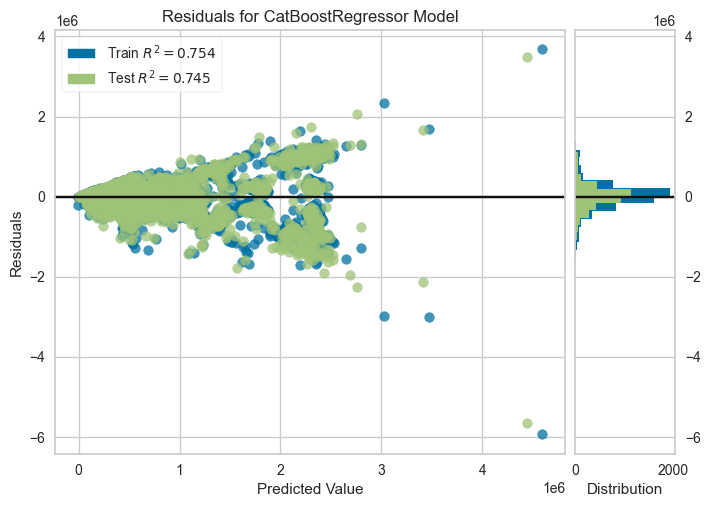

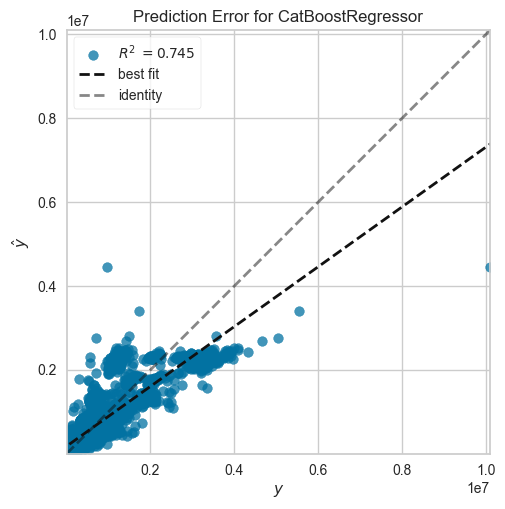

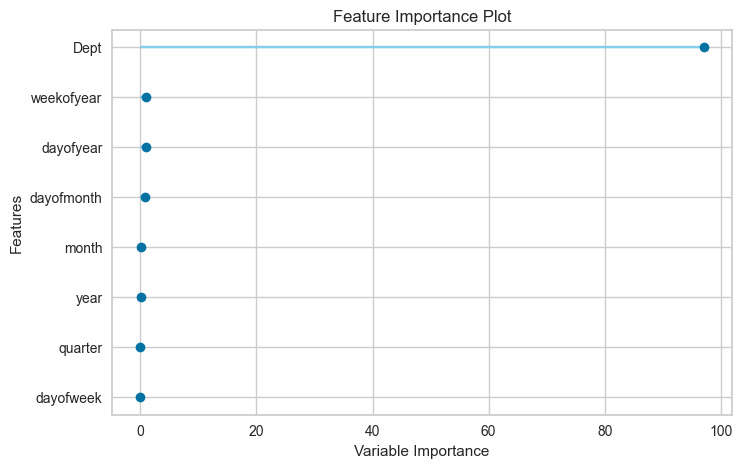

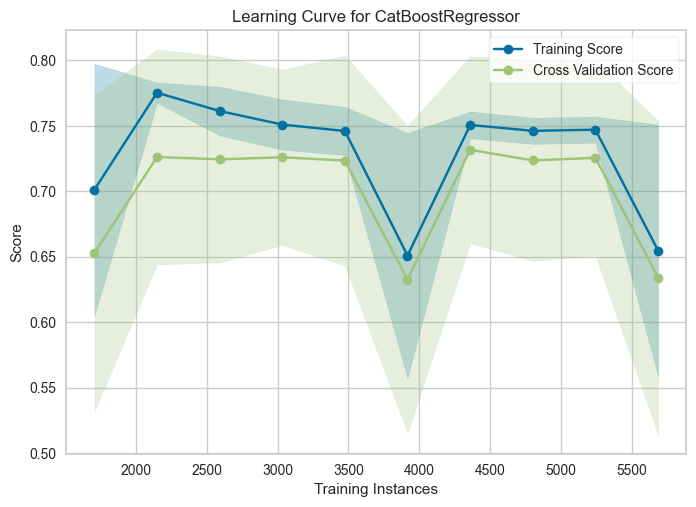

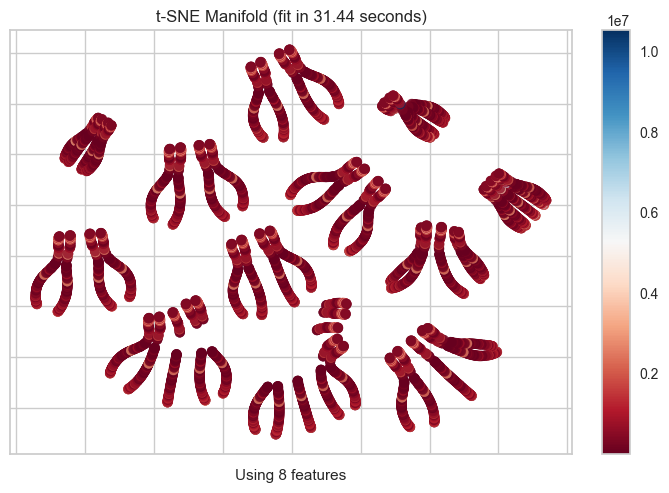

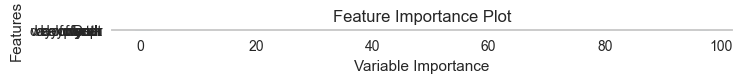

,Parameters
nan_mode,Min
gpu_ram_part,0.95
eval_metric,RMSE
iterations,260
leaf_estimation_method,Newton
observations_to_bootstrap,TestOnly
random_score_type,NormalWithModelSizeDecrease
grow_policy,SymmetricTree
penalties_coefficient,1
boosting_type,Plain



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator',
                 <catboost.core.CatBoostRegressor object at 0x000001F58DF32290>)])

 
 >>print(final_mdl) for Model:catboost IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,258191.0467,156003482476.4805,394972.7617,0.7509,0.8688,1.6850



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:catboost IS  DONE! 
 


 
 >> Prediction with Model:catboost  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,503331.5212,549323050741.6934,741163.3091,-0.0091,1.4975,6.5523
1,502496.3370,520433473505.8546,721410.7523,-0.0117,1.5338,11.9826
2,513776.5258,541808236450.4421,736076.2436,-0.0156,1.5423,9.2603
3,499068.9447,515796910112.0479,718190.0237,0.0058,1.5374,7.8375
4,534027.4360,706437564441.6165,840498.4024,-0.0028,1.5063,6.4434
5,544427.3941,734636389179.7258,857109.3216,-0.0167,1.5477,7.1718
6,499211.0510,548923688800.9960,740893.8445,-0.0069,1.5255,8.4017
7,501680.7645,538771159564.2241,734010.3266,-0.0297,1.5565,10.4923
8,510304.5867,562525417657.4589,750016.9449,-0.0317,1.6002,13.7546



 
 >>mdll = create_model(mdl) for Model:tr IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,503331.5212,549323050741.6934,741163.3091,-0.0091,1.4975,6.5523
1,502496.3370,520433473505.8546,721410.7523,-0.0117,1.5338,11.9826
2,513776.5258,541808236450.4421,736076.2436,-0.0156,1.5423,9.2603
3,499068.9447,515796910112.0479,718190.0237,0.0058,1.5374,7.8375
4,534027.4360,706437564441.6165,840498.4024,-0.0028,1.5063,6.4434
5,544427.3941,734636389179.7258,857109.3216,-0.0167,1.5477,7.1718
6,499211.0510,548923688800.9960,740893.8445,-0.0069,1.5255,8.4017
7,501680.7645,538771159564.2241,734010.3266,-0.0297,1.5565,10.4923
8,510304.5867,562525417657.4589,750016.9449,-0.0317,1.6002,13.7546


Fitting 10 folds for each of 2 candidates, totalling 20 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).

 
 >>tuned_mdl = tune_model(mdll) for Model:tr IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:tr IS  DONE! 
 



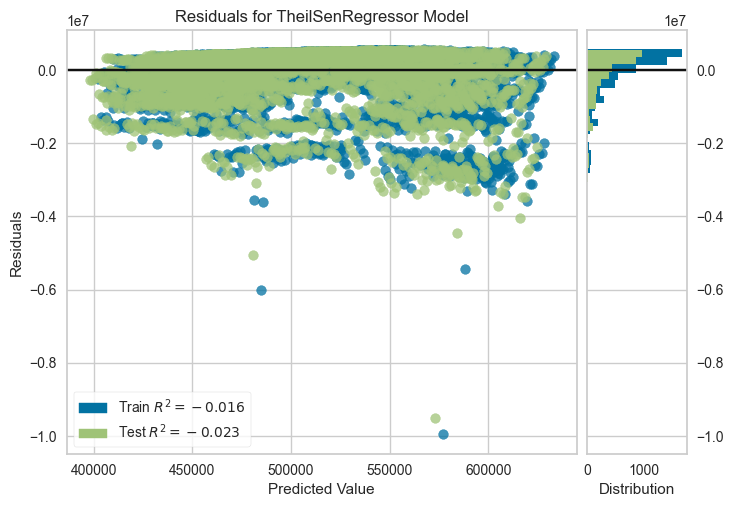

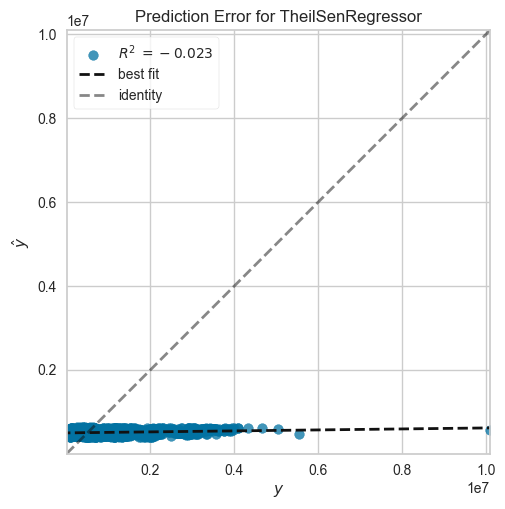

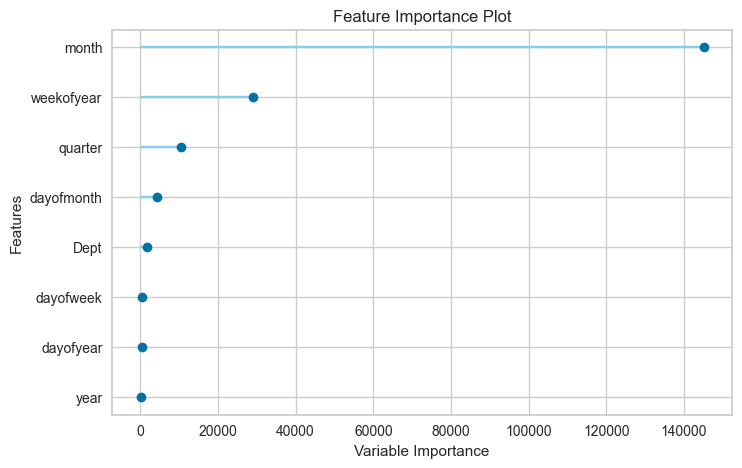

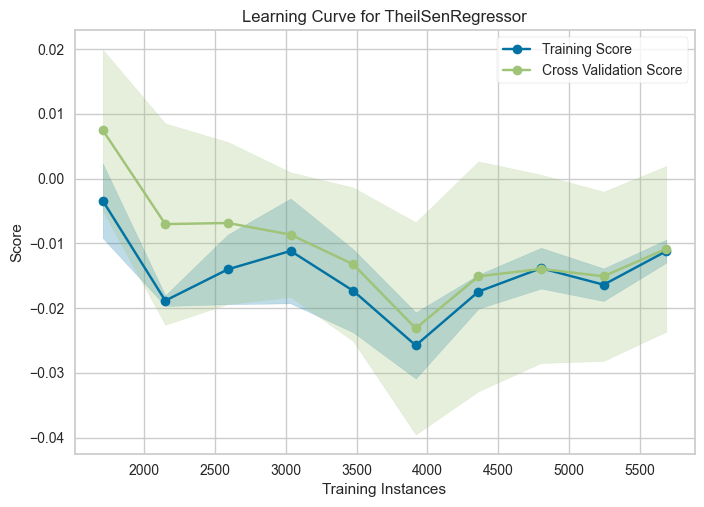

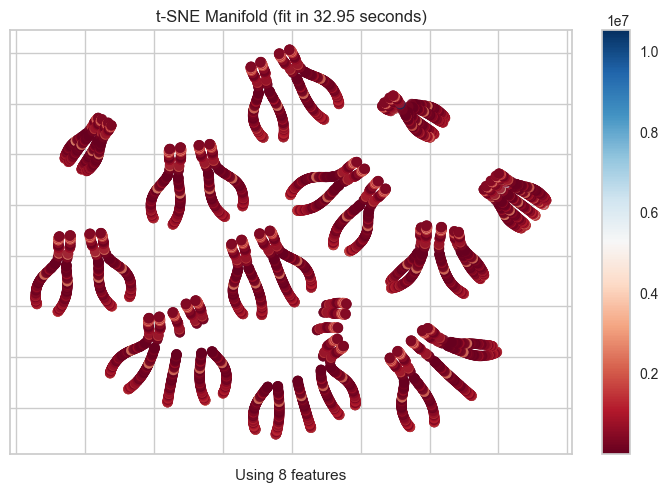

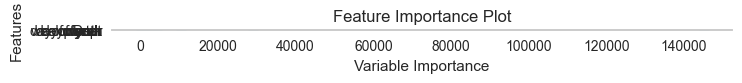

,Parameters
copy_X,True
fit_intercept,True
max_iter,1000
max_subpopulation,10000.0
n_jobs,-1
n_subsamples,None
random_state,7065
tol,0.001
verbose,False



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator',
                 TheilSenRegressor(max_iter=1000, n_jobs=-1,
                                   random_state=7065))])

 
 >>print(final_mdl) for Model:tr IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,TheilSen Regressor,531463.9276,633378044180.8304,795850.5162,-0.0113,1.5649,7.3884



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:tr IS  DONE! 
 


 
 >> Prediction with Model:tr  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,71193.8824,19519861060.6006,139713.4963,0.9641,0.5160,0.5903
1,63770.1759,12380374574.0056,111267.1316,0.9759,0.5738,1.0229
2,49152.7066,5498108144.1894,74149.2289,0.9897,0.5195,0.6683
3,61699.7471,10651453127.2280,103205.8774,0.9795,0.5123,0.4869
4,115747.2336,155829960703.2016,394753.0376,0.7788,0.6128,0.6573
5,170278.8178,127309940257.3848,356805.1853,0.8238,0.7336,1.1240
6,56534.0327,8653057482.4964,93021.8119,0.9841,0.5011,0.6333
7,57511.0298,12568256562.6451,112108.2359,0.9760,0.5946,0.9815
8,48516.7872,5352964935.0268,73163.9593,0.9902,0.5929,1.1261



 
 >>mdll = create_model(mdl) for Model:lightgbm IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,46276.9100,10599046629.7344,102951.6713,0.9805,0.4015,0.2903
1,47862.5267,9820283283.8877,99097.3425,0.9809,0.4367,0.4206
2,32784.6714,2880857321.7500,53673.6185,0.9946,0.4079,0.3017
3,36975.8749,3566880342.5291,59723.3651,0.9931,0.3127,0.2376
4,117565.3916,142870003769.3634,377981.4860,0.7972,0.6094,0.5194
5,161680.4009,129285614578.0066,359563.0885,0.8211,0.5931,0.6725
6,46487.5939,7928749297.4025,89043.5247,0.9855,0.5112,0.2590
7,39054.4680,9217464815.5407,96007.6289,0.9824,0.3860,0.2886
8,29381.0169,2246308701.9708,47395.2392,0.9959,0.3740,0.3048


Fitting 10 folds for each of 10 candidates, totalling 100 fits
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 260
[LightGBM] [Info] Number of data points in the train set: 5687, number of used features: 7
[LightGBM] [Info] Using GPU Device: Intel(R) HD Graphics 630, Vendor: I

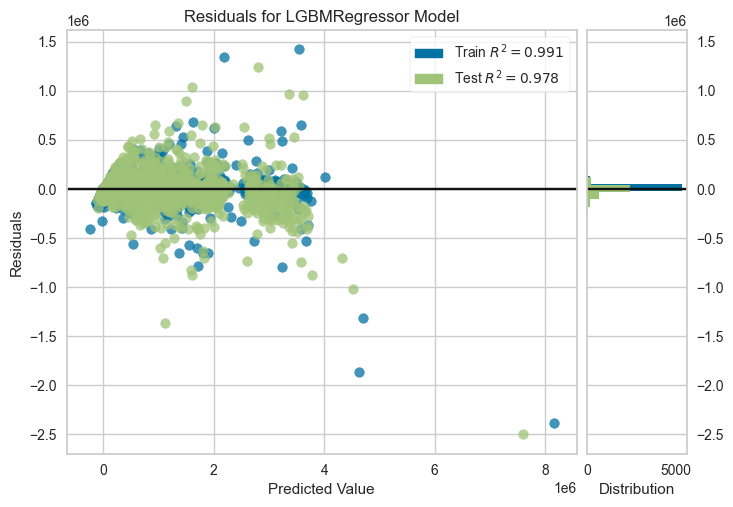

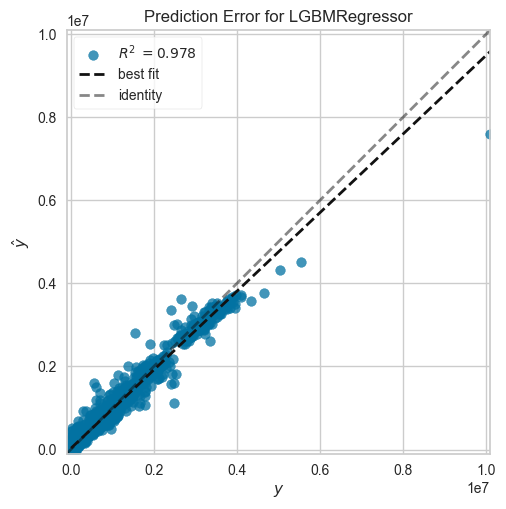

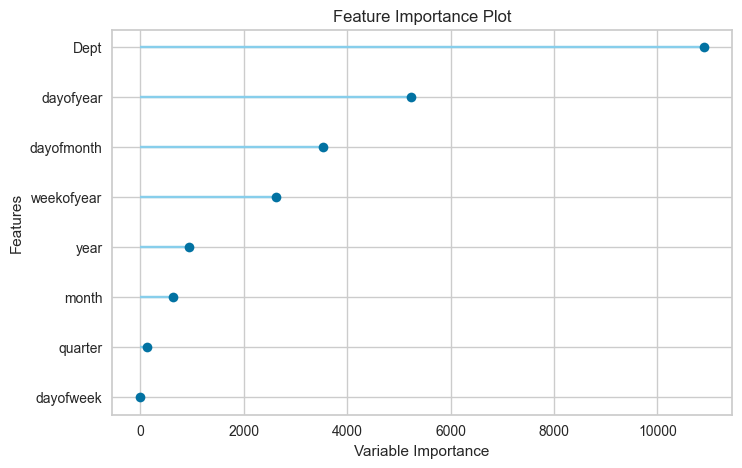

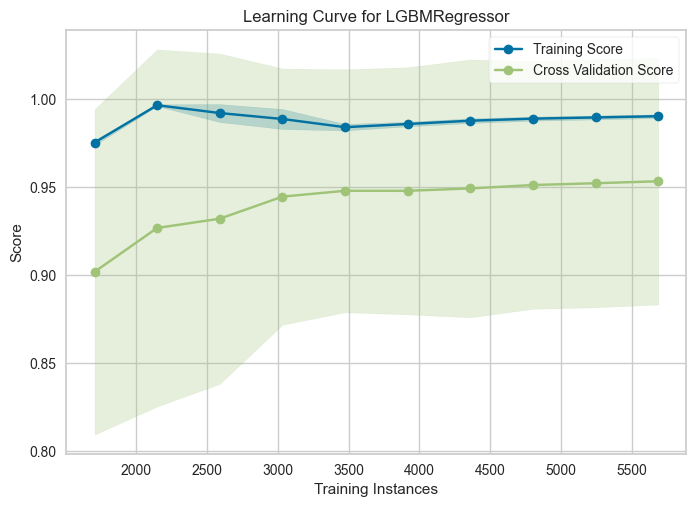

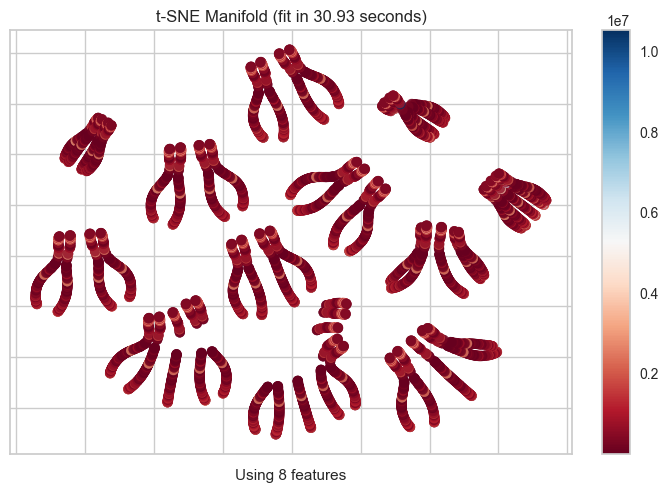

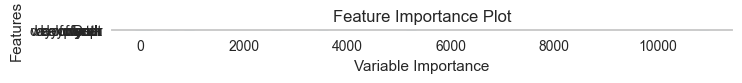

,Parameters
boosting_type,gbdt
class_weight,None
colsample_bytree,1.0
importance_type,split
learning_rate,0.3
max_depth,-1
min_child_samples,26
min_child_weight,0.001
min_split_gain,0.9
n_estimators,270



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator',
                 LGBMRegressor(bagging_fraction=0.9, bagging_freq=6,
                               device='gpu', feature_fraction=0.9,
                               learning_rate=0.3, min_child_samples=26,
                               min_split_gain=0.9, n_estimators=270, n_jobs=-1,
                               num_leaves=90, random_state=7065,
                               reg_alpha=0.0001, reg_lambda=1e-06))])

 
 >>print(final_mdl) for Model:lightgbm IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,24321.0666,2518068202.9111,50180.3567,0.9960,0.3297,0.1550


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6

 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:lightgbm IS  DONE! 
 


 
 >> Prediction with Model:lightgbm  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,155906.3946,52758648550.2113,229692.5087,0.9031,0.8901,1.9620
1,143369.9068,38951047245.7360,197360.1967,0.9243,0.9272,3.4073
2,143371.9802,36526720127.0876,191119.6487,0.9315,0.9286,2.5665
3,134186.9613,31128299983.0008,176432.1399,0.9400,0.9043,2.1870
4,181097.7920,189947689429.5711,435829.8859,0.7304,0.8776,1.7635
5,212909.5064,157464890479.6886,396818.4604,0.7821,0.9862,2.3739
6,145912.3321,38780393612.7598,196927.3816,0.9289,0.9114,2.3390
7,148903.2945,40698419175.3525,201738.4921,0.9222,0.9711,3.2029
8,147407.1675,36543103900.7187,191162.5065,0.9330,1.0153,4.4973



 
 >>mdll = create_model(mdl) for Model:gbr IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,47807.5274,10437791705.8009,102165.5113,0.9808,0.3234,0.2243
1,45950.6801,10841756890.7016,104123.7576,0.9789,0.2876,0.2051
2,31781.1230,3426580100.3645,58536.9977,0.9936,0.2196,0.1514
3,39307.0489,3784557093.7216,61518.7540,0.9927,0.3925,0.2517
4,99389.5239,147608205778.4226,384198.1335,0.7905,0.5714,0.3929
5,158225.9039,134008651463.9165,366071.9212,0.8145,0.7049,0.6342
6,40177.0532,8145202128.0538,90250.7736,0.9851,0.2956,0.1623
7,40111.0670,9489337698.5224,97413.2316,0.9819,0.3560,0.2658
8,31230.4582,2773456804.0776,52663.6194,0.9949,0.3127,0.1959


Fitting 10 folds for each of 10 candidates, totalling 100 fits

 
 >>tuned_mdl = tune_model(mdll) for Model:gbr IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:gbr IS  DONE! 
 



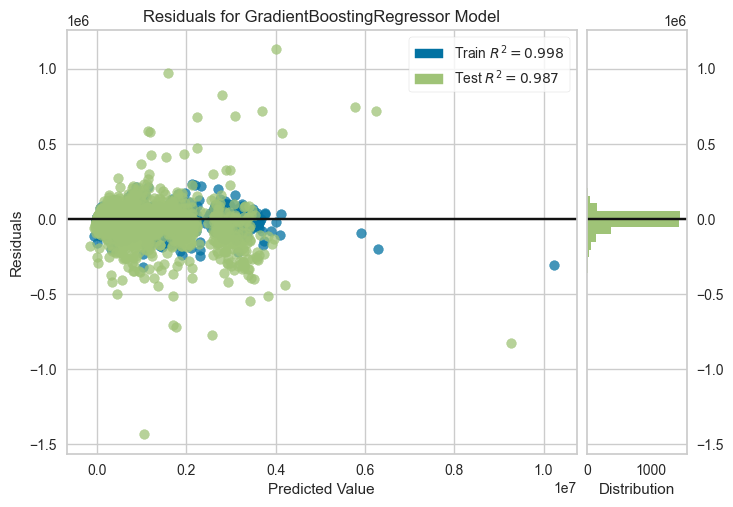

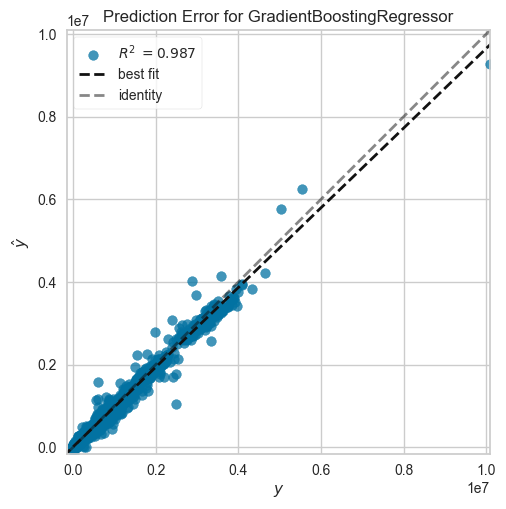

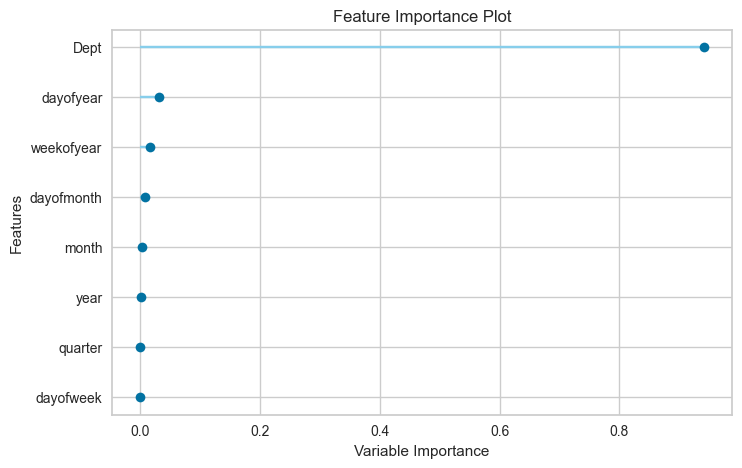

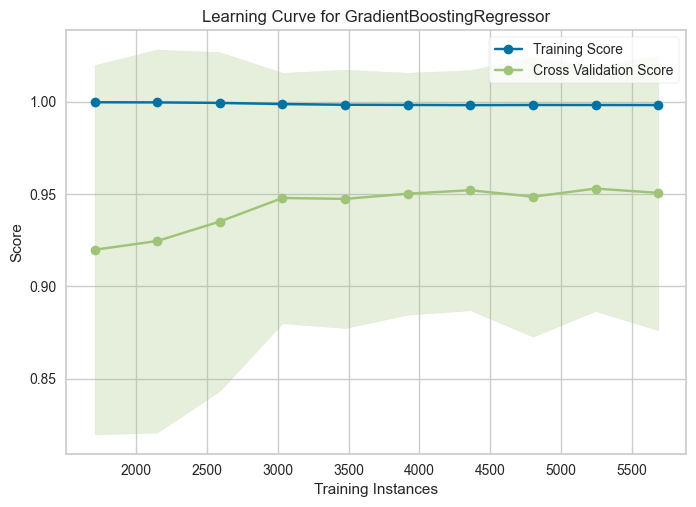

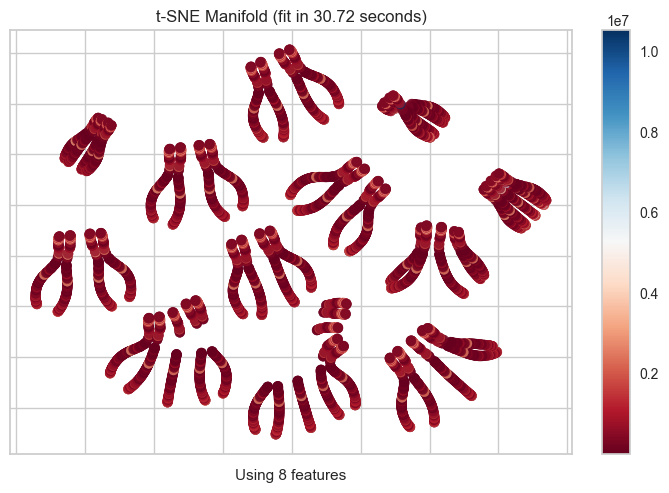

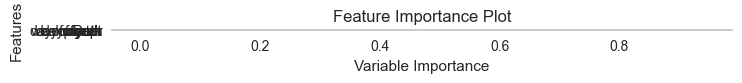

,Parameters
alpha,0.9
ccp_alpha,0.0
criterion,friedman_mse
init,None
learning_rate,0.3
loss,squared_error
max_depth,6
max_features,1.0
max_leaf_nodes,None
min_impurity_decrease,0.002



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator',
                 GradientBoostingRegressor(learning_rate=0.3, max_depth=6,
                                           max_features=1.0,
                                           min_impurity_decrease=0.002,
                                           min_samples_leaf=3, n_estimators=170,
                                           random_state=7065, subsample=0.9))])

 
 >>print(final_mdl) for Model:gbr IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Gradient Boosting Regressor,21158.8187,1193331141.3971,34544.6254,0.9981,0.2835,0.1761



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:gbr IS  DONE! 
 


 
 >> Prediction with Model:gbr  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,490439.2408,581761750395.4636,762733.0794,-0.0687,1.4441,5.4040
1,488743.5499,550507775111.8269,741962.1116,-0.0701,1.4870,10.1294
2,504558.9006,570775831476.5536,755497.0758,-0.0699,1.4999,7.9425
3,485715.2487,542490802238.9622,736539.7493,-0.0456,1.4831,6.5919
4,517883.0710,738417135953.1077,859312.0132,-0.0482,1.4499,5.3576
5,540644.6788,770169963558.5743,877593.2791,-0.0659,1.5179,6.3130
6,491720.8267,577196277415.7737,759734.3466,-0.0588,1.4831,7.1848
7,498749.7863,558411820473.8708,747269.5768,-0.0672,1.5334,9.6325
8,509111.1081,577171123457.5299,759717.7920,-0.0585,1.5825,12.9574



 
 >>mdll = create_model(mdl) for Model:huber IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,505995.3705,544792751970.4189,738100.7736,-0.0008,1.5073,6.7414
1,507806.4273,514933008088.3283,717588.3277,-0.0010,1.5480,12.5513
2,520657.5389,532980398046.5995,730055.0651,0.0009,1.5639,9.9043
3,505759.2908,510963291175.5480,714816.9634,0.0152,1.5551,8.2389
4,539844.5060,702195582727.6398,837971.1109,0.0032,1.5207,6.7071
5,555795.0627,727849962845.1565,853141.2326,-0.0073,1.5833,7.8419
6,506349.6363,540313867261.3887,735060.4514,0.0089,1.5496,8.9687
7,514503.5829,521861150902.1064,722399.5784,0.0026,1.5980,11.9810
8,523305.4435,540596435154.8833,735252.6336,0.0085,1.6520,16.1656


Fitting 10 folds for each of 10 candidates, totalling 100 fits

 
 >>tuned_mdl = tune_model(mdll) for Model:huber IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:huber IS  DONE! 
 



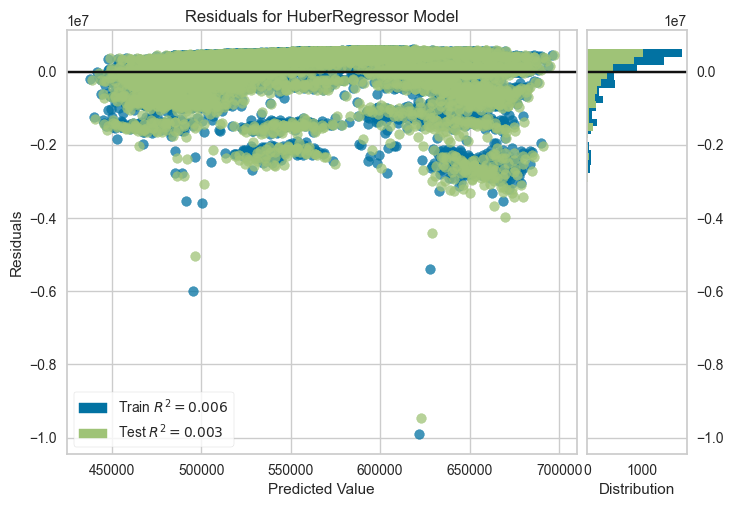

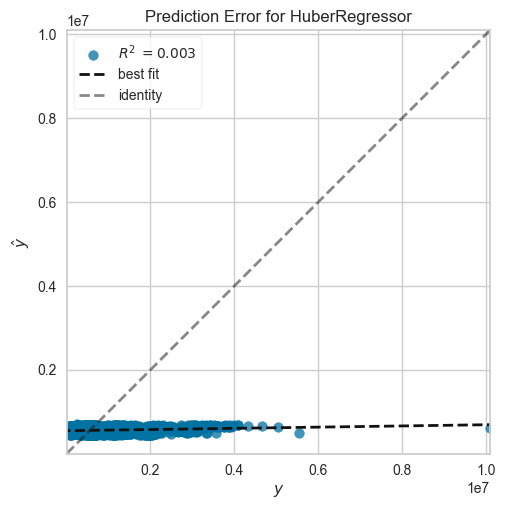

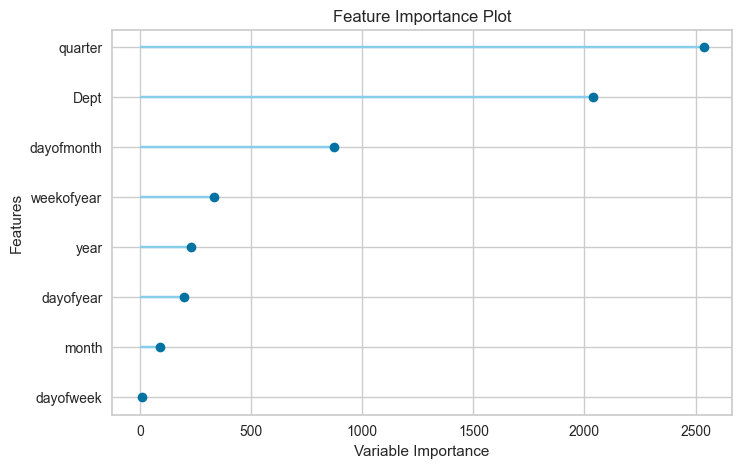

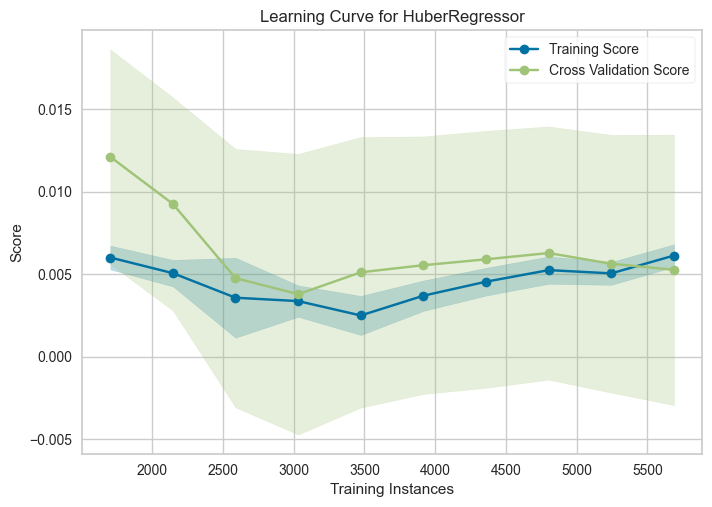

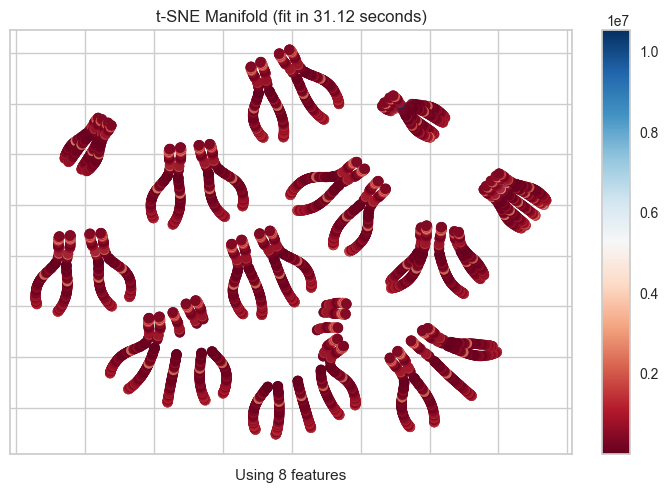

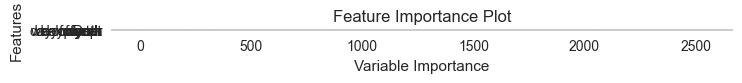

,Parameters
alpha,0.0005
epsilon,1.9
fit_intercept,True
max_iter,100
tol,1e-05
warm_start,False



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator',
                 HuberRegressor(alpha=0.0005, epsilon=1.9))])

 
 >>print(final_mdl) for Model:huber IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Huber Regressor,537957.8354,623080993361.8467,789354.7956,0.0052,1.5881,7.9179



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:huber IS  DONE! 
 


 
 >> Prediction with Model:huber  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,545425.0715,404720934809.4809,636176.8110,0.2565,1.6288,9.2378
1,606000.7629,482553184458.3468,694660.4814,0.0620,1.7772,23.6610
2,547149.7916,392384641565.9678,626406.1315,0.2645,1.7131,14.7147
3,528675.8176,382369792585.7896,618360.5684,0.2630,1.6641,11.1738
4,650594.6314,625566689976.0886,790927.7400,0.1120,1.7167,9.8614
5,580109.6450,534362479320.1069,731001.0118,0.2605,1.6855,10.3036
6,566147.0751,406803587282.8324,637811.5610,0.2538,1.7275,13.6340
7,514537.4949,360770849090.1448,600642.0307,0.3105,1.6957,15.7790
8,640076.3722,526866650586.2977,725855.8056,0.0337,1.9089,30.7515



 
 >>mdll = create_model(mdl) for Model:ada IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,355524.6466,304303142332.6944,551636.7848,0.4410,1.2860,4.3502
1,347526.7994,265438125712.3839,515206.8766,0.4840,1.3394,8.2000
2,343729.0746,252923102028.7822,502914.6071,0.5259,1.3332,6.2752
3,340626.0325,257310100862.6658,507257.4306,0.5041,1.3110,5.0445
4,391054.0788,462847266712.1754,680328.7931,0.3430,1.3200,4.7355
5,410102.5073,466527667184.5360,683028.3063,0.3544,1.3540,4.9374
6,348426.1717,290873536928.9190,539326.9295,0.4664,1.3300,5.7714
7,348256.1181,264154209150.4625,513959.3458,0.4951,1.3824,7.7234
8,344683.4770,256688580991.8816,506644.4325,0.5292,1.4134,10.0495


Fitting 10 folds for each of 10 candidates, totalling 100 fits

 
 >>tuned_mdl = tune_model(mdll) for Model:ada IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:ada IS  DONE! 
 



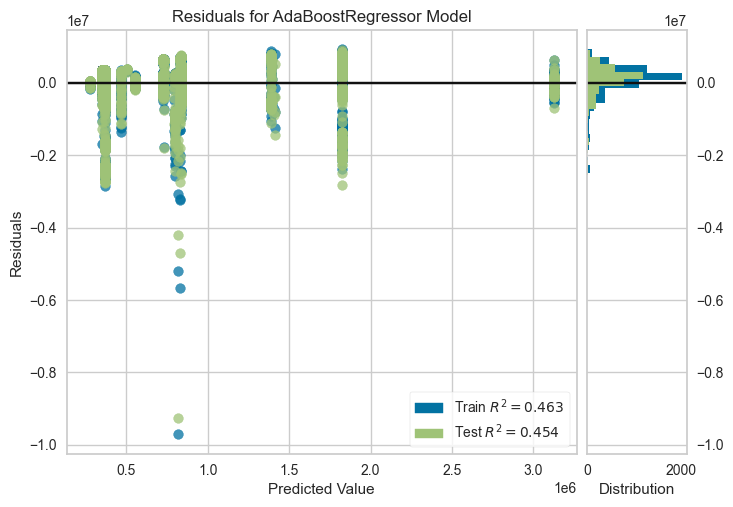

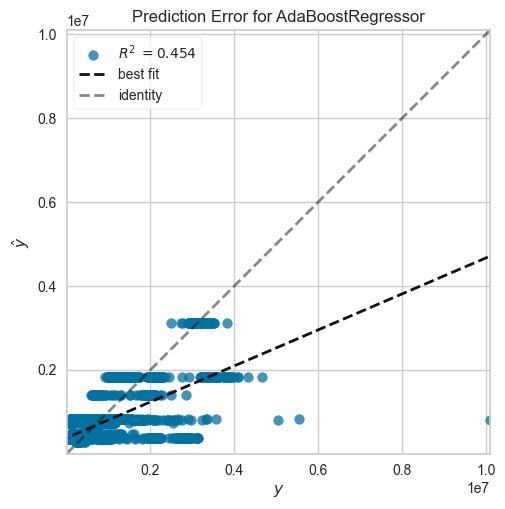

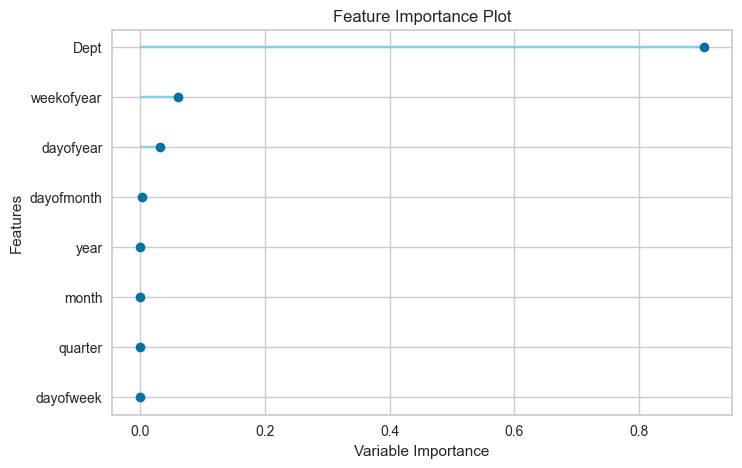

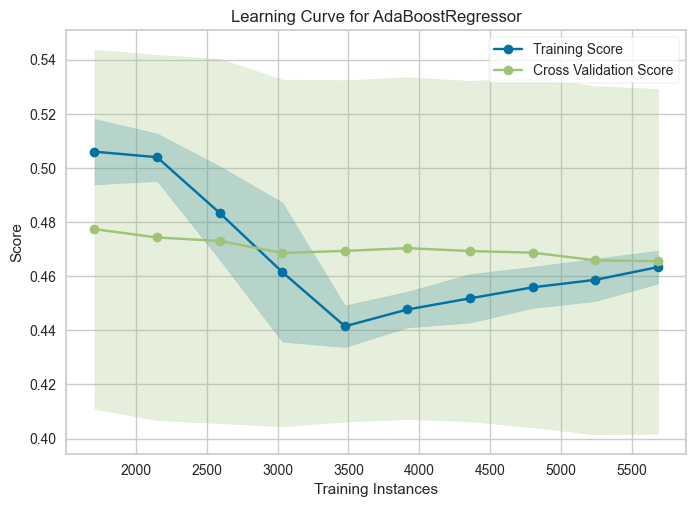

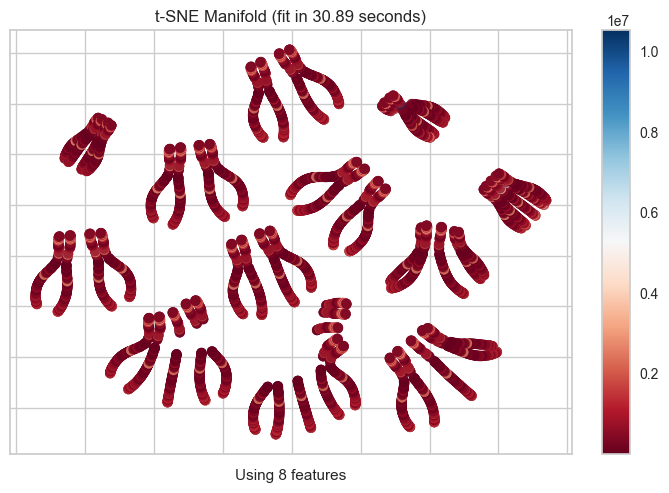

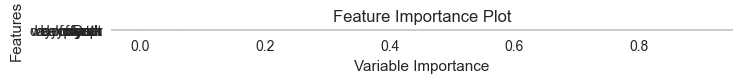

,Parameters
base_estimator,deprecated
estimator,None
learning_rate,0.01
loss,square
n_estimators,90
random_state,7065



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator',
                 AdaBoostRegressor(learning_rate=0.01, loss='square',
                                   n_estimators=90, random_state=7065))])

 
 >>print(final_mdl) for Model:ada IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,AdaBoost Regressor,370432.0539,342478523896.1753,585216.6470,0.4532,1.3624,5.1189



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:ada IS  DONE! 
 


 
 >> Prediction with Model:ada  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,500992.6397,656449276822.5486,810215.5743,-0.2059,1.4930,3.7776
1,495195.6723,622570369842.4399,789031.2857,-0.2102,1.5250,7.1372
2,515862.8591,545063589740.5365,738284.2202,-0.0217,1.5459,9.0095
3,497665.6819,520987663128.5417,721794.7514,-0.0042,1.5223,7.3581
4,533337.2044,867574352746.3727,931436.7143,-0.2316,1.5649,3.0615
5,624141.5980,1050771312305.4498,1025071.3694,-0.4542,2.1903,1.9459
6,623820.6903,897205588076.2721,947209.3687,-0.6457,2.0801,1.5447
7,536475.0892,716302488885.5269,846346.5537,-0.3690,2.1715,4.5675
8,526838.5429,702776365208.7373,838317.5802,-0.2889,1.7802,6.9928



 
 >>mdll = create_model(mdl) for Model:par IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,533122.3728,611090192508.3868,781722.5803,-0.1225,1.5654,6.7434
1,540848.4836,574643538868.1974,758052.4645,-0.1170,1.6206,13.3537
2,546703.7930,604376292119.5013,777416.4213,-0.1329,1.6180,9.7489
3,531805.9485,590466196499.6396,768417.9829,-0.1381,1.5934,7.6763
4,559821.3530,776968896509.0492,881458.3918,-0.1029,1.5496,6.1358
5,672825.0989,1041188103905.7792,1020386.2523,-0.4409,1.8411,5.1827
6,537811.6866,624164081508.4393,790040.5569,-0.1449,1.6029,8.5310
7,543491.5598,595141713334.7560,771454.2847,-0.1374,1.6465,11.4965
8,557975.9752,617705964004.9757,785942.7231,-0.1329,1.7073,15.9639


Fitting 10 folds for each of 10 candidates, totalling 100 fits

 
 >>tuned_mdl = tune_model(mdll) for Model:par IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:par IS  DONE! 
 



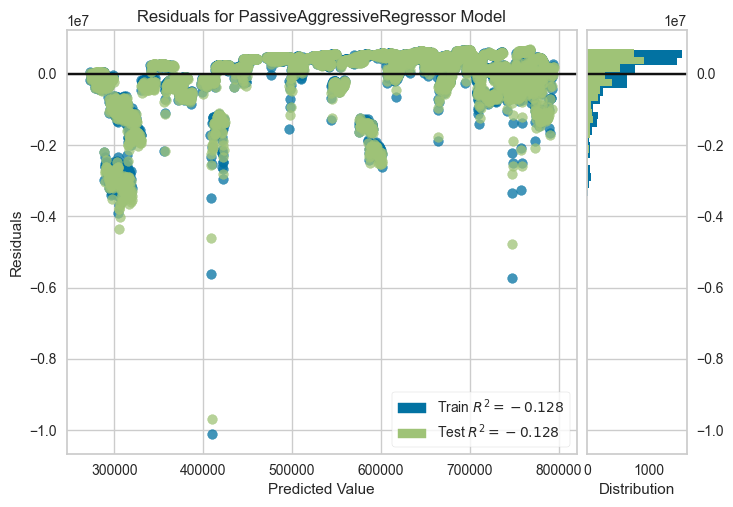

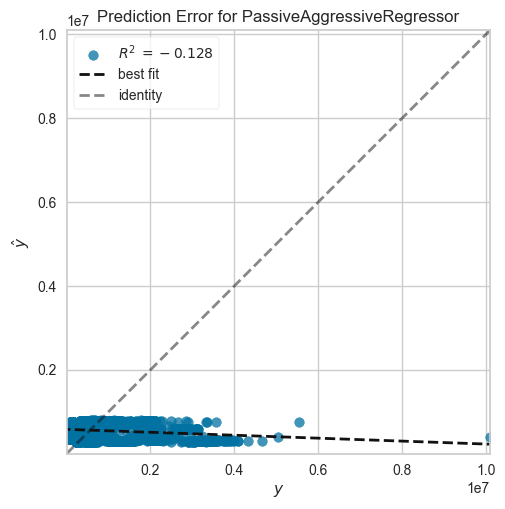

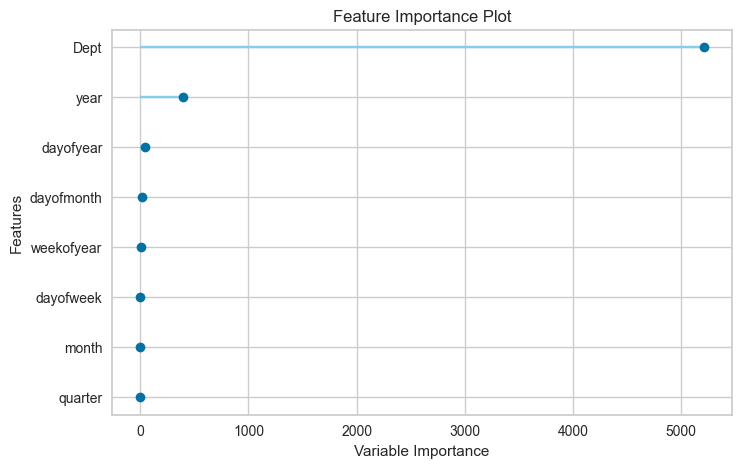

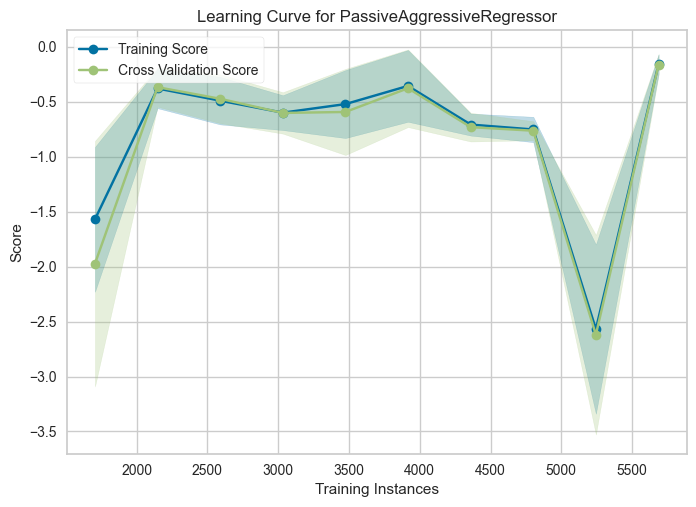

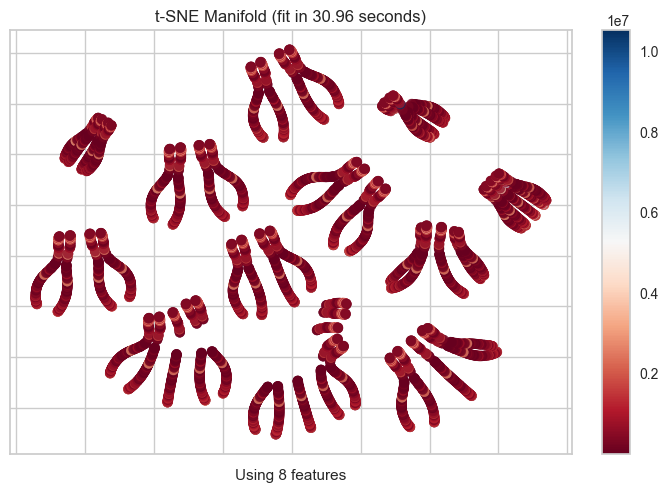

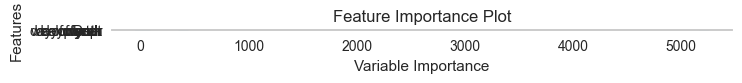

,Parameters
C,2.12
average,False
early_stopping,False
epsilon,0.9
fit_intercept,False
loss,squared_epsilon_insensitive
max_iter,1000
n_iter_no_change,5
random_state,7065
shuffle,False



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator',
                 PassiveAggressiveRegressor(C=2.12, epsilon=0.9,
                                            fit_intercept=False,
                                            loss='squared_epsilon_insensitive',
                                            random_state=7065,
                                            shuffle=False))])

 
 >>print(final_mdl) for Model:par IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Passive Aggressive Regressor,588499.0033,709136396650.4557,842102.3671,-0.1322,1.6739,8.3290



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:par IS  DONE! 
 


 
 >> Prediction with Model:par  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,543374.0648,530048875264.8477,728044.5558,0.0263,1.5857,8.2323
1,544819.9243,501388639236.6702,708088.0166,0.0254,1.6228,15.2275
2,553112.7523,518913683827.3544,720356.6366,0.0273,1.6304,11.7136
3,535140.5619,501970103077.6510,708498.4849,0.0325,1.6135,9.5064
4,567539.8411,692377761782.7610,832092.3998,0.0171,1.5749,7.6689
5,585234.4146,708066895104.1333,841467.1087,0.0201,1.6489,9.2884
6,543935.3106,524402272770.1771,724156.2489,0.0381,1.6256,10.8489
7,550512.3759,508478189325.2366,713076.5662,0.0282,1.6713,14.4364
8,554933.4517,527200631663.7595,726085.8294,0.0331,1.7193,19.0204



 
 >>mdll = create_model(mdl) for Model:omp IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,543374.0648,530048875264.8477,728044.5558,0.0263,1.5857,8.2323
1,544819.9243,501388639236.6702,708088.0166,0.0254,1.6228,15.2275
2,553112.7523,518913683827.3544,720356.6366,0.0273,1.6304,11.7136
3,535140.5619,501970103077.6510,708498.4849,0.0325,1.6135,9.5064
4,567539.8411,692377761782.7610,832092.3998,0.0171,1.5749,7.6689
5,585234.4146,708066895104.1333,841467.1087,0.0201,1.6489,9.2884
6,543935.3106,524402272770.1771,724156.2489,0.0381,1.6256,10.8489
7,550512.3759,508478189325.2366,713076.5662,0.0282,1.6713,14.4364
8,554933.4517,527200631663.7595,726085.8294,0.0331,1.7193,19.0204


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).

 
 >>tuned_mdl = tune_model(mdll) for Model:omp IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:omp IS  DONE! 
 



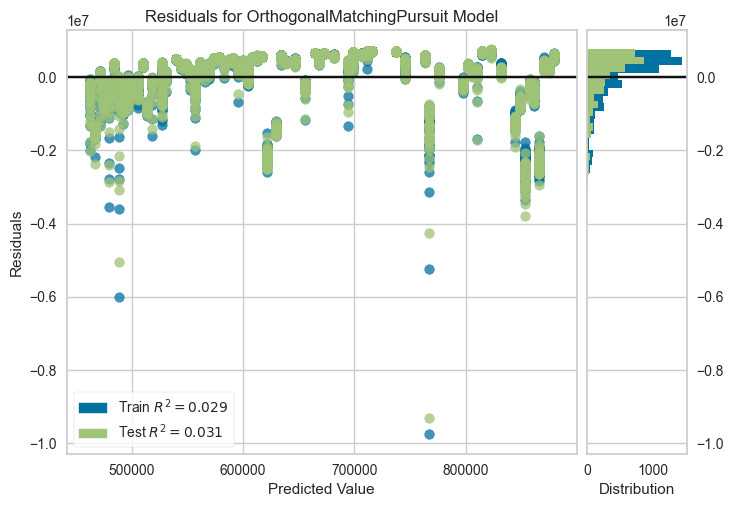

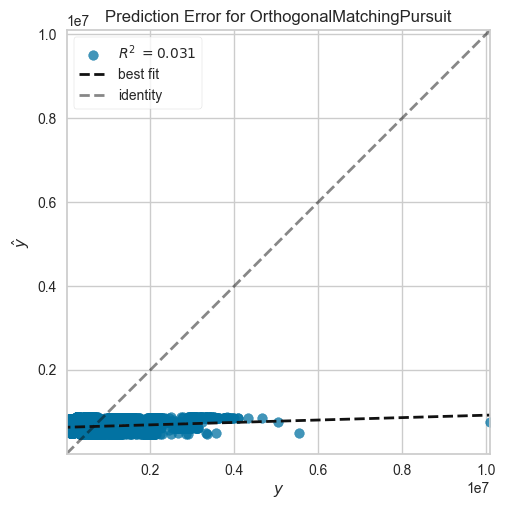

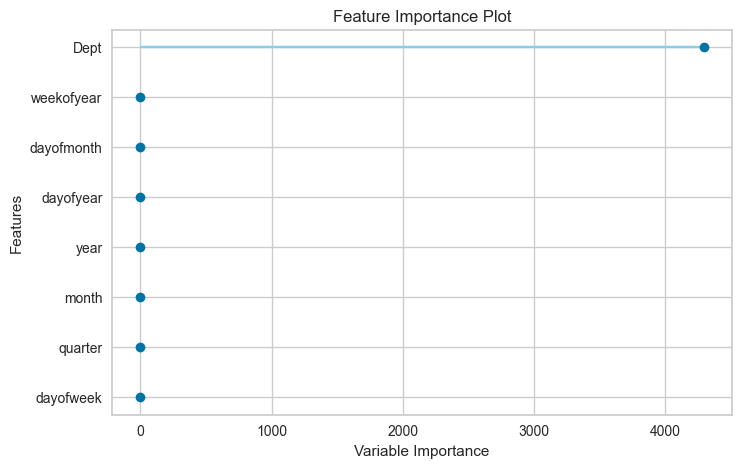

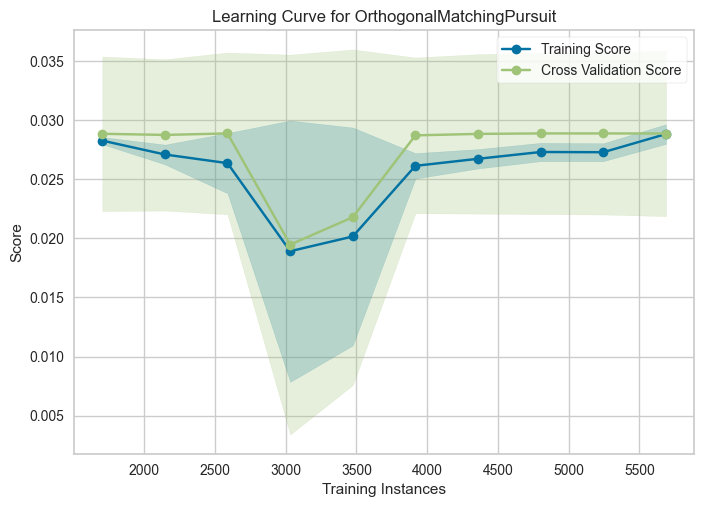

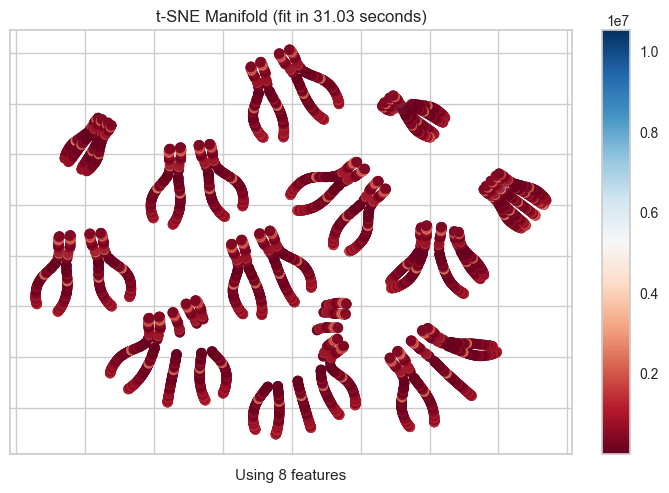

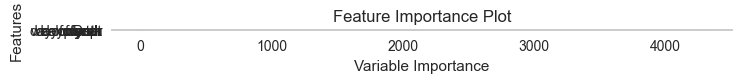

,Parameters
fit_intercept,True
n_nonzero_coefs,None
normalize,deprecated
precompute,auto
tol,None



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator', OrthogonalMatchingPursuit())])

 
 >>print(final_mdl) for Model:omp IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Orthogonal Matching Pursuit,570135.1981,606770952751.2675,778955.0390,0.0312,1.6574,9.4418



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:omp IS  DONE! 
 


 
 >> Prediction with Model:omp  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,536230.7132,530582173177.6062,728410.7174,0.0253,1.5697,7.9230
1,541696.6767,501352781263.4326,708062.6959,0.0254,1.6159,14.9649
2,554747.4053,518770419557.6440,720257.1899,0.0276,1.6341,11.8268
3,544224.8286,503776568145.9045,709772.1945,0.0290,1.6322,9.9083
4,578795.1934,692180689730.3843,831973.9718,0.0174,1.5977,8.0812
5,583971.9205,707643460191.4487,841215.4660,0.0207,1.6457,9.2240
6,535001.8587,524588695359.9993,724284.9545,0.0377,1.6074,10.4082
7,545756.4084,508153182114.5920,712848.6390,0.0288,1.6612,14.0724
8,554756.9087,526889994784.8449,725871.8859,0.0337,1.7190,19.0488



 
 >>mdll = create_model(mdl) for Model:en IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,535077.4536,530797038991.9691,728558.1919,0.0249,1.5671,7.8718
1,540459.6156,501460096989.1778,708138.4730,0.0252,1.6132,14.8629
2,553736.6905,518814257829.2081,720287.6216,0.0275,1.6318,11.7625
3,542946.1852,503477566840.9711,709561.5314,0.0296,1.6296,9.8502
4,577703.3493,692045372049.8298,831892.6445,0.0176,1.5955,8.0406
5,584244.7925,707920758280.1958,841380.2697,0.0203,1.6463,9.2336
6,536406.6052,524477708986.9230,724208.3326,0.0379,1.6103,10.4819
7,547102.8706,508039342048.0121,712768.7858,0.0290,1.6641,14.1717
8,556083.0880,526930725622.4697,725899.9419,0.0336,1.7219,19.1750


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).

 
 >>tuned_mdl = tune_model(mdll) for Model:en IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:en IS  DONE! 
 



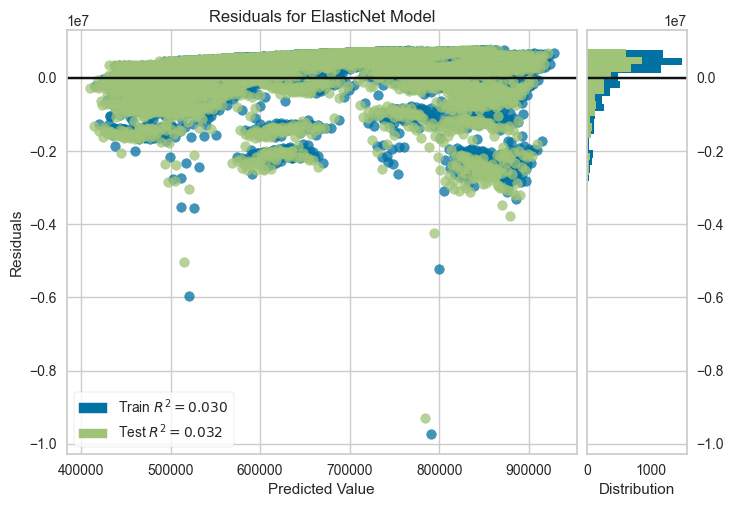

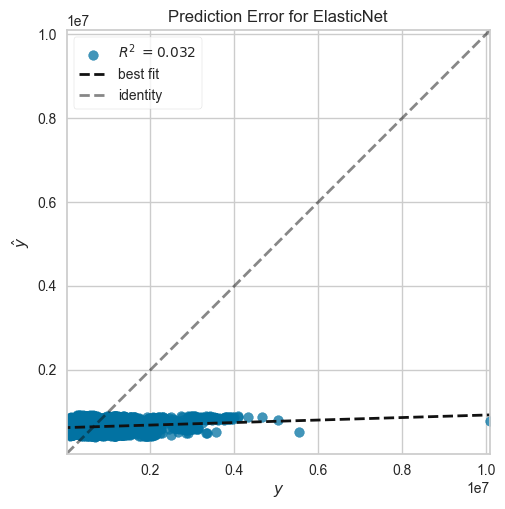

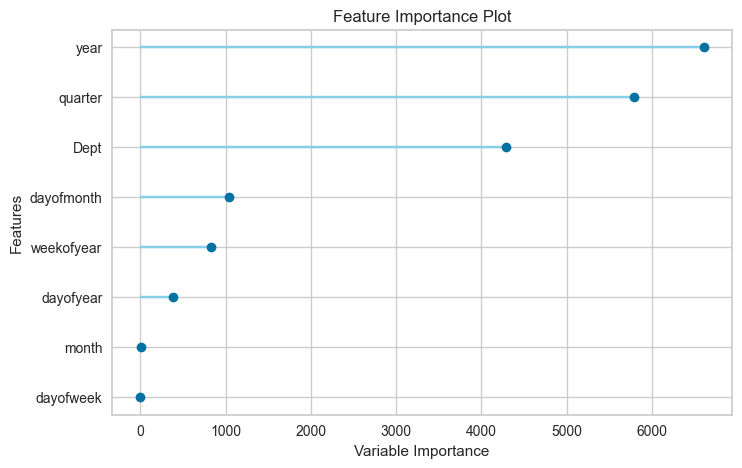

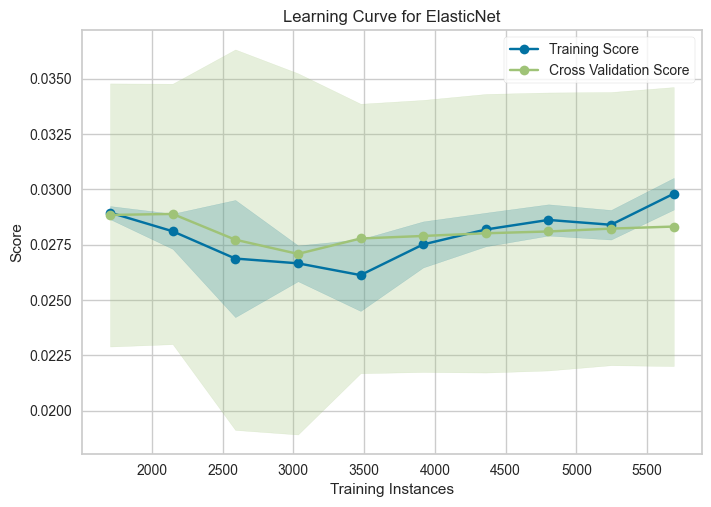

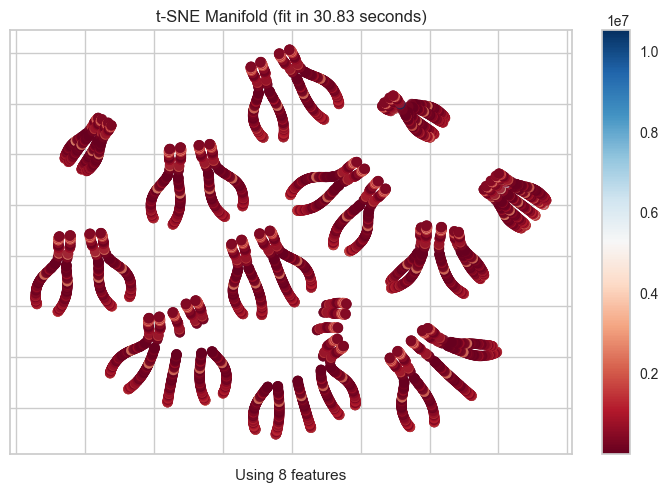

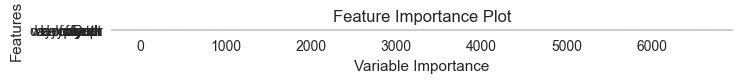

,Parameters
alpha,1.0
copy_X,True
fit_intercept,True
l1_ratio,0.5
max_iter,1000
positive,False
precompute,False
random_state,7065
selection,cyclic
tol,0.0001



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator', ElasticNet(random_state=7065))])

 
 >>print(final_mdl) for Model:en IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Elastic Net,570199.0523,605820335198.1711,778344.6121,0.0327,1.6567,9.4095



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:en IS  DONE! 
 


 
 >> Prediction with Model:en  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,542561.5195,530232765997.6116,728170.8357,0.0260,1.5839,8.2030
1,542569.8738,501539970594.7274,708194.8677,0.0251,1.6177,14.9783
2,555848.4729,518512555453.9187,720078.1593,0.0281,1.6361,11.8831
3,547981.0608,504930539165.7285,710584.6460,0.0268,1.6399,10.0622
4,579024.7435,691847712540.0553,831773.8350,0.0179,1.5980,8.0862
5,583215.5514,706374395208.1356,840460.8231,0.0224,1.6438,9.1997
6,534929.9272,524945578384.1229,724531.2819,0.0371,1.6069,10.4255
7,542574.7073,508145275547.4684,712843.0932,0.0288,1.6545,13.8300
8,550012.0919,527547145108.5735,726324.4076,0.0325,1.7075,18.4600



 
 >>mdll = create_model(mdl) for Model:lasso IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,537461.0589,530587485758.9694,728414.3641,0.0253,1.5727,7.9846
1,539150.1113,501874577716.0985,708431.0677,0.0244,1.6102,14.6986
2,552982.1253,518650432793.0748,720173.8907,0.0278,1.6298,11.7016
3,544009.8485,503836580843.9357,709814.4693,0.0289,1.6317,9.8846
4,575960.7444,691512468551.4735,831572.2870,0.0184,1.5917,7.9733
5,583961.1995,707215715299.7839,840961.1854,0.0213,1.6456,9.2259
6,538827.8466,524706257976.4973,724366.1077,0.0375,1.6150,10.6262
7,546648.7047,507707573395.4648,712536.0155,0.0297,1.6635,14.1349
8,554628.7233,527250992720.4785,726120.5084,0.0330,1.7180,18.9251


Fitting 10 folds for each of 10 candidates, totalling 100 fits

 
 >>tuned_mdl = tune_model(mdll) for Model:lasso IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:lasso IS  DONE! 
 



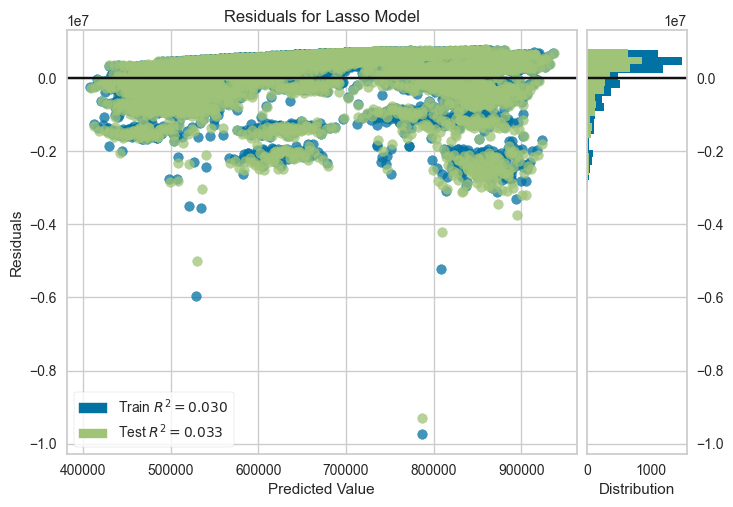

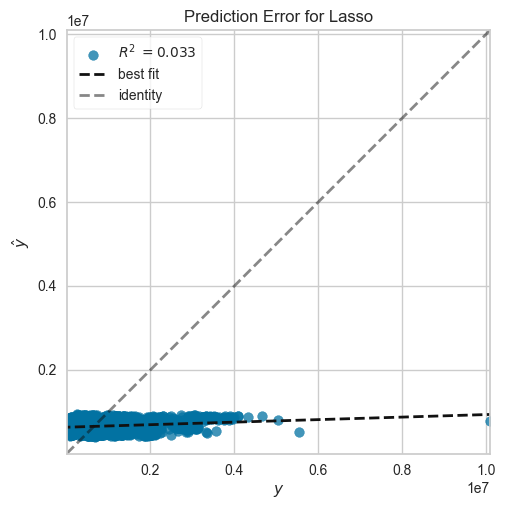

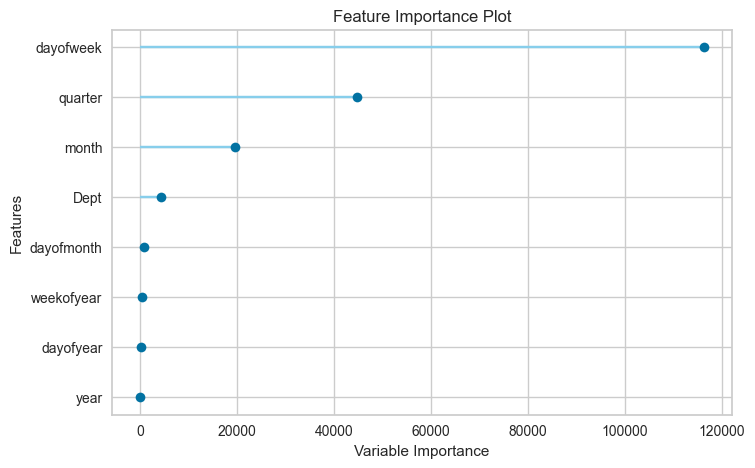

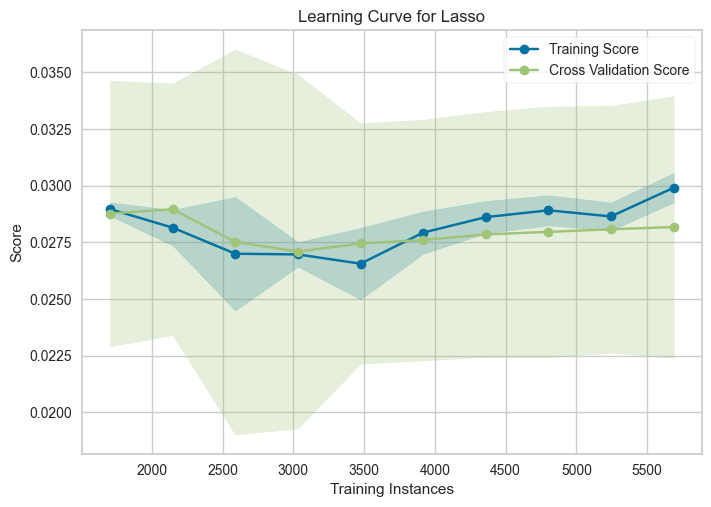

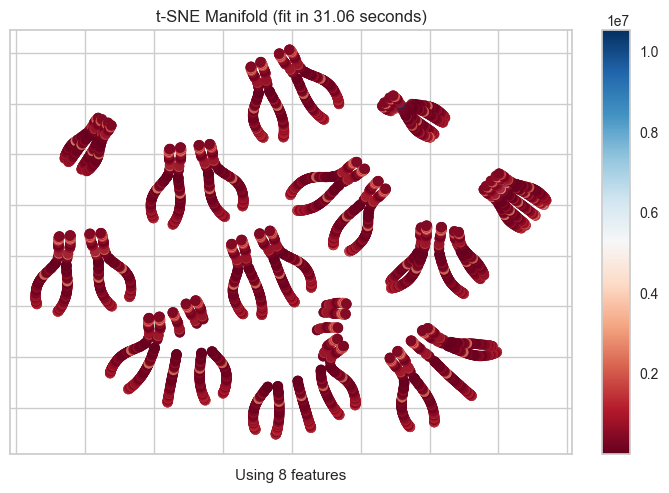

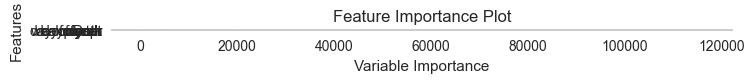

,Parameters
alpha,5.8
copy_X,True
fit_intercept,False
max_iter,1000
positive,False
precompute,False
random_state,7065
selection,cyclic
tol,0.0001
warm_start,False



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator',
                 Lasso(alpha=5.8, fit_intercept=False, random_state=7065))])

 
 >>print(final_mdl) for Model:lasso IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Lasso Regression,570396.6092,605615684073.8623,778213.1354,0.0331,1.6569,9.4225



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:lasso IS  DONE! 
 


 
 >> Prediction with Model:lasso  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,542107.9710,530565305539.0590,728399.1389,0.0254,1.5828,8.1836
1,542072.7774,501565095995.1296,708212.6065,0.0250,1.6166,14.9421
2,555528.9182,518522854556.6696,720085.3106,0.0280,1.6354,11.8624
3,548590.5013,505212424530.2767,710782.9658,0.0262,1.6411,10.0868
4,579338.5910,691861191963.5928,831781.9377,0.0179,1.5986,8.0981
5,584551.9999,706772511670.5500,840697.6339,0.0219,1.6470,9.2586
6,535007.8665,525016538154.8584,724580.2496,0.0370,1.6071,10.4318
7,541939.0146,508221031803.4735,712896.2279,0.0287,1.6532,13.7829
8,549548.7935,527605564510.6277,726364.6223,0.0324,1.7065,18.4091



 
 >>mdll = create_model(mdl) for Model:llar IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,542107.4728,530565955358.5605,728399.5850,0.0254,1.5828,8.1836
1,542071.4941,501565177938.8337,708212.6643,0.0250,1.6166,14.9420
2,555528.0059,518522885767.8396,720085.3323,0.0280,1.6354,11.8624
3,548591.2536,505212771523.6140,710783.2099,0.0262,1.6411,10.0868
4,579339.8461,691861231107.7610,831781.9613,0.0179,1.5986,8.0982
5,584554.2227,706773118726.6052,840697.9950,0.0219,1.6470,9.2587
6,535008.2009,525016860809.8428,724580.4723,0.0370,1.6071,10.4318
7,541937.6755,508221192248.1467,712896.3405,0.0287,1.6532,13.7828
8,549547.6717,527605731503.5316,726364.7372,0.0324,1.7065,18.4090


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).

 
 >>tuned_mdl = tune_model(mdll) for Model:llar IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:llar IS  DONE! 
 



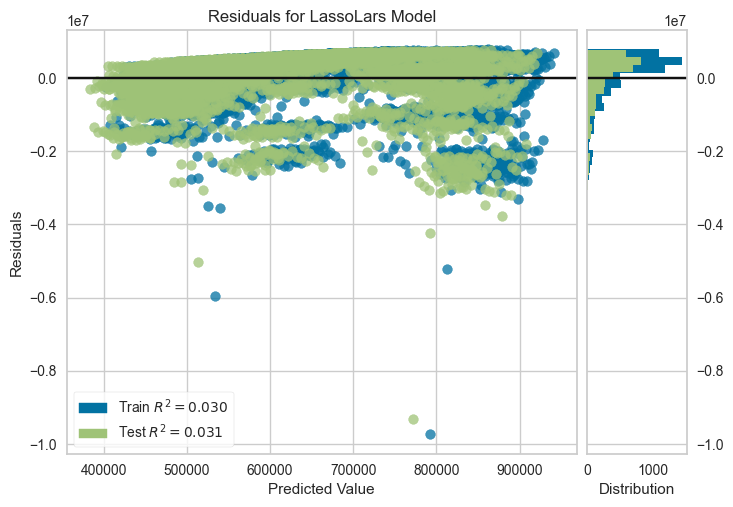

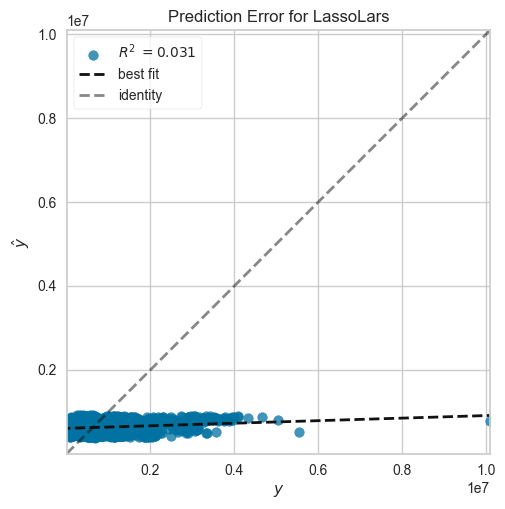

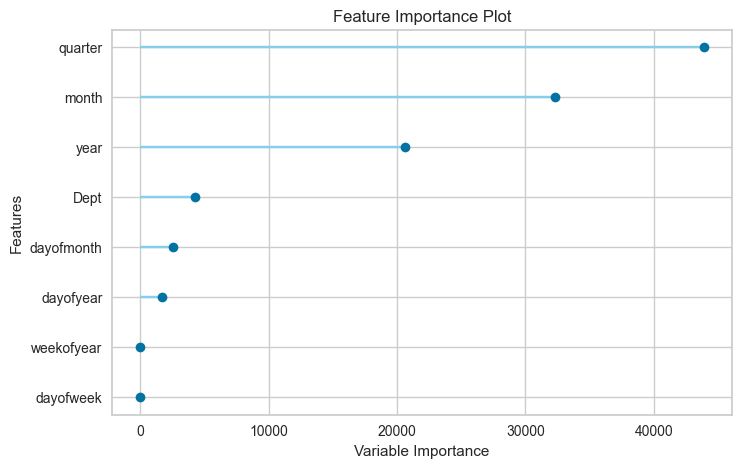

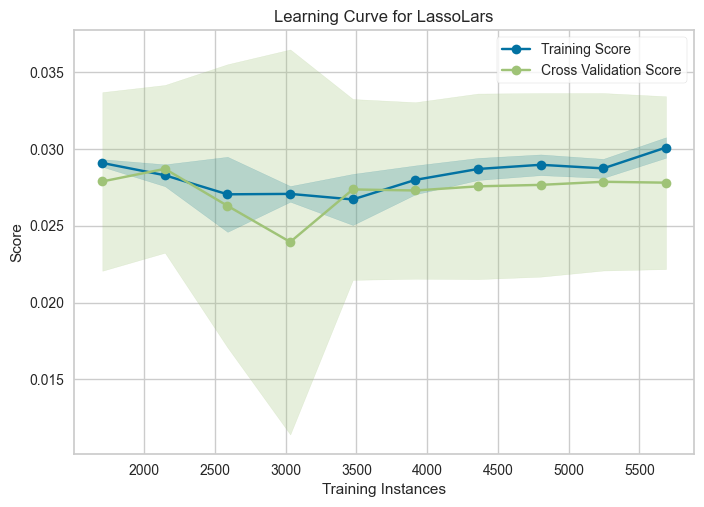

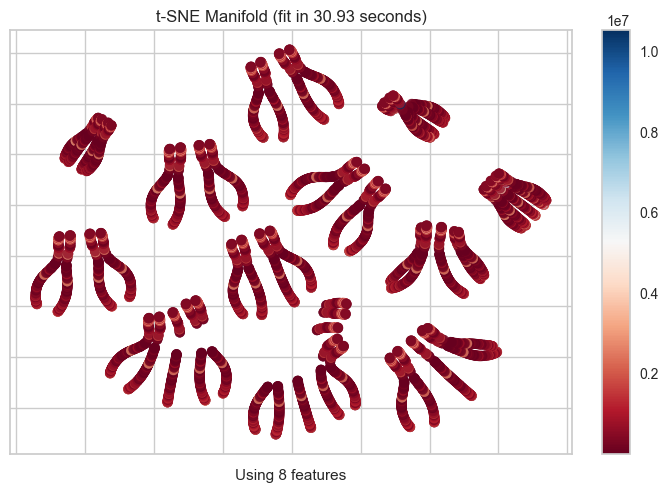

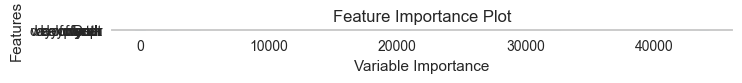

,Parameters
alpha,1.0
copy_X,True
eps,2.220446049250313e-16
fit_intercept,True
fit_path,True
jitter,None
max_iter,500
normalize,deprecated
positive,False
precompute,auto



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator', LassoLars(random_state=7065))])

 
 >>print(final_mdl) for Model:llar IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Lasso Least Angle Regression,570156.6517,605631854496.2201,778223.5248,0.0330,1.6564,9.4108



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:llar IS  DONE! 
 


 
 >> Prediction with Model:llar  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,534453.4038,530844356806.1005,728590.6648,0.0249,1.5661,7.8531
1,540672.2488,501368379678.8806,708073.7106,0.0254,1.6140,14.9026
2,553678.3820,518876193319.8245,720330.6139,0.0274,1.6322,11.7732
3,542462.2628,503429321465.3217,709527.5340,0.0297,1.6289,9.8378
4,577814.5108,692016738539.9148,831875.4345,0.0177,1.5959,8.0511
5,584140.8740,707906832558.2633,841371.9942,0.0203,1.6465,9.2377
6,535582.0606,524565786684.0893,724269.1397,0.0378,1.6089,10.4413
7,546895.2956,508109982431.4421,712818.3376,0.0289,1.6640,14.1741
8,555927.1878,526963217883.7337,725922.3222,0.0335,1.7222,19.1918



 
 >>mdll = create_model(mdl) for Model:br IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,534453.4420,530844355819.8762,728590.6641,0.0249,1.5661,7.8531
1,540672.2709,501368382246.7896,708073.7124,0.0254,1.6140,14.9026
2,553678.4159,518876191922.8487,720330.6129,0.0274,1.6322,11.7732
3,542462.3088,503429324839.0195,709527.5364,0.0297,1.6289,9.8378
4,577814.5457,692016752810.4532,831875.4431,0.0177,1.5959,8.0511
5,584140.8857,707906838803.6998,841371.9979,0.0203,1.6465,9.2377
6,535582.0873,524565778068.1608,724269.1337,0.0378,1.6089,10.4413
7,546895.3117,508109983308.5746,712818.3382,0.0289,1.6640,14.1741
8,555927.2155,526963211471.5853,725922.3178,0.0335,1.7222,19.1918


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).

 
 >>tuned_mdl = tune_model(mdll) for Model:br IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:br IS  DONE! 
 



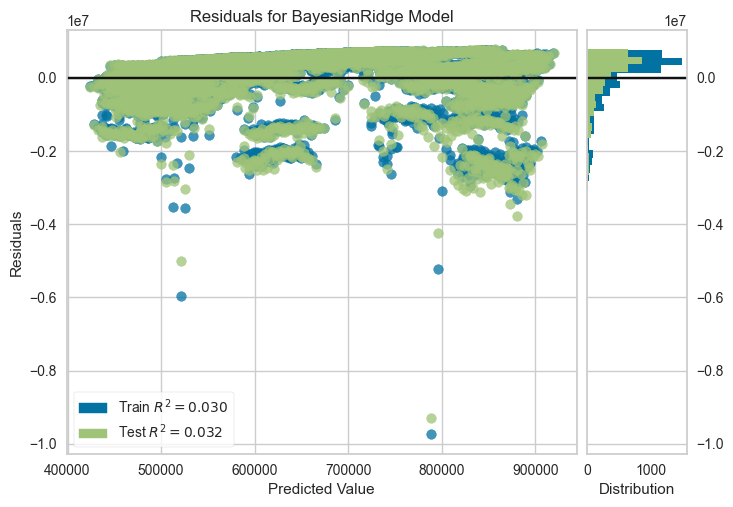

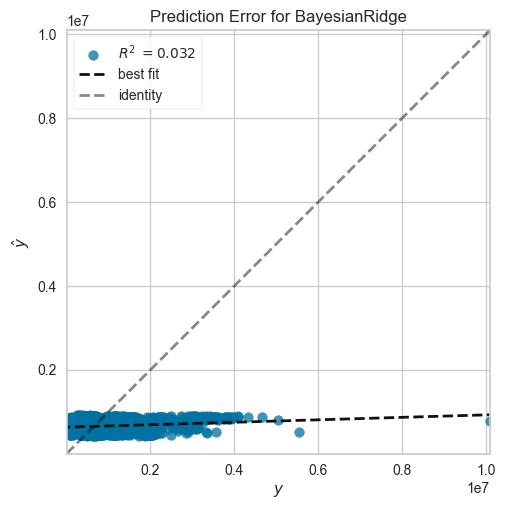

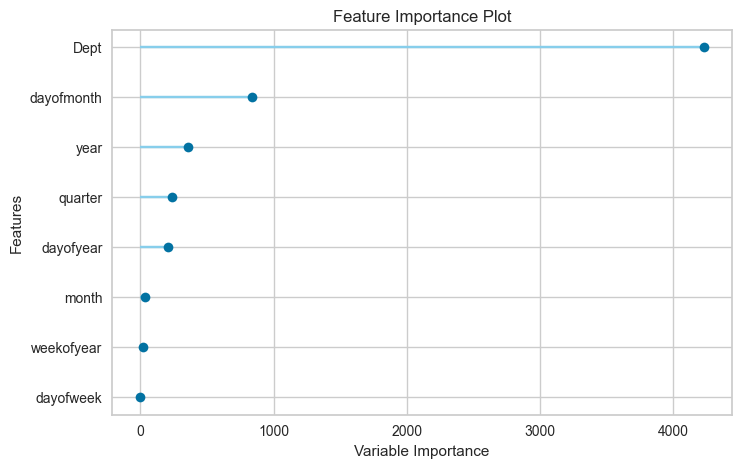

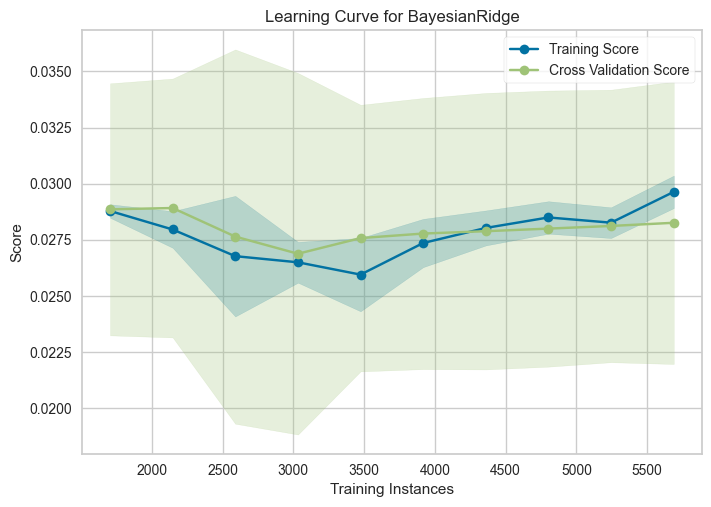

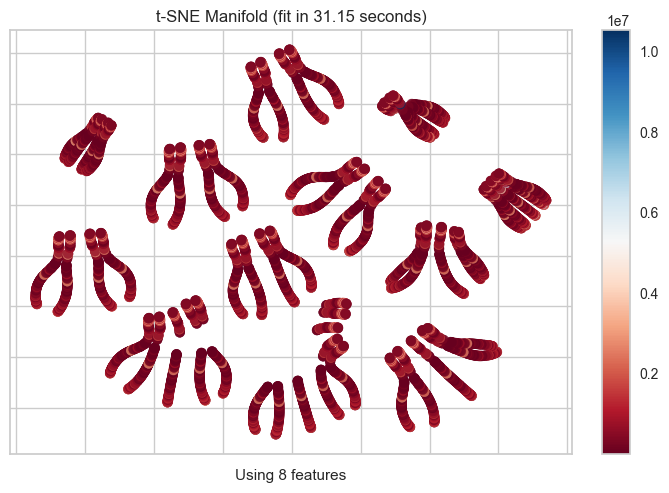

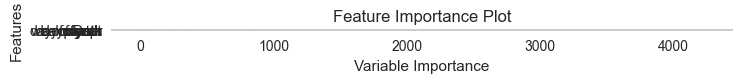

,Parameters
alpha_1,1e-06
alpha_2,1e-06
alpha_init,None
compute_score,False
copy_X,True
fit_intercept,True
lambda_1,1e-06
lambda_2,1e-06
lambda_init,None
n_iter,300



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None), ('actual_estimator', BayesianRidge())])

 
 >>print(final_mdl) for Model:br IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Bayesian Ridge,570260.0758,605888483061.4500,778388.3883,0.0326,1.6571,9.4158



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:br IS  DONE! 
 


 
 >> Prediction with Model:br  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,542254.7422,530437564233.1126,728311.4473,0.0256,1.5832,8.1900
1,542157.6921,501559613712.0239,708208.7360,0.0250,1.6168,14.9484
2,555580.6591,518521166780.0447,720084.1387,0.0281,1.6355,11.8658
3,548456.4695,505149785613.0462,710738.9012,0.0264,1.6409,10.0814
4,579294.0531,691860046566.7251,831781.2492,0.0179,1.5985,8.0964
5,584186.2695,706659147191.8964,840630.2084,0.0220,1.6461,9.2425
6,534973.9054,524987982780.2576,724560.5446,0.0370,1.6070,10.4291
7,542070.5842,508205116078.6156,712885.0651,0.0287,1.6534,13.7927
8,549639.1733,527592140638.3930,726355.3818,0.0324,1.7067,18.4193



 
 >>mdll = create_model(mdl) for Model:ridge IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,540822.3331,530300026926.3558,728217.0191,0.0259,1.5801,8.1298
1,541382.9646,501614687530.3242,708247.6174,0.0249,1.6151,14.8846
2,554922.6066,518539510212.9592,720096.8756,0.0280,1.6341,11.8246
3,547050.4471,504672552094.5905,710403.0913,0.0273,1.6380,10.0205
4,578372.9259,691754806940.7524,831717.9852,0.0180,1.5967,8.0624
5,583699.5519,706683597936.2191,840644.7513,0.0220,1.6449,9.2193
6,535920.0165,524838517009.4372,724457.3949,0.0373,1.6090,10.4767
7,543541.0557,508003650259.5200,712743.7480,0.0291,1.6567,13.9032
8,551243.8149,527403430833.3586,726225.4683,0.0327,1.7104,18.5864


Fitting 10 folds for each of 10 candidates, totalling 100 fits

 
 >>tuned_mdl = tune_model(mdll) for Model:ridge IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:ridge IS  DONE! 
 



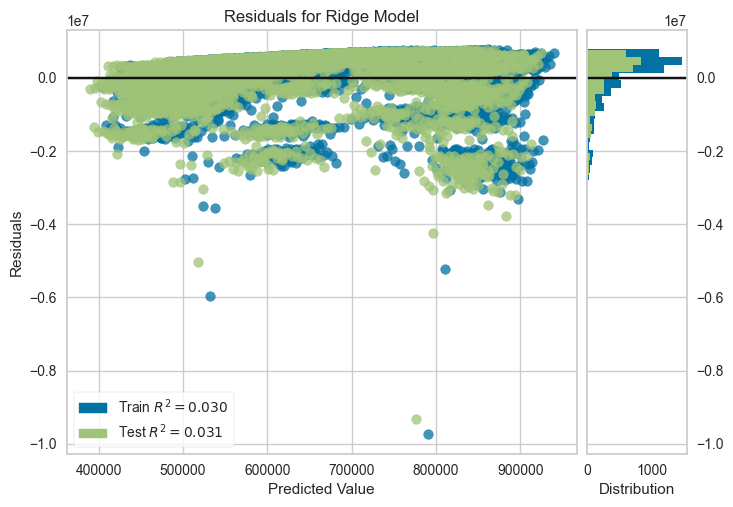

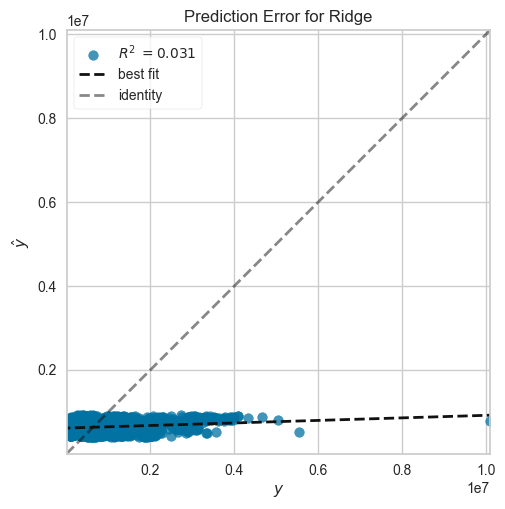

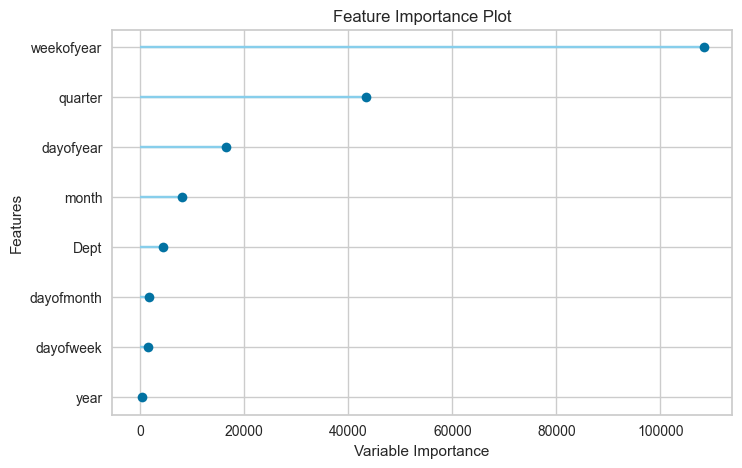

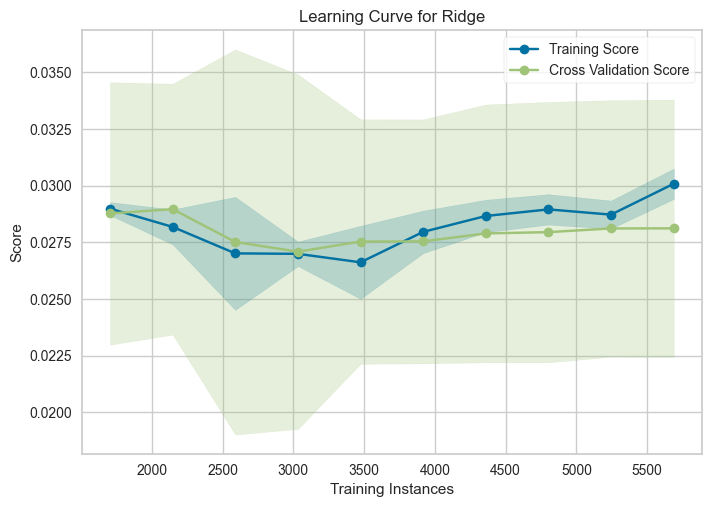

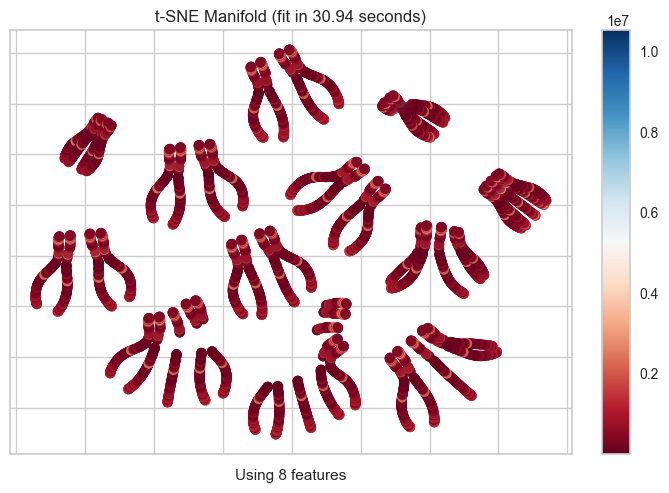

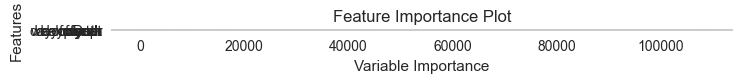

,Parameters
alpha,9.96
copy_X,True
fit_intercept,False
max_iter,None
positive,False
random_state,7065
solver,auto
tol,0.0001



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator',
                 Ridge(alpha=9.96, fit_intercept=False, random_state=7065))])

 
 >>print(final_mdl) for Model:ridge IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Ridge Regression,570146.8142,605625430692.2811,778219.3975,0.0330,1.6564,9.4105



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:ridge IS  DONE! 
 


 
 >> Prediction with Model:ridge  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,542102.9884,530571814875.7870,728403.6071,0.0254,1.5828,8.1833
1,542059.9444,501565917342.4546,708213.1864,0.0250,1.6166,14.9412
2,555519.7950,518523167870.1590,720085.5282,0.0280,1.6354,11.8618
3,548598.0247,505215895158.8013,710785.4072,0.0262,1.6411,10.0871
4,579351.1419,691861585097.9086,831782.1741,0.0179,1.5987,8.0986
5,584574.2276,706778589065.1157,840701.2484,0.0219,1.6470,9.2596
6,535011.2113,525019771675.0756,724582.4809,0.0370,1.6071,10.4320
7,541925.6242,508222638273.8060,712897.3547,0.0287,1.6531,13.7819
8,549537.5759,527607236155.8865,726365.7730,0.0324,1.7065,18.4079



 
 >>mdll = create_model(mdl) for Model:lar IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,542102.9884,530571814875.7870,728403.6071,0.0254,1.5828,8.1833
1,542059.9444,501565917342.4546,708213.1864,0.0250,1.6166,14.9412
2,555519.7950,518523167870.1590,720085.5282,0.0280,1.6354,11.8618
3,548598.0247,505215895158.8013,710785.4072,0.0262,1.6411,10.0871
4,579351.1419,691861585097.9086,831782.1741,0.0179,1.5987,8.0986
5,584574.2276,706778589065.1157,840701.2484,0.0219,1.6470,9.2596
6,535011.2113,525019771675.0756,724582.4809,0.0370,1.6071,10.4320
7,541925.6242,508222638273.8060,712897.3547,0.0287,1.6531,13.7819
8,549537.5759,527607236155.8865,726365.7730,0.0324,1.7065,18.4079


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).

 
 >>tuned_mdl = tune_model(mdll) for Model:lar IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:lar IS  DONE! 
 



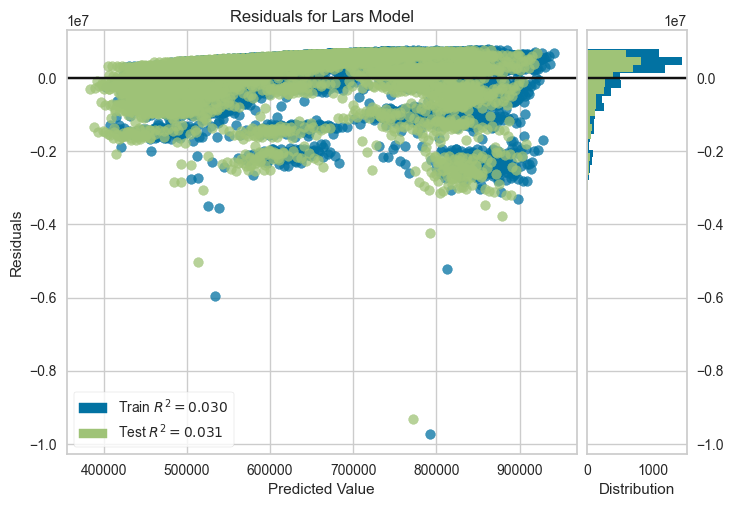

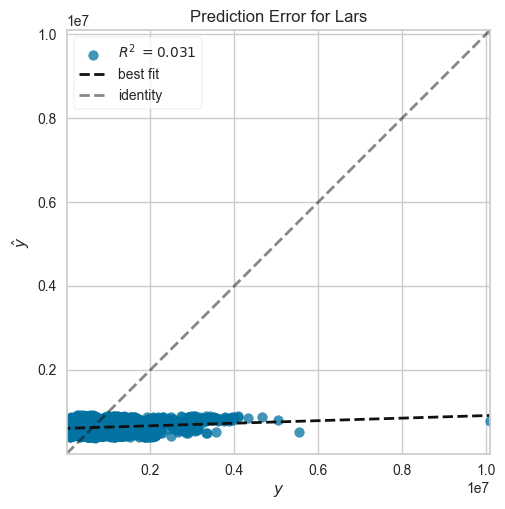

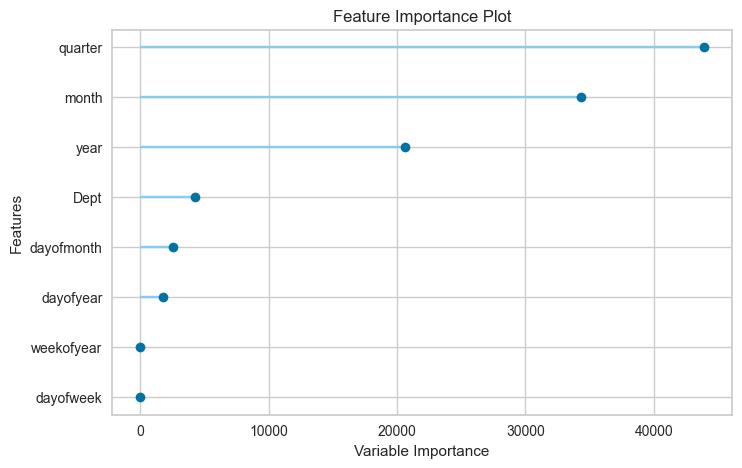

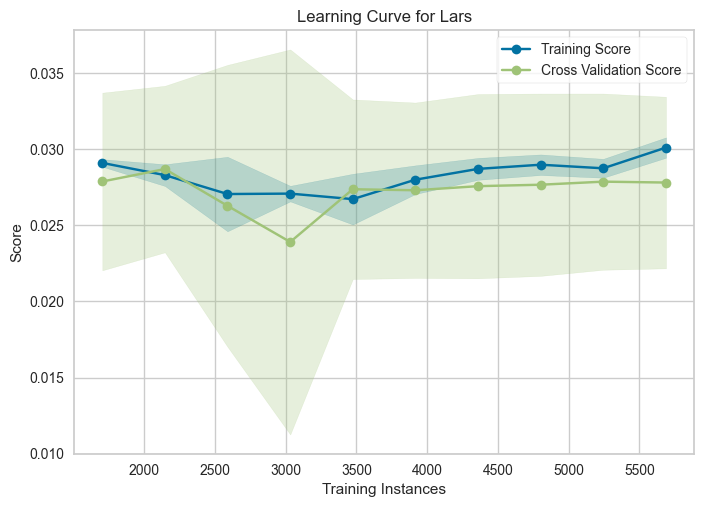

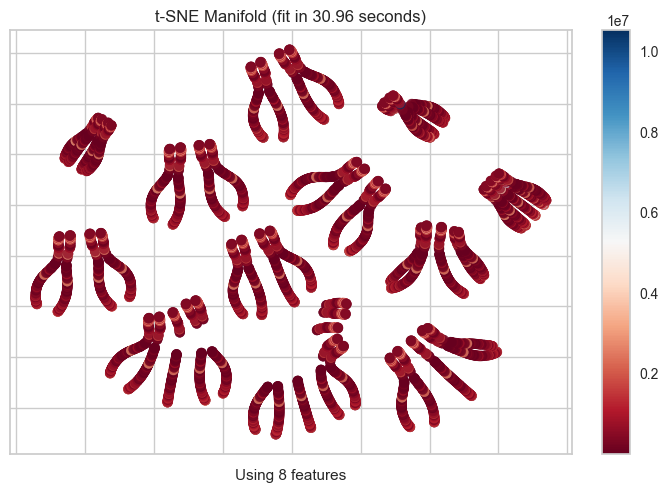

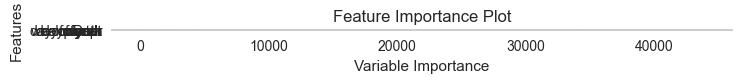

,Parameters
copy_X,True
eps,2.220446049250313e-16
fit_intercept,True
fit_path,True
jitter,None
n_nonzero_coefs,500
normalize,deprecated
precompute,auto
random_state,7065
verbose,False



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator', Lars(random_state=7065))])

 
 >>print(final_mdl) for Model:lar IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Least Angle Regression,570159.1785,605632273453.8040,778223.7939,0.0330,1.6564,9.4109



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:lar IS  DONE! 
 


 
 >> Prediction with Model:lar  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,541361.6032,530373091712.2814,728267.1843,0.0257,1.5812,8.1487
1,542059.9444,501565917342.4555,708213.1864,0.0250,1.6166,14.9412
2,554045.6005,519205553353.4650,720559.1949,0.0268,1.6325,11.7729
3,555415.3053,505515691982.3798,710996.2672,0.0257,1.6567,10.4790
4,579351.1419,691861585097.9097,831782.1741,0.0179,1.5987,8.0986
5,571688.9943,703435911341.6814,838710.8628,0.0265,1.6146,8.6362
6,529340.0908,525333022636.1248,724798.6083,0.0364,1.5959,10.1467
7,541811.0518,510520188150.4583,714506.9546,0.0243,1.6516,13.5328
8,553123.7761,527957419367.8556,726606.7846,0.0317,1.7143,18.7410



 
 >>mdll = create_model(mdl) for Model:lr IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,542102.9884,530571814875.8098,728403.6071,0.0254,1.5828,8.1833
1,542059.9444,501565917342.4552,708213.1864,0.0250,1.6166,14.9412
2,555519.7950,518523167870.1590,720085.5282,0.0280,1.6354,11.8618
3,548598.0247,505215895158.8224,710785.4072,0.0262,1.6411,10.0871
4,579351.1419,691861585097.9082,831782.1741,0.0179,1.5987,8.0986
5,584574.2276,706778589065.1558,840701.2484,0.0219,1.6470,9.2596
6,535011.2113,525019771675.0791,724582.4809,0.0370,1.6071,10.4320
7,541925.6242,508222638273.8198,712897.3547,0.0287,1.6531,13.7819
8,549537.5759,527607236155.8978,726365.7730,0.0324,1.7065,18.4079


Fitting 10 folds for each of 2 candidates, totalling 20 fits

 
 >>tuned_mdl = tune_model(mdll) for Model:lr IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:lr IS  DONE! 
 



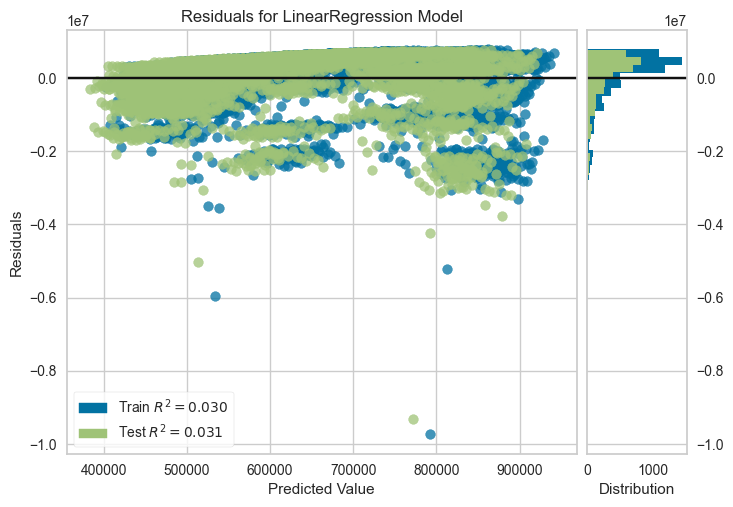

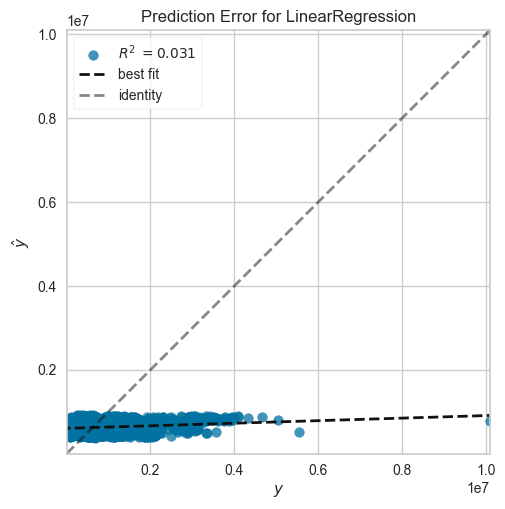

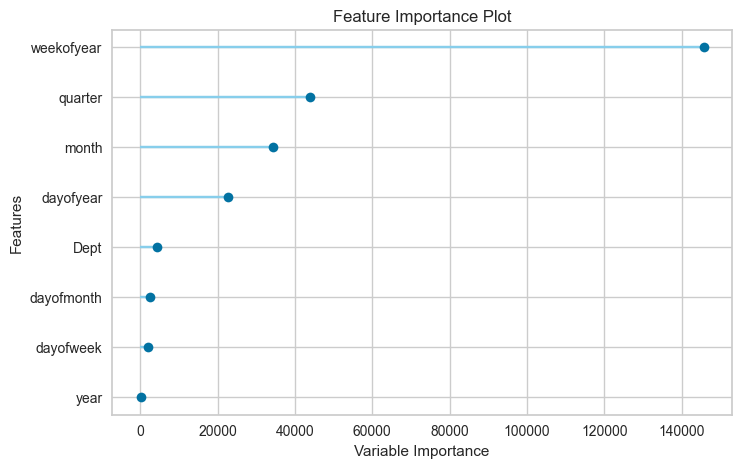

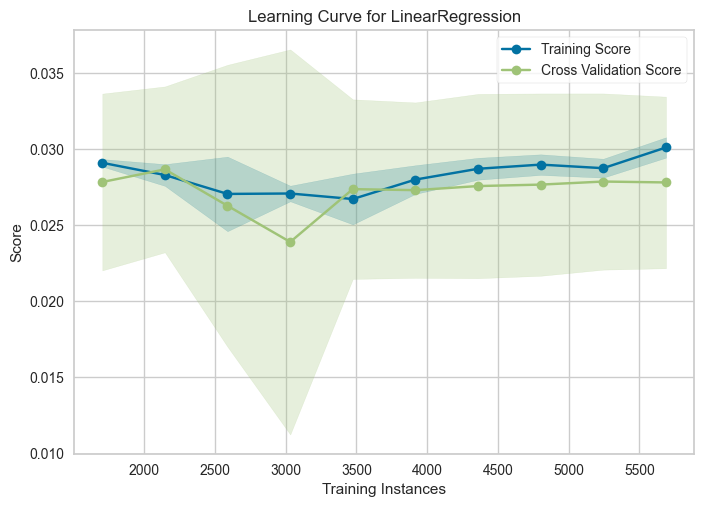

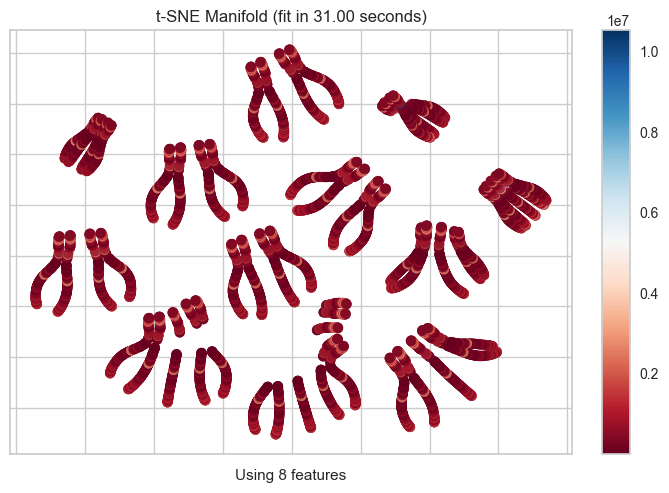

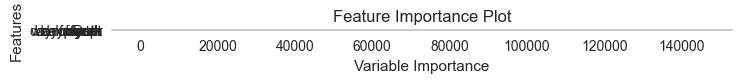

,Parameters
copy_X,True
fit_intercept,False
n_jobs,-1
positive,False



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator',
                 LinearRegression(fit_intercept=False, n_jobs=-1))])

 
 >>print(final_mdl) for Model:lr IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Linear Regression,570159.1785,605632273453.8065,778223.7939,0.0330,1.6564,9.4109



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:lr IS  DONE! 
 


 
 >> Prediction with Model:lr  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,44672.9709,11318550907.8886,106388.6785,0.9792,0.1556,0.0961
1,45223.4864,12969494953.5710,113883.6905,0.9748,0.1676,0.1027
2,29852.2470,2931515099.6362,54143.4677,0.9945,0.1155,0.0716
3,29406.0536,3595585013.8344,59963.1972,0.9931,0.1202,0.0766
4,104971.3607,184154675138.1552,429132.4681,0.7386,0.2855,0.1828
5,140013.1702,108083738721.4175,328760.9142,0.8504,0.3564,0.2841
6,45271.4794,11476879073.5413,107130.1968,0.9789,0.1714,0.1081
7,41275.2189,11376737987.1564,106661.7925,0.9783,0.1532,0.0893
8,26293.2969,2274856653.5240,47695.4574,0.9958,0.1458,0.0826



 
 >>mdll = create_model(mdl) for Model:dt IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,47692.3116,12020342620.1711,109637.3231,0.9779,0.1594,0.0997
1,43560.5221,11630905661.5310,107846.6766,0.9774,0.1652,0.0987
2,30841.9035,3093942365.3430,55623.2179,0.9942,0.1212,0.0746
3,31872.4003,3534574500.2620,59452.2876,0.9932,0.1232,0.0805
4,112051.9728,155542911473.5427,394389.2892,0.7792,0.2674,0.1881
5,151960.0029,170425770686.6217,412826.5625,0.7641,0.3934,0.3050
6,41576.1645,7067617148.0278,84069.1213,0.9870,0.1555,0.0957
7,39490.6262,10262763836.7119,101305.3001,0.9804,0.1540,0.0874
8,27503.9219,2430468338.3565,49299.7803,0.9955,0.1348,0.0779


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).

 
 >>tuned_mdl = tune_model(mdll) for Model:dt IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:dt IS  DONE! 
 



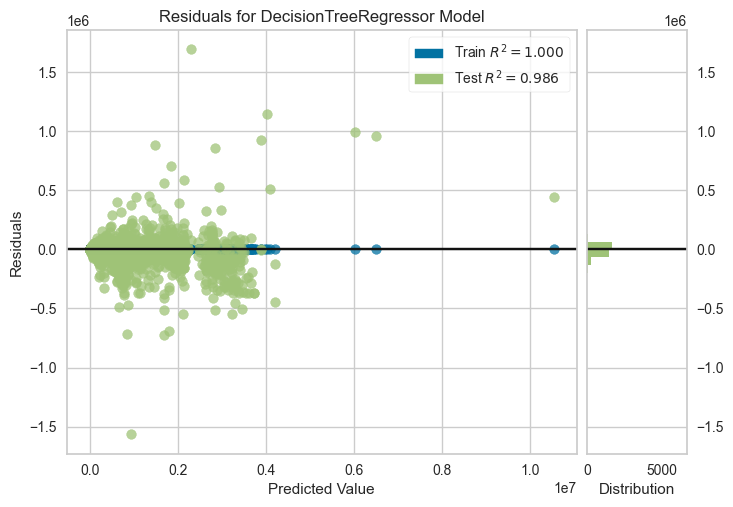

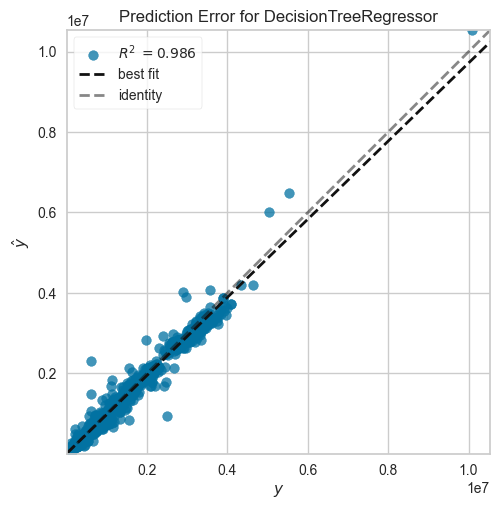

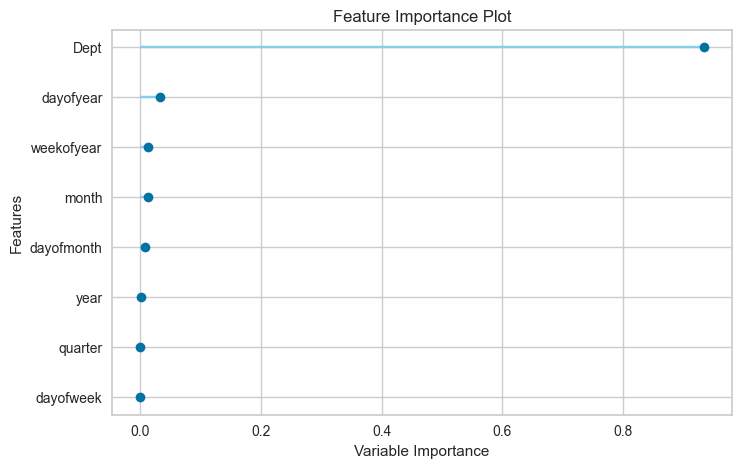

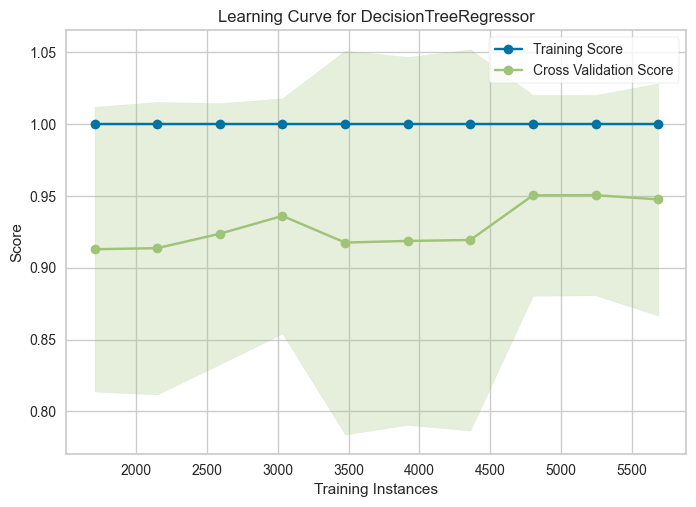

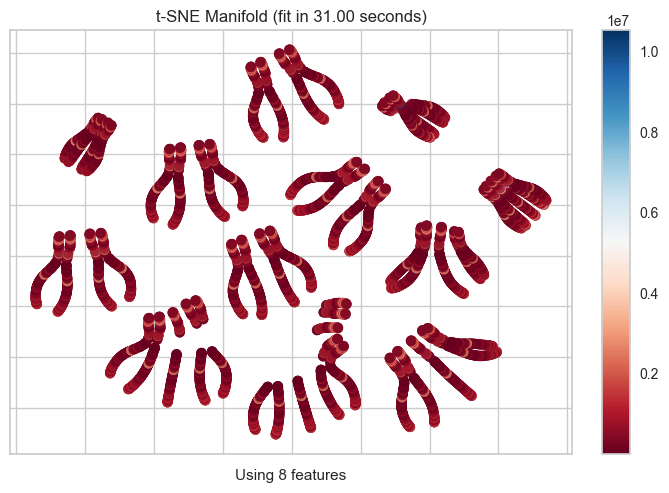

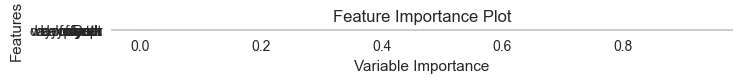

,Parameters
ccp_alpha,0.0
criterion,squared_error
max_depth,None
max_features,None
max_leaf_nodes,None
min_impurity_decrease,0.0
min_samples_leaf,1
min_samples_split,2
min_weight_fraction_leaf,0.0
random_state,7065



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator', DecisionTreeRegressor(random_state=7065))])

 
 >>print(final_mdl) for Model:dt IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Decision Tree Regressor,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:dt IS  DONE! 
 


 
 >> Prediction with Model:dt  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,39847.3013,9367681491.5910,96786.7837,0.9828,0.1342,0.0860
1,38174.4809,9513552854.9524,97537.4433,0.9815,0.1486,0.0866
2,23214.0260,1814840057.3210,42600.9396,0.9966,0.0860,0.0550
3,27743.9075,2485567477.3971,49855.4659,0.9952,0.1141,0.0723
4,89217.9242,124772462143.5430,353231.4569,0.8229,0.2474,0.1731
5,138197.5373,106206859676.3115,325893.9393,0.8530,0.3697,0.2998
6,36973.3585,7022253377.6252,83798.8865,0.9871,0.1377,0.0875
7,34749.3981,9051215452.1545,95137.8760,0.9827,0.1272,0.0739
8,22189.8721,1528904616.9936,39101.2099,0.9972,0.1114,0.0606



 
 >>mdll = create_model(mdl) for Model:rf IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,233848.9401,132352870161.6768,363803.3400,0.7569,1.0157,2.1327
1,240465.6310,146749675106.1977,383079.2021,0.7147,1.0839,3.2390
2,209040.3082,99762007477.7193,315851.2426,0.8130,1.0418,2.7127
3,208501.5383,98513162517.0793,313868.0655,0.8101,1.0148,2.2353
4,259136.2914,257992531165.5490,507929.6518,0.6338,0.9672,1.7622
5,281653.1601,243115805507.8048,493067.7494,0.6635,1.0604,2.2521
6,220631.9574,115369484999.2402,339660.8382,0.7884,1.0369,2.5077
7,244443.0067,146876738272.5664,383245.0108,0.7193,1.1047,3.0187
8,221734.9958,116030533553.9152,340632.5492,0.7872,1.1213,3.9893


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).

 
 >>tuned_mdl = tune_model(mdll) for Model:rf IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:rf IS  DONE! 
 



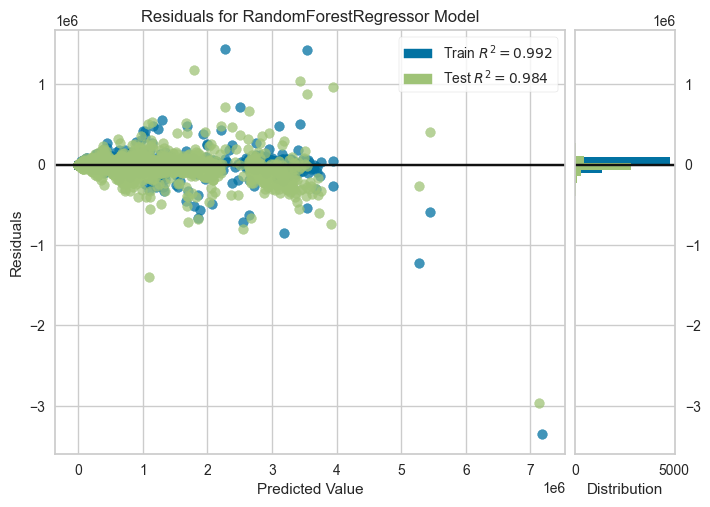

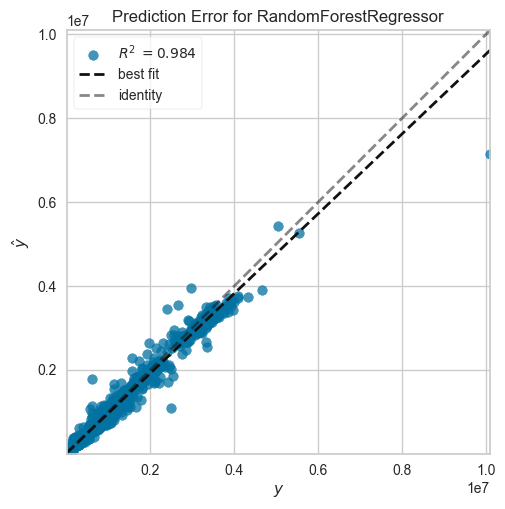

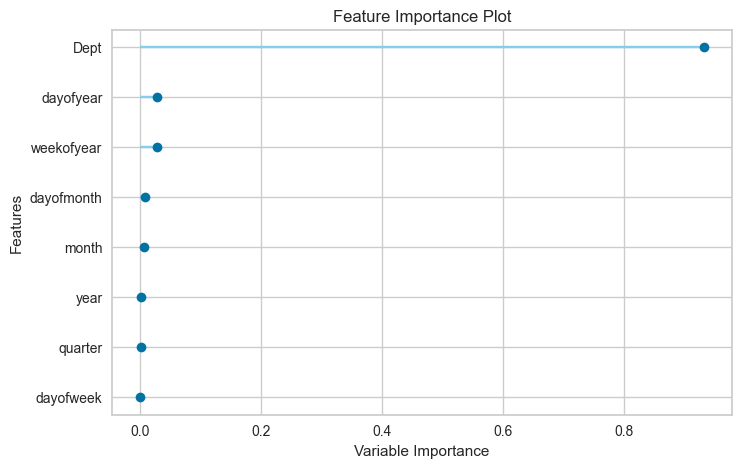

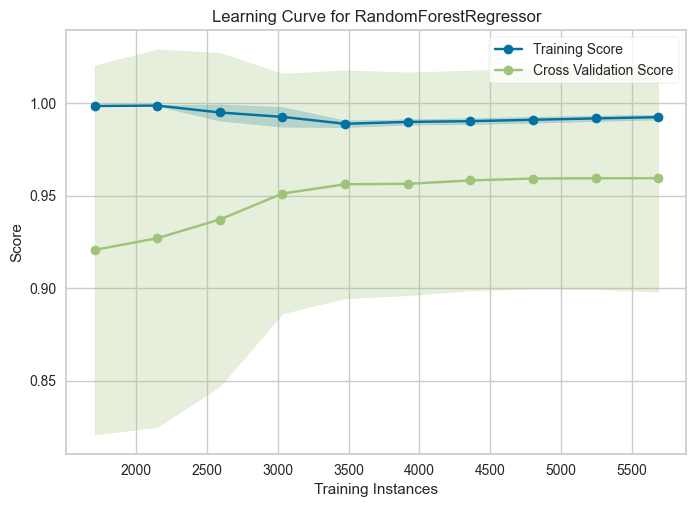

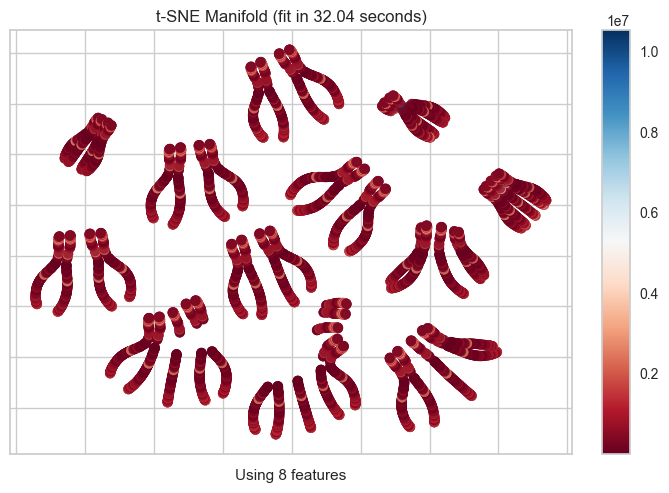

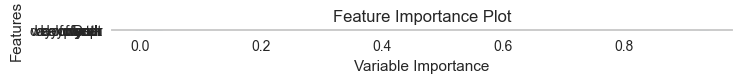

,Parameters
bootstrap,True
ccp_alpha,0.0
criterion,squared_error
max_depth,None
max_features,1.0
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.0
min_samples_leaf,1
min_samples_split,2



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator',
                 RandomForestRegressor(n_jobs=-1, random_state=7065))])

 
 >>print(final_mdl) for Model:rf IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Random Forest Regressor,12746.6886,1744563854.1235,41767.9764,0.9972,0.0467,0.0250



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:rf IS  DONE! 
 


 
 >> Prediction with Model:rf  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,40674.9839,7625638743.6570,87324.9033,0.9860,0.1458,0.0916
1,50312.5471,22362334814.4190,149540.4120,0.9565,0.1830,0.1132
2,23705.4391,1942907346.5877,44078.4227,0.9964,0.0918,0.0584
3,25940.7977,1949613136.3814,44154.4237,0.9962,0.1101,0.0705
4,116234.3155,135569367265.8542,368197.4569,0.8076,0.3804,0.3312
5,139590.7107,127685764897.0822,357331.4496,0.8233,0.4908,0.5783
6,43630.8764,12150616440.2980,110229.8346,0.9777,0.1675,0.0989
7,35419.6184,7747890850.0390,88022.1043,0.9852,0.1472,0.0853
8,23717.9554,1769572947.6314,42066.2923,0.9968,0.1193,0.0663



 
 >>mdll = create_model(mdl) for Model:et IS  DONE! 
 



,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,340831.8108,263955197570.0088,513765.7030,0.5151,1.1566,3.4042
1,339855.8512,242900159087.2336,492849.0226,0.5278,1.2430,6.6881
2,337725.0773,253537981982.0424,503525.5525,0.5248,1.2365,5.2064
3,333743.0135,245354122443.3354,495332.3354,0.5271,1.2232,4.2484
4,358225.5190,376178345828.9549,613333.7964,0.4660,1.1773,3.3792
5,401928.6290,407402836415.2720,638281.1578,0.4362,1.2370,3.9339
6,344889.0991,261641074784.6871,511508.6263,0.5201,1.2566,5.0276
7,351884.7051,256384039085.9644,506343.7953,0.5100,1.3023,6.2641
8,336232.2061,230411450740.6527,480011.9277,0.5774,1.3208,8.2751


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).

 
 >>tuned_mdl = tune_model(mdll) for Model:et IS  DONE! 
 


 
 >>final_mdl = finalize_model(tuned_mdl) for Model:et IS  DONE! 
 



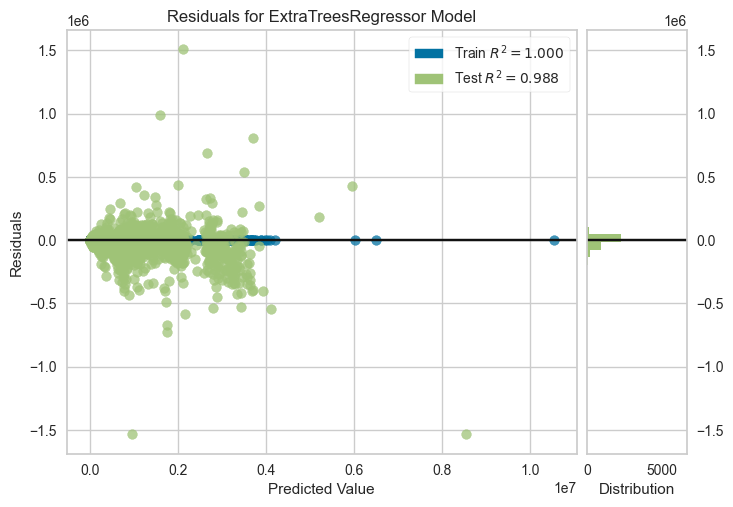

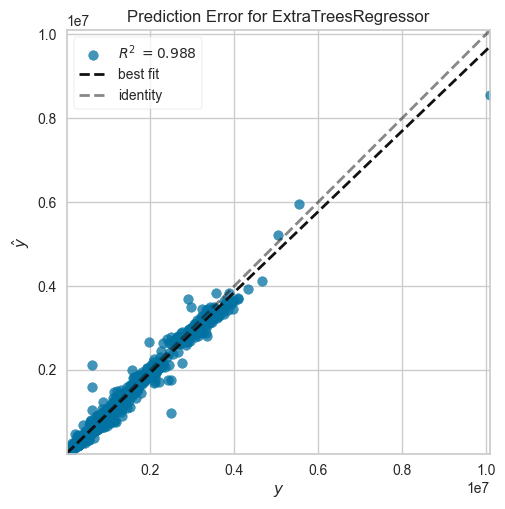

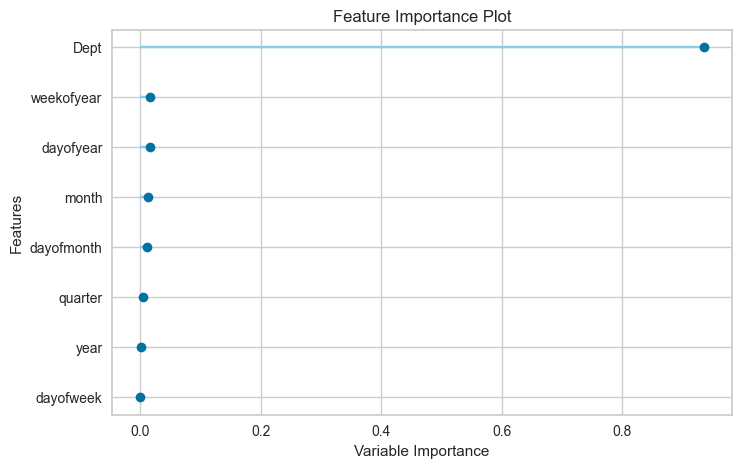

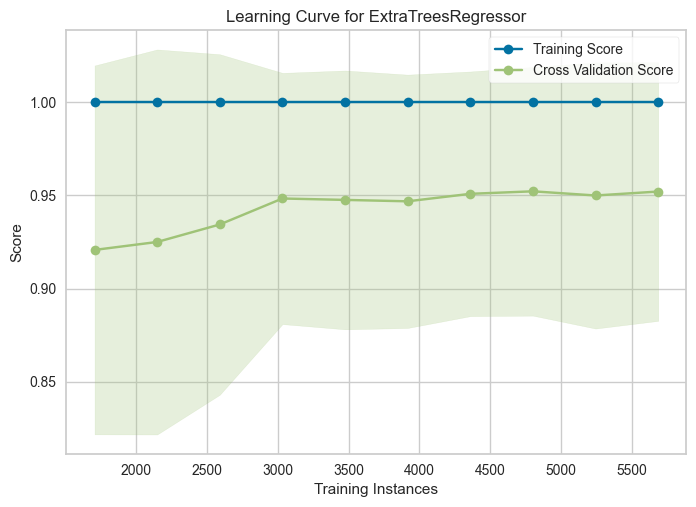

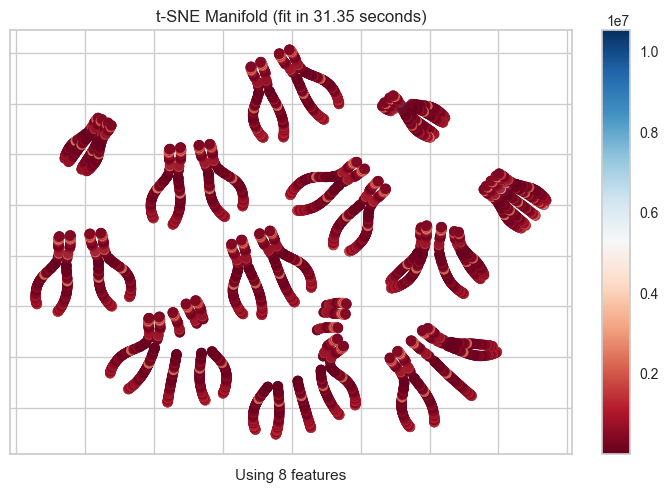

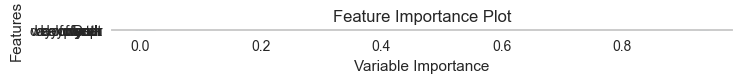

,Parameters
bootstrap,False
ccp_alpha,0.0
criterion,squared_error
max_depth,None
max_features,1.0
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.0
min_samples_leaf,1
min_samples_split,2



 
 >>plotting is  DONE! 
 

Pipeline(memory=Memory(location=None),
         steps=[('placeholder', None),
                ('actual_estimator',
                 ExtraTreesRegressor(n_jobs=-1, random_state=7065))])

 
 >>print(final_mdl) for Model:et IS  DONE! 
 



,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extra Trees Regressor,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000



 
 >>pred_mdl = predict_model(final_mdl, data=test) for Model:et IS  DONE! 
 


 
 >> Prediction with Model:et  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,41128.9406,10034216010.8129,100170.9340,0.9816,0.1403,0.0884
1,40136.1140,10738746713.5577,103627.9244,0.9791,0.1529,0.0910
2,24876.7741,2089884698.4265,45715.2567,0.9961,0.0943,0.0601
3,27352.3453,2703460868.3435,51994.8158,0.9948,0.1133,0.0725
4,93253.3512,146548999525.6648,382817.1881,0.7920,0.2490,0.1709
5,136587.6623,101105478745.5655,317970.8772,0.8601,0.3588,0.2888
6,39366.3707,8597299314.0055,92721.6227,0.9842,0.1473,0.0933
7,36477.4016,9742213769.8569,98702.6533,0.9814,0.1369,0.0789
8,22796.6628,1605303746.2801,40066.2420,0.9971,0.1260,0.0676


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,39958.5809,9495079070.7714,97442.6963,0.9826,0.1350,0.0860
1,38414.3251,9761000653.1857,98797.7766,0.9810,0.1488,0.0869
2,23338.0443,1835609367.0140,42844.0120,0.9966,0.0869,0.0557
3,27359.6834,2479023675.3671,49789.7949,0.9952,0.1130,0.0719
4,89772.3610,129379111780.2341,359693.0800,0.8163,0.2454,0.1711
5,137494.9934,103516705848.4863,321740.1216,0.8567,0.3658,0.2962
6,37151.5721,7339150806.0649,85668.8438,0.9865,0.1386,0.0881
7,34990.6947,9152365389.9065,95667.9956,0.9825,0.1292,0.0748
8,22058.6861,1490207043.9369,38603.1999,0.9973,0.1150,0.0616


Fitting 10 folds for each of 10 candidates, totalling 100 fits


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Voting Regressor,40267.8774,9181184183.3260,95818.4960,0.9853,0.1506,0.0891


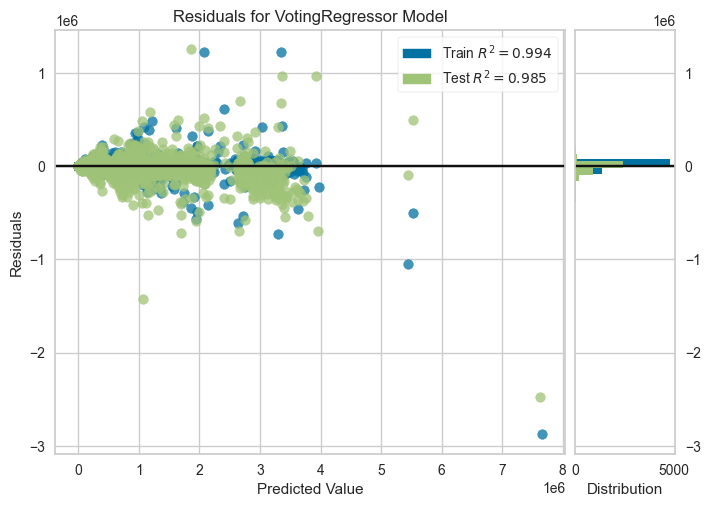

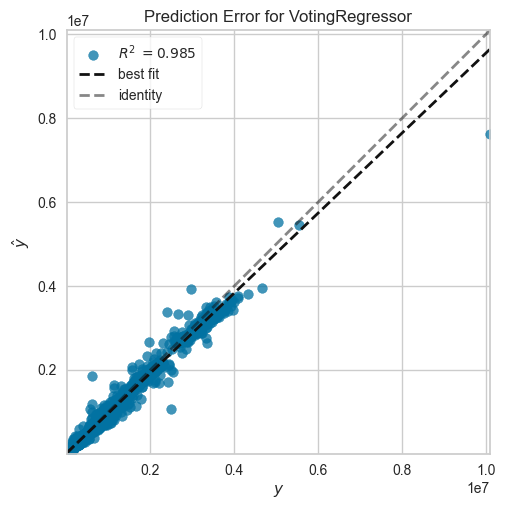

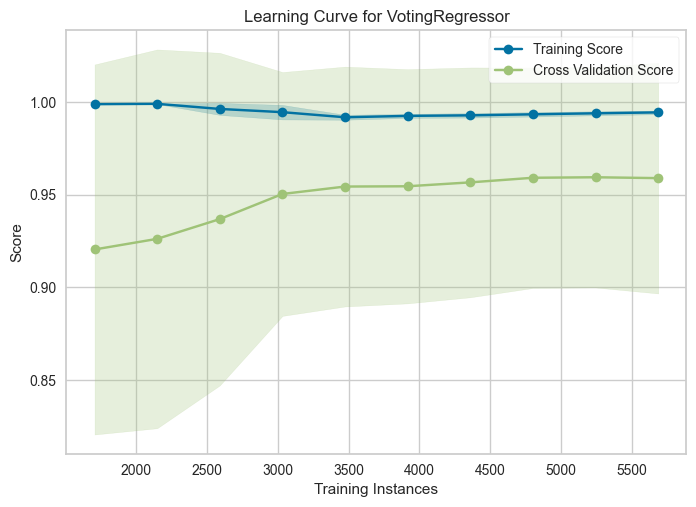

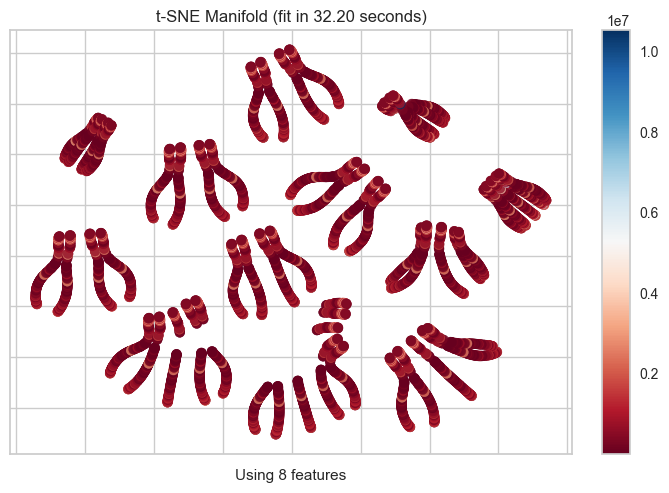

,Parameters
estimators,"[('Random Forest Regressor', RandomForestRegre..."
n_jobs,1
verbose,False
weights,"[0.54, 0.09]"



 
 >>plotting is  DONE! 
 


 
 >> Prediction with Model:blend2  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,39636.4941,8899737344.0341,94338.4192,0.9837,0.1372,0.0869
1,40650.9537,12738525275.2976,112865.0755,0.9752,0.1587,0.0937
2,23434.6217,1891605895.6671,43492.5959,0.9965,0.0903,0.0574
3,26068.0743,2317212530.1649,48137.4338,0.9955,0.1097,0.0695
4,95470.4283,138141670486.7264,371674.1456,0.8039,0.2687,0.2064
5,135570.0290,101627124208.9970,318790.0943,0.8594,0.4142,0.3799
6,38550.9592,8769583982.1041,93646.0569,0.9839,0.1466,0.0896
7,34898.1486,8652436788.8463,93018.4755,0.9835,0.1358,0.0786
8,22243.0313,1522495334.1039,39019.1662,0.9972,0.1219,0.0647


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,39411.5939,8986151969.2726,94795.3162,0.9835,0.1337,0.0856
1,38941.8015,10871328752.6056,104265.6643,0.9789,0.1527,0.0892
2,22795.0945,1767537534.3225,42042.0924,0.9967,0.0860,0.0549
3,26842.6797,2338290492.6638,48355.8734,0.9955,0.1114,0.0706
4,89652.3513,126863001986.5804,356178.3289,0.8199,0.2504,0.1846
5,136714.5408,104505839057.3272,323273.6288,0.8554,0.3953,0.3405
6,37213.4123,7631586825.7592,87358.9539,0.9860,0.1395,0.0869
7,34441.5097,8723850819.0066,93401.5568,0.9833,0.1295,0.0754
8,21848.0300,1468718505.7866,38323.8634,0.9973,0.1140,0.0609


Fitting 10 folds for each of 10 candidates, totalling 100 fits


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Voting Regressor,39475.6673,8687000411.9768,93204.0794,0.9861,0.1492,0.0877


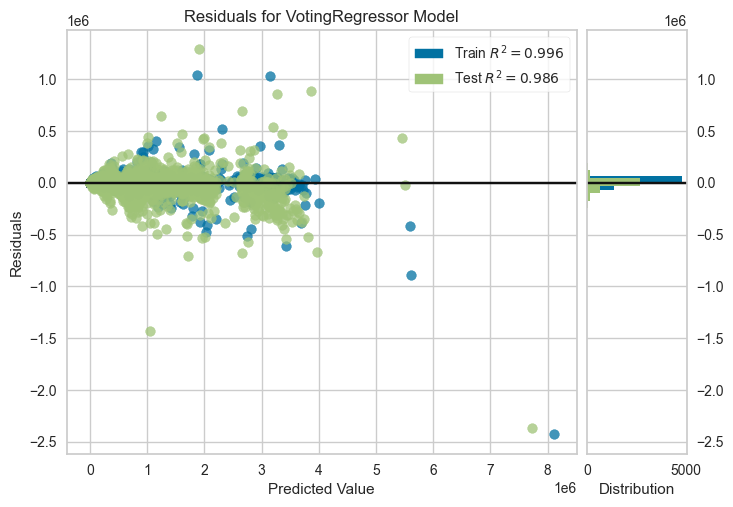

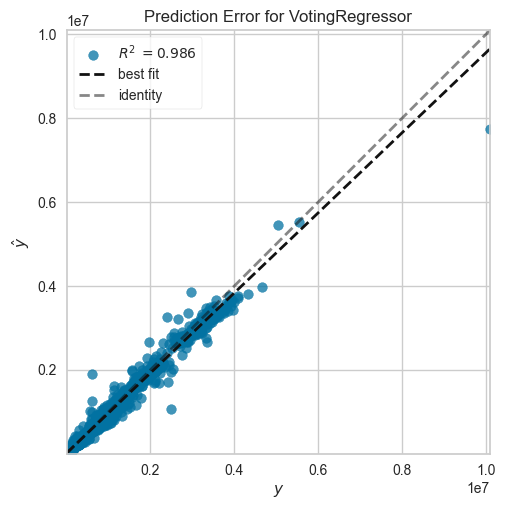

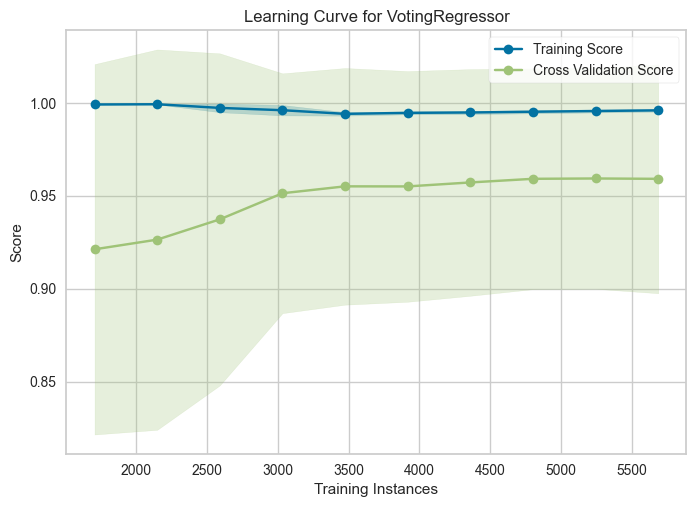

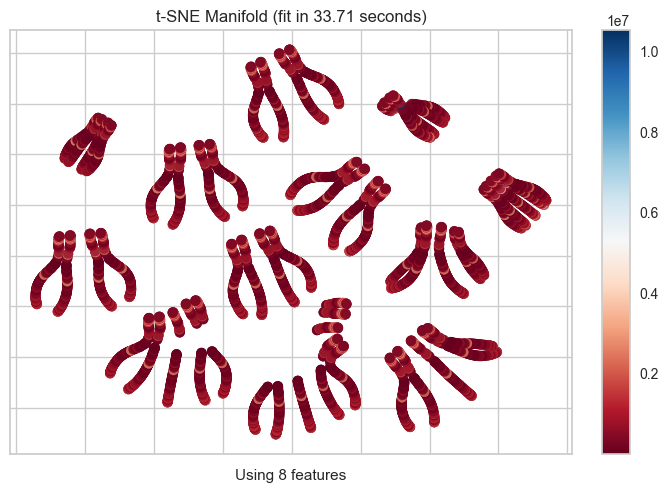

,Parameters
estimators,"[('Random Forest Regressor', RandomForestRegre..."
n_jobs,1
verbose,False
weights,"[0.92, 0.13, 0.22]"



 
 >>plotting is  DONE! 
 


 
 >> Prediction with Model:blend3  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,39067.6393,8514513094.9638,92274.1193,0.9844,0.1812,0.1093
1,40418.8993,11859741078.8572,108902.4384,0.9769,0.1797,0.1074
2,23482.3625,1805676964.6232,42493.2579,0.9966,0.1736,0.0876
3,26785.0683,2180531165.2616,46696.1579,0.9958,0.1842,0.0915
4,87557.0379,135232828522.4029,367740.1644,0.8080,0.2609,0.1860
5,135158.7109,98334018475.9862,313582.5545,0.8639,0.4562,0.4707
6,37696.1306,8333450466.7956,91287.7345,0.9847,0.1920,0.1074
7,34604.8644,8685241363.7031,93194.6424,0.9834,0.1686,0.0961
8,22697.3252,1400725519.8723,37426.2678,0.9974,0.1643,0.0902


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,38865.1318,8357002675.0183,91416.6433,0.9846,0.1790,0.1078
1,40418.3538,11957159423.0389,109348.7971,0.9768,0.1785,0.1068
2,23184.8692,1757761618.6528,41925.6678,0.9967,0.1734,0.0858
3,26872.0831,2157953401.2962,46453.7770,0.9958,0.1806,0.0910
4,87681.7182,131280429058.7468,362326.4123,0.8136,0.2626,0.1920
5,135320.6069,99921109374.8766,316103.0044,0.8617,0.4592,0.4769
6,37580.7039,8185628831.4199,90474.4651,0.9850,0.1896,0.1059
7,34353.4720,8575851042.4606,92605.8910,0.9836,0.1666,0.0950
8,22556.4447,1393025654.2399,37323.2589,0.9974,0.1605,0.0883


Fitting 10 folds for each of 10 candidates, totalling 100 fits


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Voting Regressor,40628.9536,10148697470.9051,100740.7438,0.9838,0.1952,0.1043


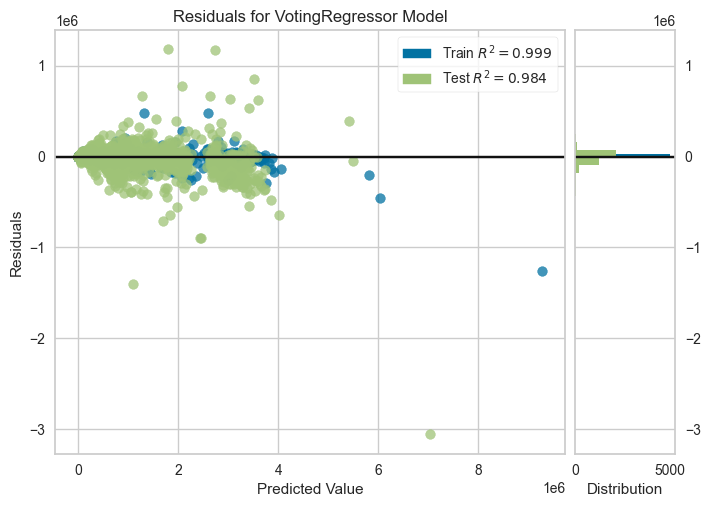

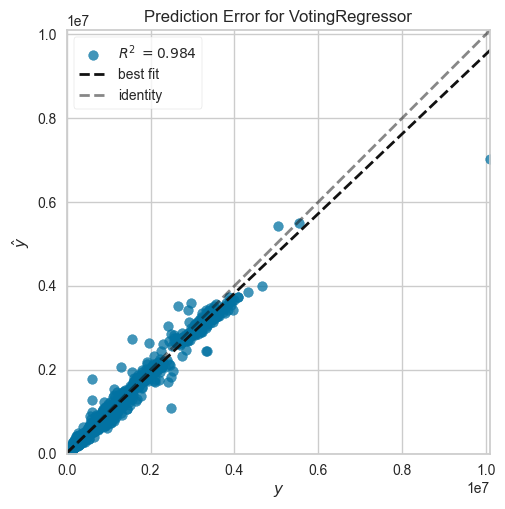

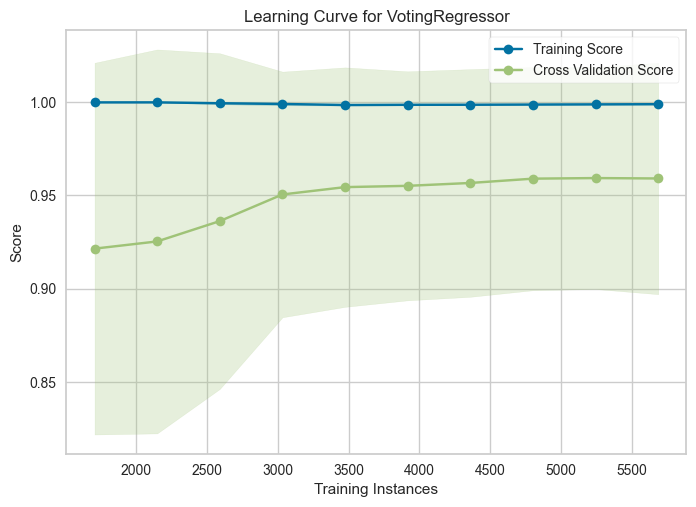

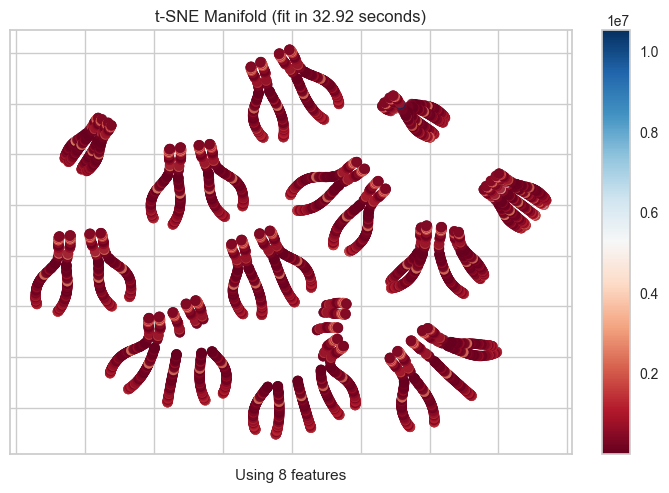

,Parameters
estimators,"[('Random Forest Regressor', RandomForestRegre..."
n_jobs,1
verbose,False
weights,"[0.8400000000000001, 0.39, 0.7100000000000001,..."



 
 >>plotting is  DONE! 
 


 
 >> Prediction with Model:blend4  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,43141.8237,9636571934.5690,98166.0427,0.9823,0.2818,0.1928
1,42605.1718,10713039741.8487,103503.8151,0.9792,0.3273,0.2764
2,25324.3776,1878827603.6139,43345.4450,0.9965,0.2794,0.1921
3,30594.4362,2634571442.9789,51328.0766,0.9949,0.2083,0.1289
4,85760.5388,132419248491.8819,363894.5568,0.8120,0.3315,0.2595
5,138414.8329,98131484703.5010,313259.4527,0.8642,0.5271,0.6018
6,38307.0342,7121963657.6375,84391.7274,0.9869,0.2660,0.1903
7,37042.4953,8873954616.0777,94201.6699,0.9830,0.3333,0.2611
8,25654.5702,1588604445.7792,39857.3010,0.9971,0.3294,0.2859


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,43909.9645,9663022078.4758,98300.6718,0.9822,0.2994,0.2122
1,43495.6327,10866807904.7244,104243.9826,0.9789,0.3440,0.3069
2,25792.8181,1913796706.4076,43746.9623,0.9964,0.2973,0.2139
3,32017.5884,2806461137.3383,52976.0431,0.9946,0.2231,0.1414
4,85750.9841,129479839453.1437,359833.0717,0.8162,0.3374,0.2671
5,139749.7979,99474791253.0940,315396.2448,0.8623,0.5528,0.6697
6,38699.2600,6981677670.7263,83556.4340,0.9872,0.2806,0.2065
7,37747.6644,8929298385.0044,94494.9649,0.9829,0.3506,0.2903
8,26540.4583,1693977785.4872,41157.9614,0.9969,0.3474,0.3195


Fitting 10 folds for each of 10 candidates, totalling 100 fits


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Voting Regressor,45326.2547,12849063253.8324,113353.7086,0.9795,0.2816,0.1998


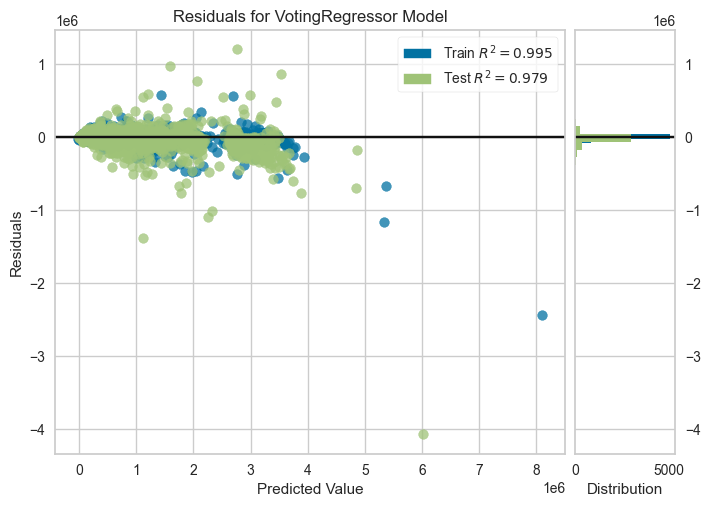

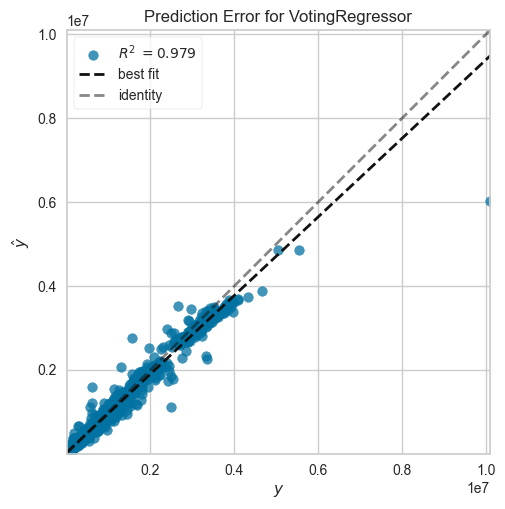

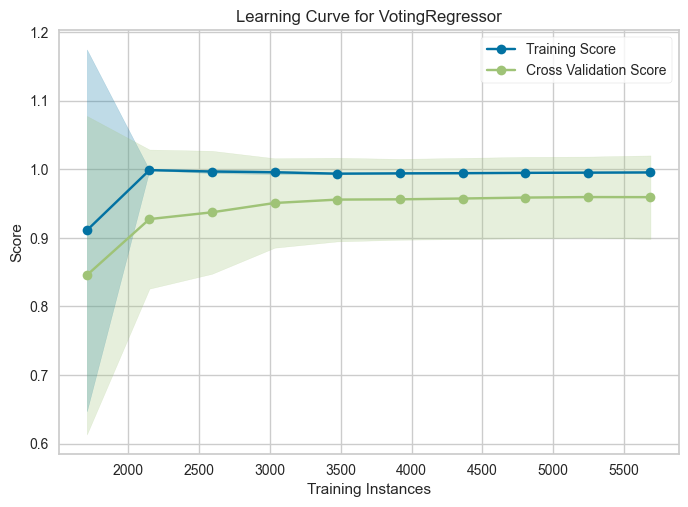

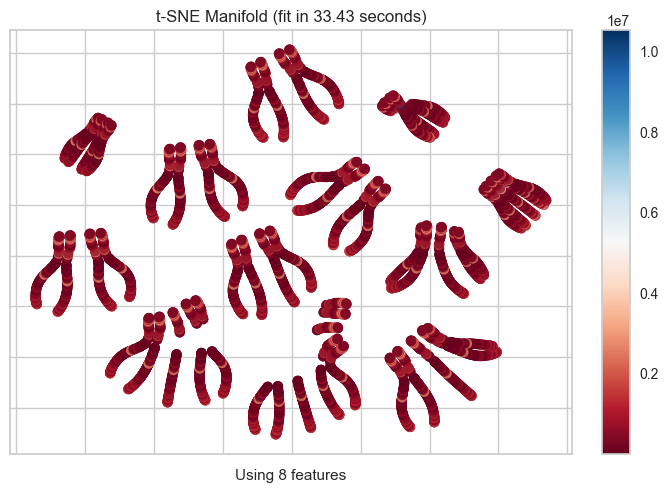

,Parameters
estimators,"[('Random Forest Regressor', RandomForestRegre..."
n_jobs,1
verbose,False
weights,"[0.99, 0.31, 0.9600000000000001, 0.91, 0.95000..."



 
 >>plotting is  DONE! 
 


 
 >> Prediction with Model:blend5  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,46135.8907,10562161050.0692,102772.3749,0.9806,0.3284,0.2005
1,41482.8539,10177374767.6237,100882.9756,0.9802,0.3981,0.3978
2,32790.9815,2526003227.5526,50259.3596,0.9953,0.3735,0.3375
3,62958.8668,6277997267.8485,79233.8139,0.9879,0.5770,0.7611
4,128198.3035,128163785787.2224,357999.7008,0.8181,0.6004,0.7933
5,136119.2420,106500136580.0754,326343.5867,0.8526,0.5374,0.5050
6,49569.6925,7680107958.9956,87636.2252,0.9859,0.7652,0.6148
7,45615.2811,9997105585.8727,99985.5269,0.9809,0.6831,0.7059
8,29904.2945,1874906334.6760,43300.1886,0.9966,0.5152,0.6308


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,46135.8907,10562161050.0692,102772.3749,0.9806,0.3284,0.2005
1,41482.8539,10177374767.6237,100882.9756,0.9802,0.3981,0.3978
2,32790.9815,2526003227.5526,50259.3596,0.9953,0.3735,0.3375
3,62958.8668,6277997267.8485,79233.8139,0.9879,0.5770,0.7611
4,128198.3035,128163785787.2224,357999.7008,0.8181,0.6004,0.7933
5,136119.2420,106500136580.0754,326343.5867,0.8526,0.5374,0.5050
6,49569.6925,7680107958.9956,87636.2252,0.9859,0.7652,0.6148
7,45615.2811,9997105585.8727,99985.5269,0.9809,0.6831,0.7059
8,29904.2945,1874906334.6760,43300.1886,0.9966,0.5152,0.6308


Fitting 10 folds for each of 2 candidates, totalling 20 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,65327.3411,16950988219.5459,130195.9608,0.9729,0.6567,0.5809


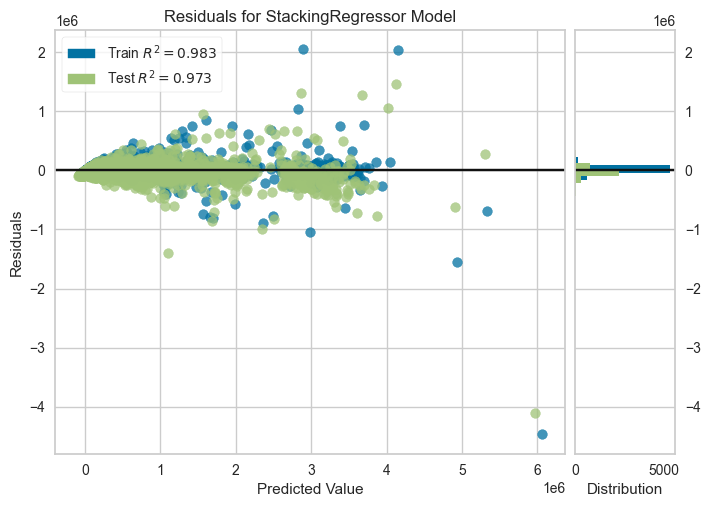

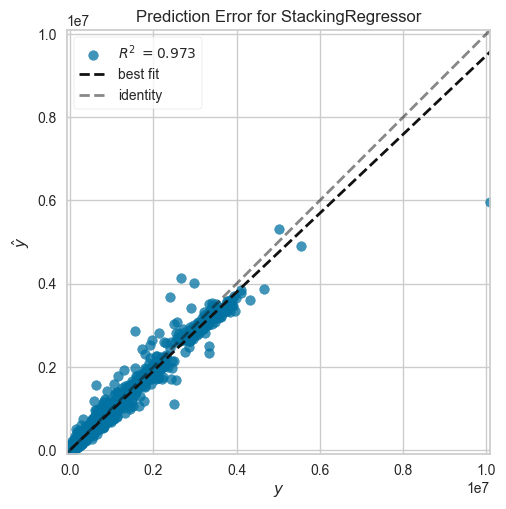

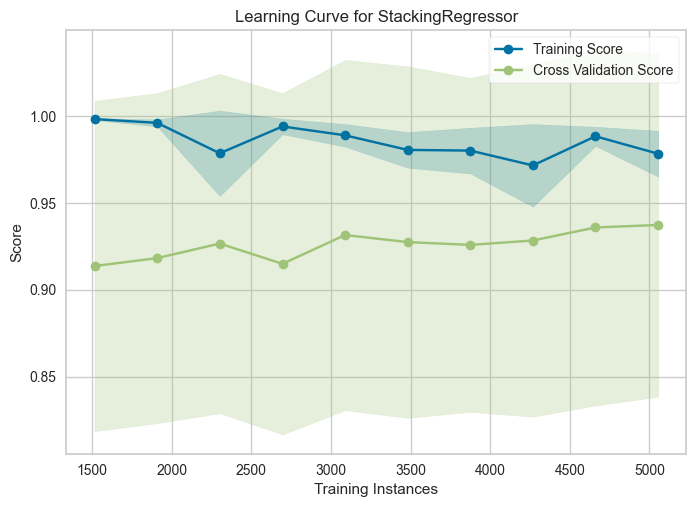

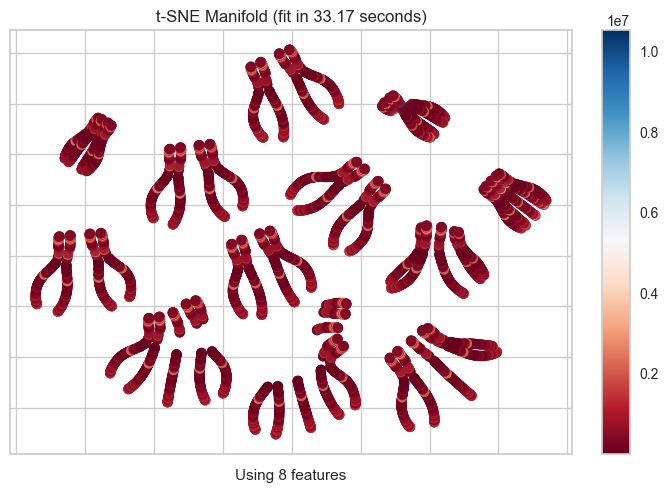

,Parameters
cv,5
estimators,"[('Random Forest Regressor', RandomForestRegre..."
final_estimator,LinearRegression(n_jobs=-1)
n_jobs,1
passthrough,True
verbose,0



 
 >>plotting is  DONE! 
 


 
 >> Prediction with Model:stacker2  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,44466.0348,9139757641.4580,95602.0797,0.9832,0.3206,0.1916
1,42358.3026,12124205676.2579,110109.9708,0.9764,0.4111,0.4127
2,31203.6853,2364128115.7211,48622.3006,0.9956,0.3709,0.3091
3,61959.2729,5944759164.6084,77102.2643,0.9885,0.5724,0.7481
4,138709.7167,126891780934.5748,356218.7263,0.8199,0.6340,0.8638
5,135662.1180,107998132899.6185,328630.6938,0.8505,0.5582,0.5455
6,53809.3209,9743921101.0720,98711.3018,0.9821,0.7598,0.6378
7,45585.8109,9374361591.5006,96821.2869,0.9821,0.7400,0.7225
8,29692.5053,1853090682.7117,43047.5398,0.9966,0.4882,0.6094


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,44466.0348,9139757641.4580,95602.0797,0.9832,0.3206,0.1916
1,42358.3026,12124205676.2579,110109.9708,0.9764,0.4111,0.4127
2,31203.6853,2364128115.7211,48622.3006,0.9956,0.3709,0.3091
3,61959.2729,5944759164.6084,77102.2643,0.9885,0.5724,0.7481
4,138709.7167,126891780934.5748,356218.7263,0.8199,0.6340,0.8638
5,135662.1180,107998132899.6185,328630.6938,0.8505,0.5582,0.5455
6,53809.3209,9743921101.0720,98711.3018,0.9821,0.7598,0.6378
7,45585.8109,9374361591.5006,96821.2869,0.9821,0.7400,0.7225
8,29692.5053,1853090682.7117,43047.5398,0.9966,0.4882,0.6094


Fitting 10 folds for each of 2 candidates, totalling 20 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,63788.7438,15437871300.3427,124249.2306,0.9754,0.6456,0.5760


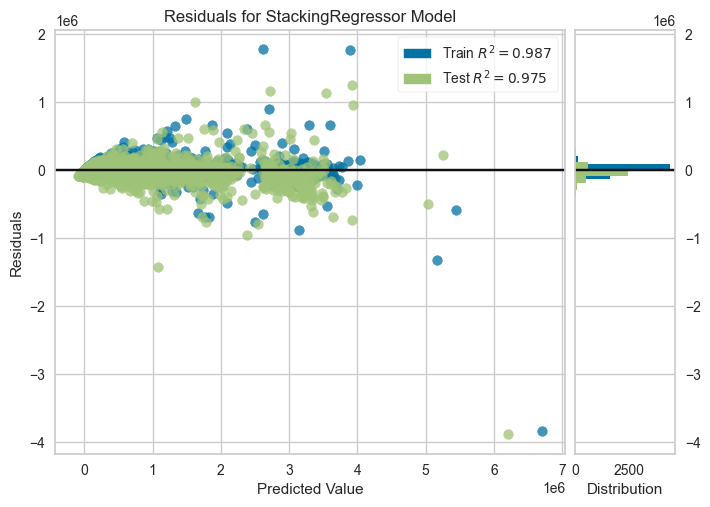

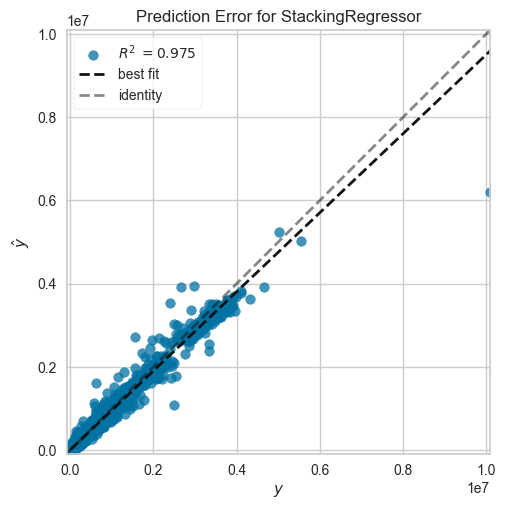

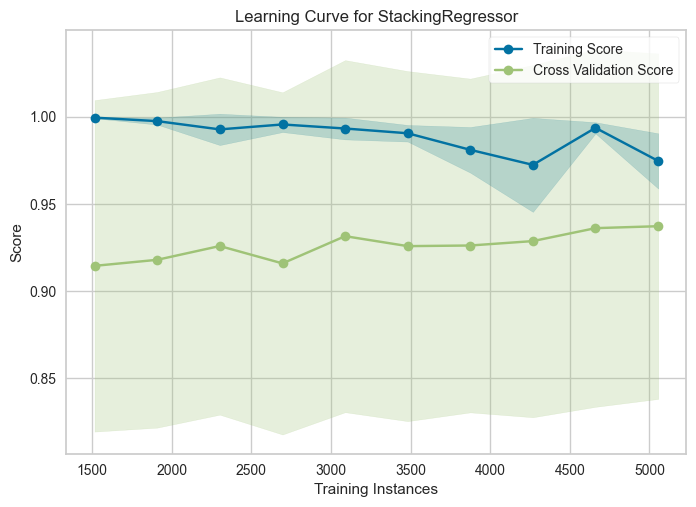

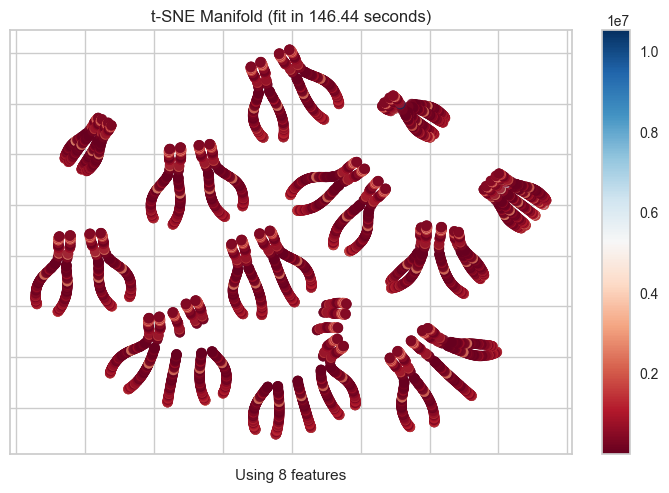

,Parameters
cv,5
estimators,"[('Random Forest Regressor', RandomForestRegre..."
final_estimator,LinearRegression(n_jobs=-1)
n_jobs,1
passthrough,True
verbose,0



 
 >>plotting is  DONE! 
 


 
 >> Prediction with Model:stacker3  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,43857.9164,8692960360.5507,93236.0465,0.9840,0.3246,0.1979
1,42378.1483,12143073821.3952,110195.6162,0.9764,0.4111,0.4130
2,31134.4232,2288449068.7691,47837.7369,0.9957,0.3485,0.3076
3,61697.4700,5737091807.9142,75743.5925,0.9889,0.5624,0.7068
4,136565.0087,127464837921.7818,357022.1813,0.8191,0.6294,0.8543
5,135086.3502,105332468856.1668,324549.6400,0.8542,0.5637,0.5853
6,53036.5626,9613623107.7703,98049.0852,0.9824,0.7695,0.6270
7,43942.6726,9390137005.7039,96902.7193,0.9821,0.6850,0.6363
8,29833.0356,1884083406.0981,43406.0296,0.9965,0.4866,0.6113


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,43857.9164,8692960360.5498,93236.0465,0.9840,0.3246,0.1979
1,42378.1483,12143073821.3953,110195.6162,0.9764,0.4111,0.4130
2,31134.4232,2288449068.7696,47837.7369,0.9957,0.3485,0.3076
3,61697.4700,5737091807.9137,75743.5925,0.9889,0.5624,0.7068
4,136565.0087,127464837921.7821,357022.1813,0.8191,0.6294,0.8543
5,135086.3502,105332468856.1631,324549.6400,0.8542,0.5637,0.5853
6,53036.5626,9613623107.7709,98049.0852,0.9824,0.7695,0.6270
7,43942.6726,9390137005.7036,96902.7193,0.9821,0.6850,0.6363
8,29833.0356,1884083406.0980,43406.0296,0.9965,0.4866,0.6113


Fitting 10 folds for each of 2 candidates, totalling 20 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,63886.9902,15609273790.0983,124937.0793,0.9751,0.6480,0.5766


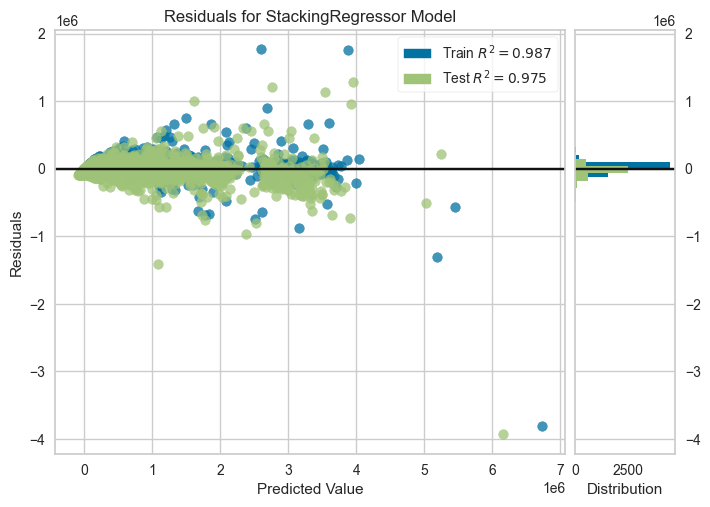

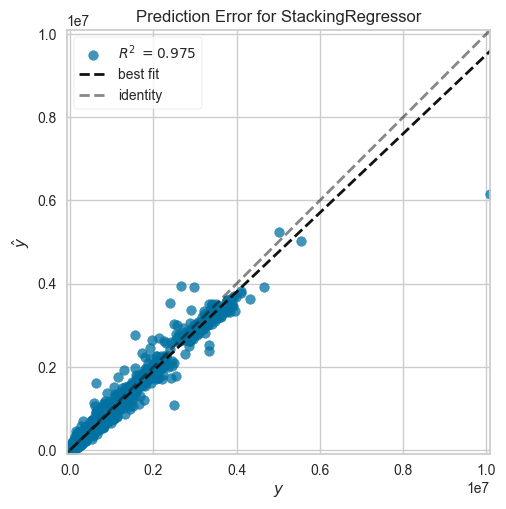

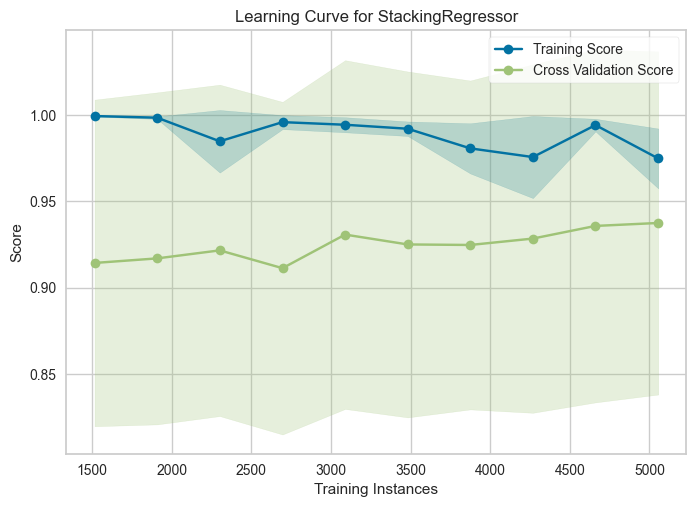

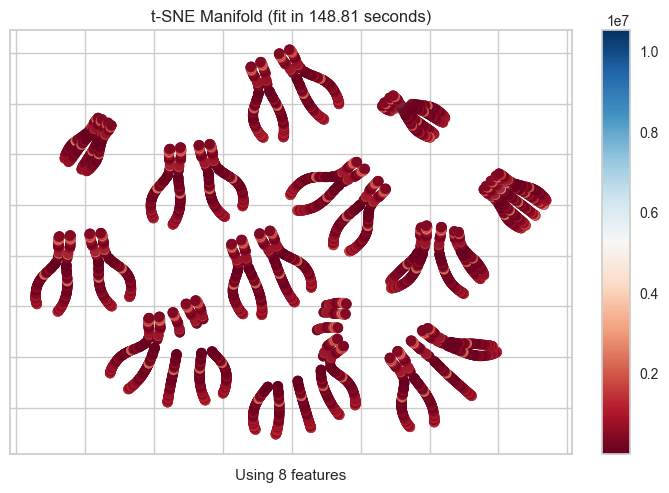

,Parameters
cv,5
estimators,"[('Random Forest Regressor', RandomForestRegre..."
final_estimator,LinearRegression(n_jobs=-1)
n_jobs,1
passthrough,True
verbose,0



 
 >>plotting is  DONE! 
 


 
 >> Prediction with Model:stacker4  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,42032.8989,7391967513.5113,85976.5521,0.9864,0.4279,0.2506
1,42434.5844,12145644671.7978,110207.2805,0.9764,0.4224,0.4199
2,30990.2580,2306391511.4014,48024.9051,0.9957,0.3553,0.3013
3,60285.6623,5471317650.4675,73968.3557,0.9895,0.5529,0.6778
4,132209.8641,127303323325.3444,356795.9127,0.8193,0.6332,0.8817
5,135087.6674,105309137234.5219,324513.6934,0.8543,0.5636,0.5852
6,52934.4258,9514863356.5119,97544.1611,0.9825,0.7933,0.6246
7,43919.1795,9385742608.1025,96880.0424,0.9821,0.6568,0.6381
8,30277.9771,1926732107.1496,43894.5567,0.9965,0.4895,0.5796


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,41962.0186,7378225681.2966,85896.5988,0.9864,0.4193,0.2498
1,42307.5639,12413341586.0913,111415.1766,0.9759,0.4259,0.4211
2,30986.3511,2308472356.4565,48046.5645,0.9957,0.3511,0.3006
3,60262.5289,5469028082.4439,73952.8774,0.9895,0.5528,0.6777
4,132813.0417,128034789512.0767,357819.4929,0.8183,0.6321,0.8768
5,135087.5897,105290327614.1004,324484.7109,0.8543,0.5635,0.5851
6,52941.3485,9522782420.3750,97584.7448,0.9825,0.7971,0.6248
7,43924.5245,9386698479.8682,96884.9755,0.9821,0.6596,0.6377
8,30281.7910,1927245171.9347,43900.4006,0.9965,0.4933,0.5796


Fitting 10 folds for each of 2 candidates, totalling 20 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,63715.9118,15182895377.2412,123218.8921,0.9758,0.6383,0.5639


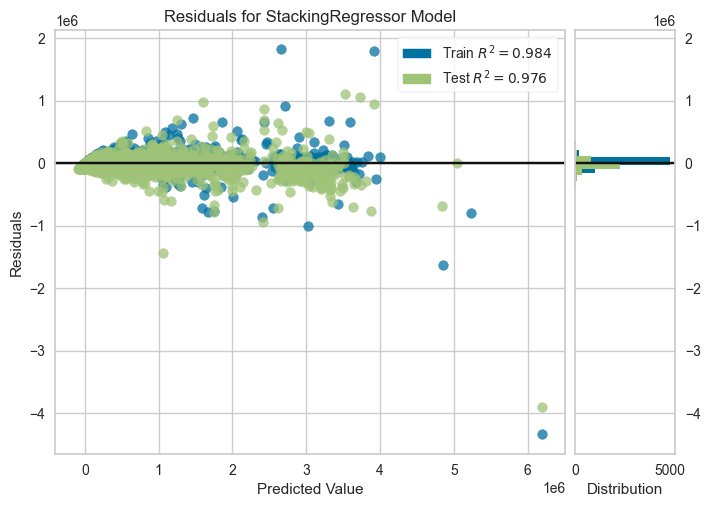

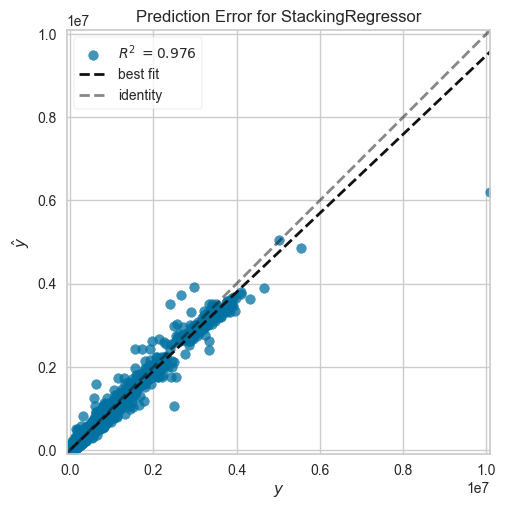

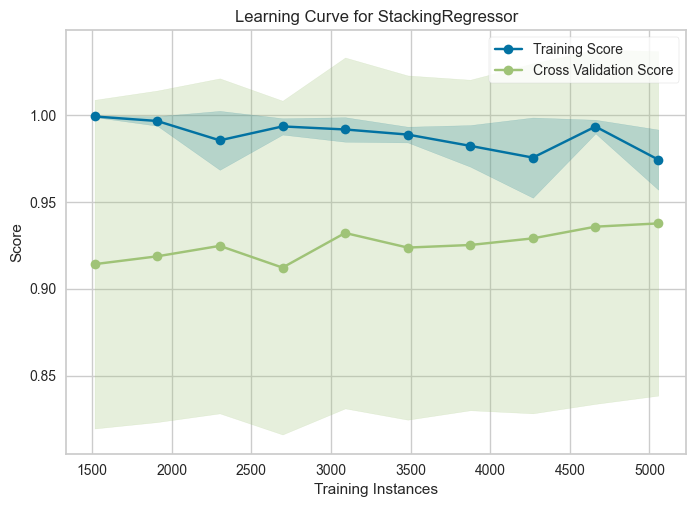

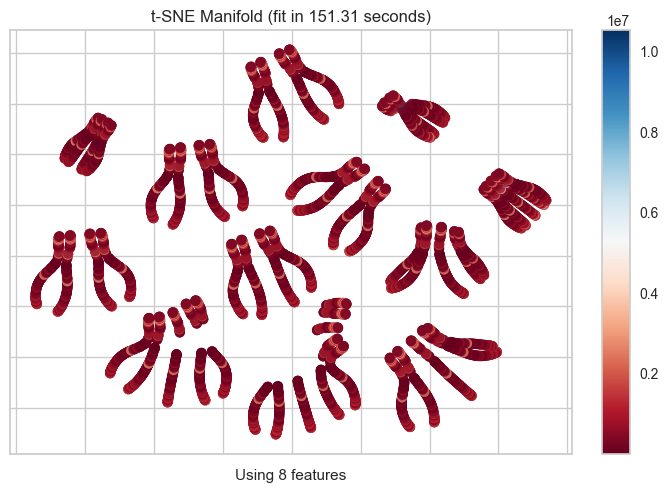

,Parameters
cv,5
estimators,"[('Random Forest Regressor', RandomForestRegre..."
final_estimator,LinearRegression(n_jobs=-1)
n_jobs,1
passthrough,True
verbose,0



 
 >>plotting is  DONE! 
 


 
 >> Prediction with Model:stacker5  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,42931.0207,10369954095.9915,101832.9716,0.9810,0.1454,0.0951
1,37471.2767,6640854764.2445,81491.4398,0.9871,0.1465,0.0866
2,25364.7251,2179020800.9947,46679.9829,0.9959,0.0962,0.0621
3,33066.1018,3845208294.1266,62009.7435,0.9926,0.1347,0.0854
4,94035.6775,117407584655.4909,342647.9019,0.8333,0.2642,0.1908
5,138500.6143,112757650608.7908,335794.0598,0.8440,0.4029,0.3297
6,36869.6033,5211949586.8346,72193.8334,0.9904,0.1369,0.0884
7,36489.3068,8846309252.6554,94054.8205,0.9831,0.1353,0.0821
8,24303.2489,1791578578.0363,42327.0431,0.9967,0.1243,0.0729


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Bagging Regressor,47537.2110,18808164477.8489,137142.8616,0.9700,0.1820,0.1130


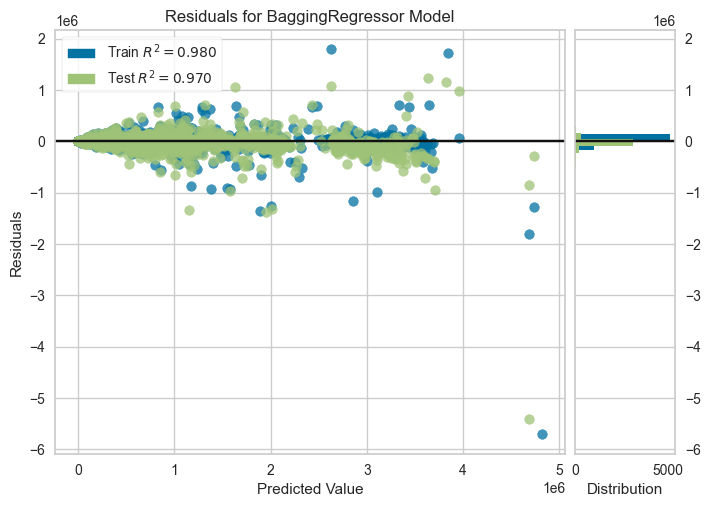

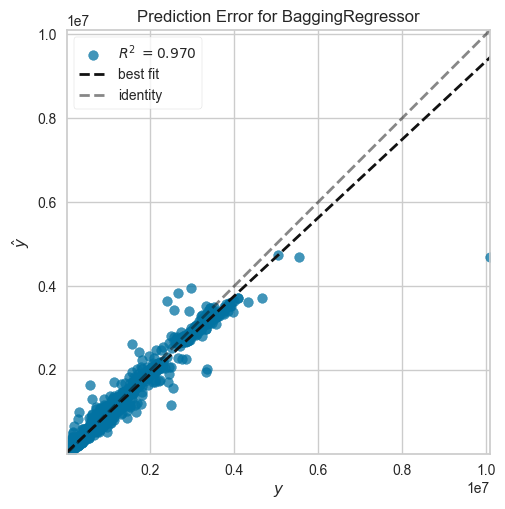

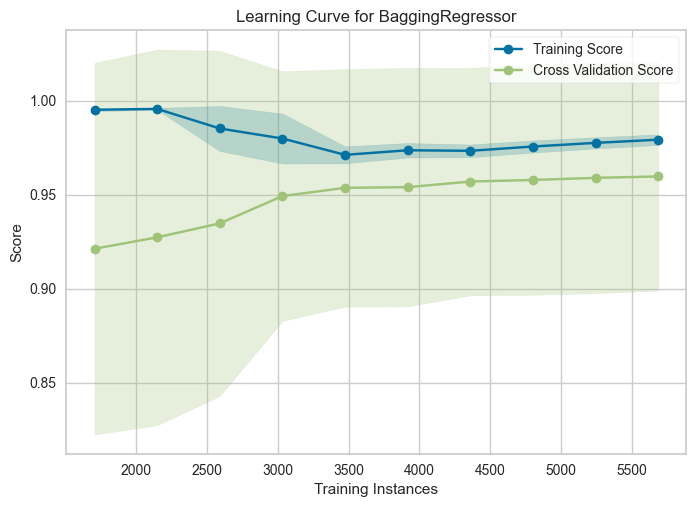

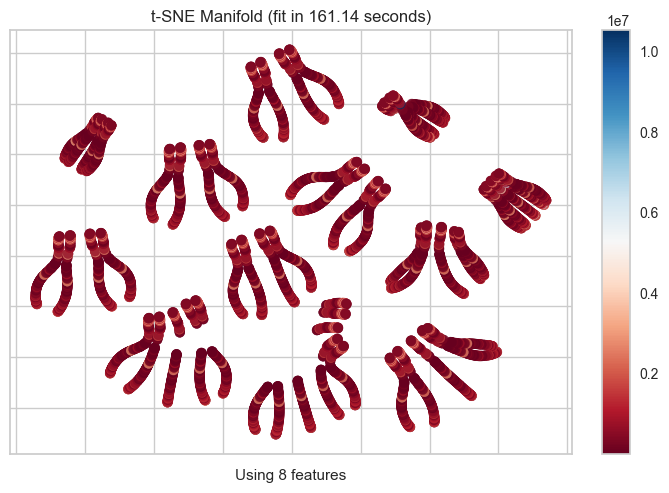

,Parameters
base_estimator,deprecated
bootstrap,True
bootstrap_features,False
estimator,"RandomForestRegressor(n_jobs=-1, random_state=..."
max_features,1.0
max_samples,1.0
n_estimators,10
n_jobs,1
oob_score,False
random_state,7065



 
 >>plotting is  DONE! 
 


 
 >> Prediction with Model:bagged_best  IS  DONE!


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,39906.8840,8653698202.4684,93025.2557,0.9841,0.1384,0.0903
1,38415.1695,9285612503.7320,96361.8830,0.9819,0.1516,0.0880
2,24242.4190,1937253290.6230,44014.2396,0.9964,0.0929,0.0597
3,29082.4127,2603665308.1845,51026.1238,0.9950,0.1178,0.0748
4,89500.0076,132487252279.4820,363987.9837,0.8119,0.2423,0.1685
5,136199.5584,100267944547.9350,316651.1401,0.8612,0.3786,0.3102
6,37428.3983,7904336987.1647,88906.3383,0.9855,0.1411,0.0888
7,36558.4953,9067646063.8603,95224.1884,0.9827,0.1292,0.0793
8,23853.5266,1793520283.2872,42349.9738,0.9967,0.1237,0.0706


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,AdaBoost Regressor,39373.5092,7976054496.0073,89308.7593,0.9873,0.1557,0.0924


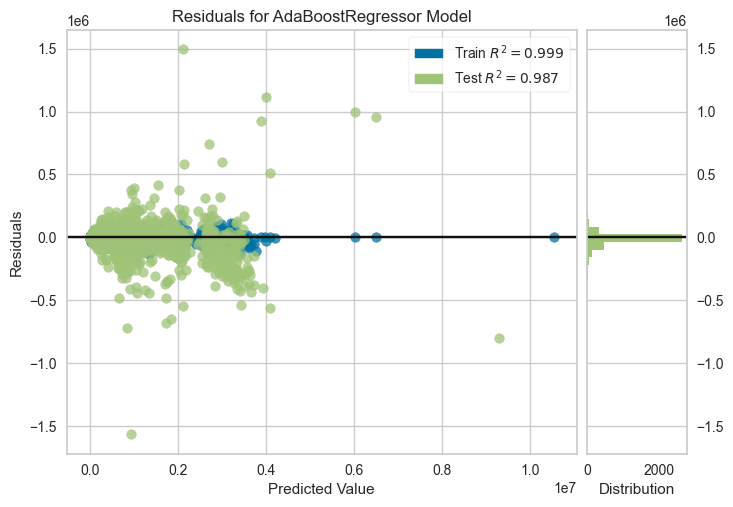

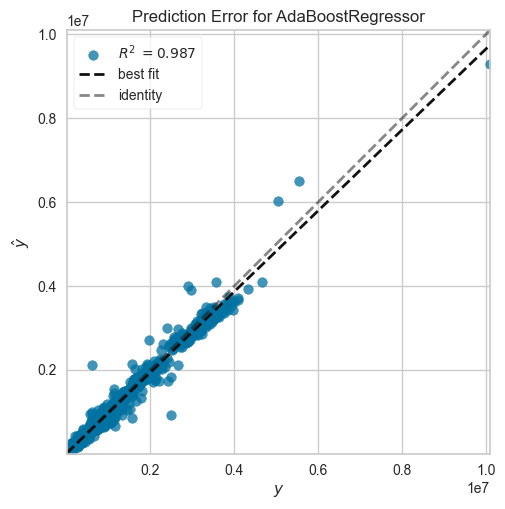

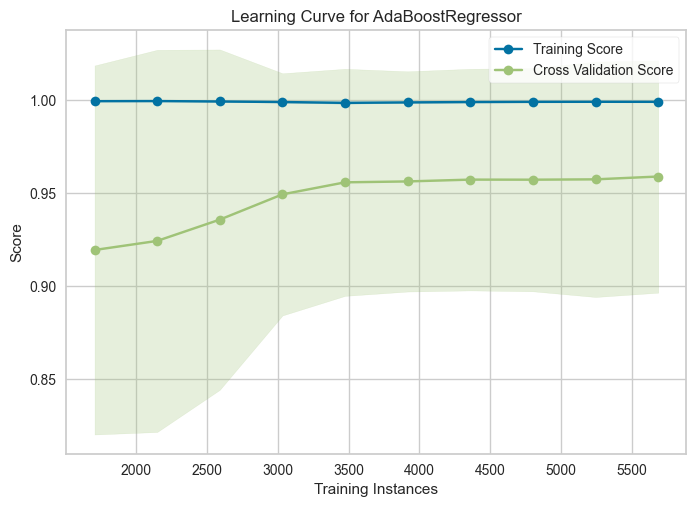

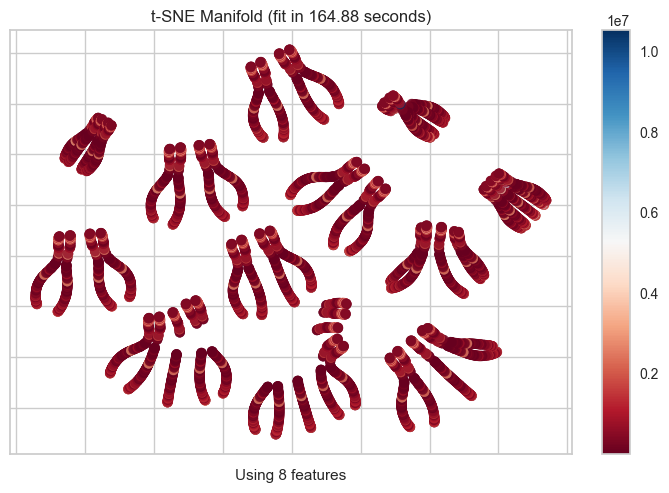

,Parameters
base_estimator,deprecated
estimator,"RandomForestRegressor(n_jobs=-1, random_state=..."
learning_rate,1.0
loss,linear
n_estimators,10
random_state,7065



 
 >>plotting is  DONE! 
 


 
 >> Prediction with Model:boosted_best  IS  DONE!

 >create_models func is Done! 

>>>>>>>>>>> Experience 52 is DONE! <<<<<<<<<<<<


In [6]:
# 6-Setting parameters and executing the experiment
mdls = ['xgboost', 'catboost', 'tr', 'lightgbm', 'gbr', 'huber', 'ada', 'par', 'omp', 'en', 'lasso', 'llar', 'br', 'ridge', 'lar', 'lr','dt', 'rf', 'et']
# excluded: 'dummy', 'knn', 'ransac', 'tr', 'kr', 'svm'
#mdls = ['xgboost', 'rf']

#['blend', 'bag', 'boost', 'stack']
mix_mdls = ['blend2', 'blend3', 'blend4', 'blend5', 'stacker2', 'stacker3', 'stacker4', 'stacker5', 'bagged_best', 'boosted_best']

experiment52(dataset_sub3, '2011-10-19', mdls, mix_mdls)